## Create Initial states

In [1]:
import numpy as np
from pathlib import Path
# Data processing
from pickle import load,dump

import os

import matplotlib.pyplot as plt 
import pandas as pd
# Custom modules
from src.particle_filter import ParticleFilter
from src.gmp import GammaMixtureProcess
from src.deg_models import DistModel,CombinedGammaLoss, fit
from src.helpers.data_processing import interpolate
from src.helpers.math import gamma_stats2params as stats2params

/home/abeldg/code/repo/research/dl-system-level-rul/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
data_name = "DS03"

experiment_dir = Path('experiments')/data_name
states_dir = experiment_dir/'states'
os.makedirs(states_dir, exist_ok=True)

## Import training data


In [4]:
hi_train = pd.read_csv(experiment_dir/'hidata_dev.csv')
perform_alias = [col for col in hi_train.columns if col not in ['unit','cycle']]
units = hi_train['unit'].unique().tolist()

In [5]:
performs_train = {alias: 
    {int(unit): hi_train[hi_train['unit']==unit][alias].values for unit in units} 
    for alias in perform_alias
}
time_train = {int(unit): hi_train[hi_train['unit']==unit]['cycle'].values for unit in units}

In [6]:
performs_train['T48'][1].shape

(72,)

## Create Initial Particles (Training)
The number of (pure) particles $N$ is the the number of training trajectories.

### Create initial states

Epoch 1000, Best Loss: 1.4492230415344238
Epoch 2000, Best Loss: 1.3563294410705566
Epoch 3000, Best Loss: 1.2887682914733887
Epoch 4000, Best Loss: 1.2318391799926758
Epoch 5000, Best Loss: 1.1818811893463135
Epoch 6000, Best Loss: 1.13804030418396
Epoch 7000, Best Loss: 1.0996965169906616
Epoch 8000, Best Loss: 1.0663036108016968
Epoch 9000, Best Loss: 1.0373542308807373
Epoch 10000, Best Loss: 1.0122807025909424
Epoch 11000, Best Loss: 0.9906554222106934
Epoch 12000, Best Loss: 0.9719854593276978
Epoch 13000, Best Loss: 0.9559181332588196
Epoch 14000, Best Loss: 0.9421024322509766
Epoch 15000, Best Loss: 0.9303008913993835
Epoch 16000, Best Loss: 0.9202712178230286
Epoch 17000, Best Loss: 0.9118096232414246
Epoch 18000, Best Loss: 0.9047483801841736
Epoch 19000, Best Loss: 0.8989113569259644
Epoch 20000, Best Loss: 0.8941494226455688


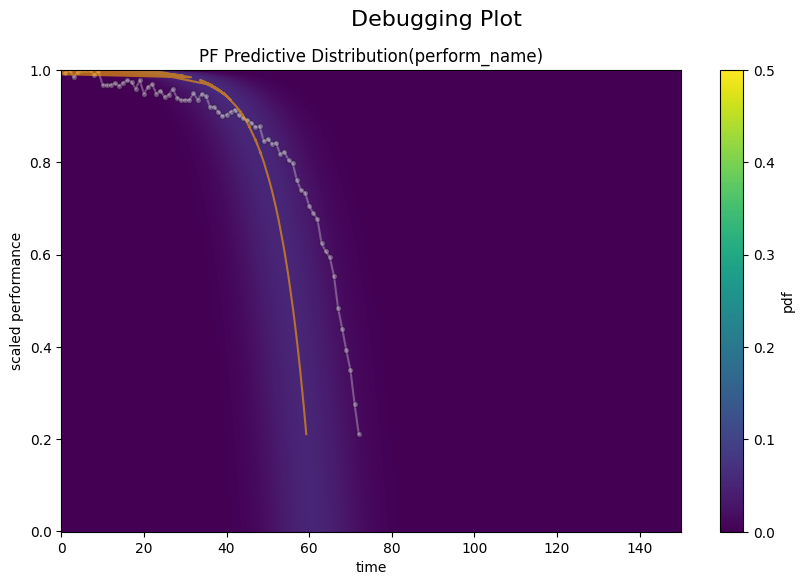

Epoch 21000, Best Loss: 0.8903348445892334
Epoch 22000, Best Loss: 0.887346088886261
Epoch 23000, Best Loss: 0.8850569725036621
Epoch 24000, Best Loss: 0.8833713531494141
Epoch 25000, Best Loss: 0.8821577429771423
Epoch 26000, Best Loss: 0.8812881112098694
Epoch 27000, Best Loss: 0.8806114196777344
Epoch 28000, Best Loss: 0.8799752593040466
Epoch 29000, Best Loss: 0.8793045878410339
Epoch 30000, Best Loss: 0.8786022663116455
Epoch 31000, Best Loss: 0.8778836131095886
Epoch 32000, Best Loss: 0.8771582245826721
Epoch 33000, Best Loss: 0.8764262795448303
Epoch 34000, Best Loss: 0.8756852149963379
Epoch 35000, Best Loss: 0.8749343752861023
Epoch 36000, Best Loss: 0.8741755485534668
Epoch 37000, Best Loss: 0.873406171798706
Epoch 38000, Best Loss: 0.8726270198822021
Epoch 39000, Best Loss: 0.8718353509902954
Epoch 40000, Best Loss: 0.8710303902626038


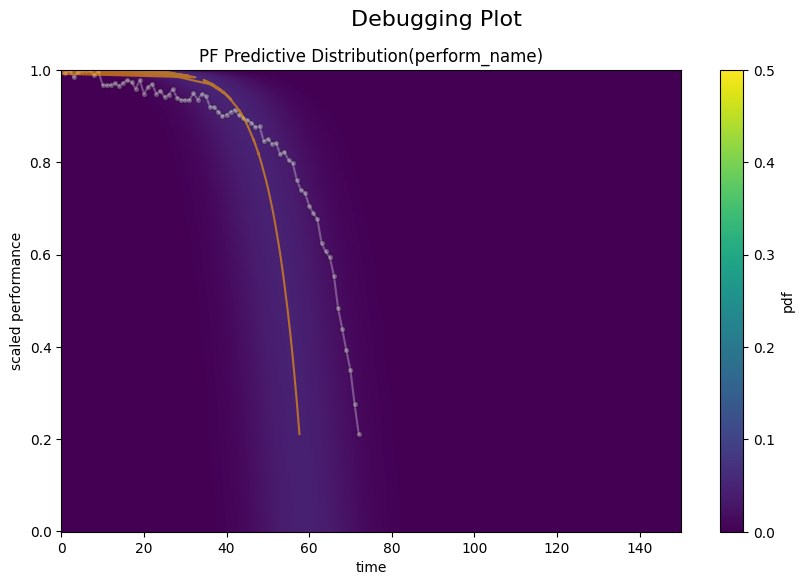

Epoch 41000, Best Loss: 0.8702145218849182
Epoch 42000, Best Loss: 0.8693841695785522
Epoch 43000, Best Loss: 0.8685392737388611
Epoch 44000, Best Loss: 0.8676803708076477
Epoch 45000, Best Loss: 0.8668068051338196
Epoch 46000, Best Loss: 0.8659163117408752
Epoch 47000, Best Loss: 0.8650082945823669
Epoch 48000, Best Loss: 0.8640825748443604
Epoch 49000, Best Loss: 0.8631377816200256
Epoch 50000, Best Loss: 0.8621721863746643
Epoch 51000, Best Loss: 0.8611851930618286
Epoch 52000, Best Loss: 0.8601765632629395
Epoch 53000, Best Loss: 0.8591433763504028
Epoch 54000, Best Loss: 0.8580865859985352
Epoch 55000, Best Loss: 0.8570033311843872
Epoch 56000, Best Loss: 0.8558923602104187
Epoch 57000, Best Loss: 0.854752779006958
Epoch 58000, Best Loss: 0.8535836338996887
Epoch 59000, Best Loss: 0.8523802161216736
Epoch 60000, Best Loss: 0.8511428833007812


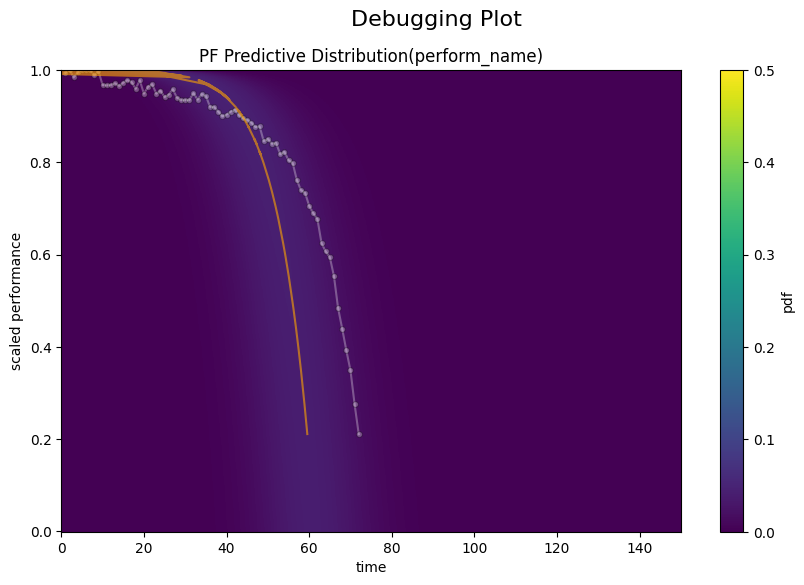

Epoch 61000, Best Loss: 0.8498688340187073
Epoch 62000, Best Loss: 0.8485573530197144
Epoch 63000, Best Loss: 0.8472044467926025
Epoch 64000, Best Loss: 0.8458094000816345
Epoch 65000, Best Loss: 0.8443687558174133
Epoch 66000, Best Loss: 0.842877984046936
Epoch 67000, Best Loss: 0.8413376212120056
Epoch 68000, Best Loss: 0.839756429195404
Epoch 69000, Best Loss: 0.8381279706954956
Epoch 70000, Best Loss: 0.8364434242248535
Epoch 71000, Best Loss: 0.8347008228302002
Epoch 72000, Best Loss: 0.8329178094863892
Epoch 73000, Best Loss: 0.8310741186141968
Epoch 74000, Best Loss: 0.8291752934455872
Epoch 75000, Best Loss: 0.8272276520729065
Epoch 76000, Best Loss: 0.8252170085906982
Epoch 77000, Best Loss: 0.8231592774391174
Epoch 78000, Best Loss: 0.8210391402244568
Epoch 79000, Best Loss: 0.8188658952713013
Epoch 80000, Best Loss: 0.8166326284408569


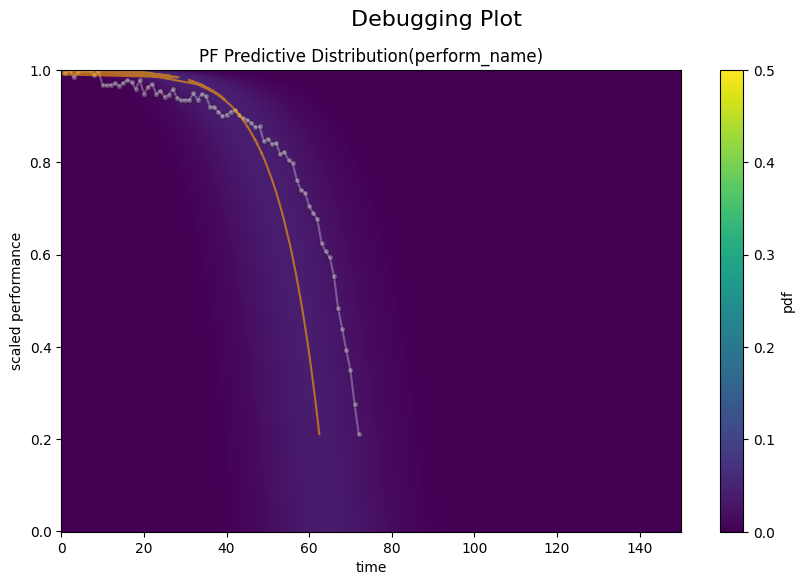

Epoch 81000, Best Loss: 0.8143407702445984
Epoch 82000, Best Loss: 0.811991274356842
Epoch 83000, Best Loss: 0.8095749020576477
Epoch 84000, Best Loss: 0.8071002960205078
Epoch 85000, Best Loss: 0.8045637607574463
Epoch 86000, Best Loss: 0.8019617795944214
Epoch 87000, Best Loss: 0.7992916703224182
Epoch 88000, Best Loss: 0.7965567111968994
Epoch 89000, Best Loss: 0.7937439680099487
Epoch 90000, Best Loss: 0.7908666729927063
Epoch 91000, Best Loss: 0.7879061698913574
Epoch 92000, Best Loss: 0.7848795056343079
Epoch 93000, Best Loss: 0.7817683219909668
Epoch 94000, Best Loss: 0.7785797119140625
Epoch 95000, Best Loss: 0.7753138542175293
Epoch 96000, Best Loss: 0.7719584703445435
Epoch 97000, Best Loss: 0.7685258388519287
Epoch 98000, Best Loss: 0.7650148868560791
Epoch 99000, Best Loss: 0.7614147067070007
Best value: 0.7577294707298279
Best parameters: {'p': 10.389822006225586, 'mu': 64.4764175415039, 'a': 1.0000000000170115, 'mean': 133.32916259765625, 'var': 140.83712768554688}


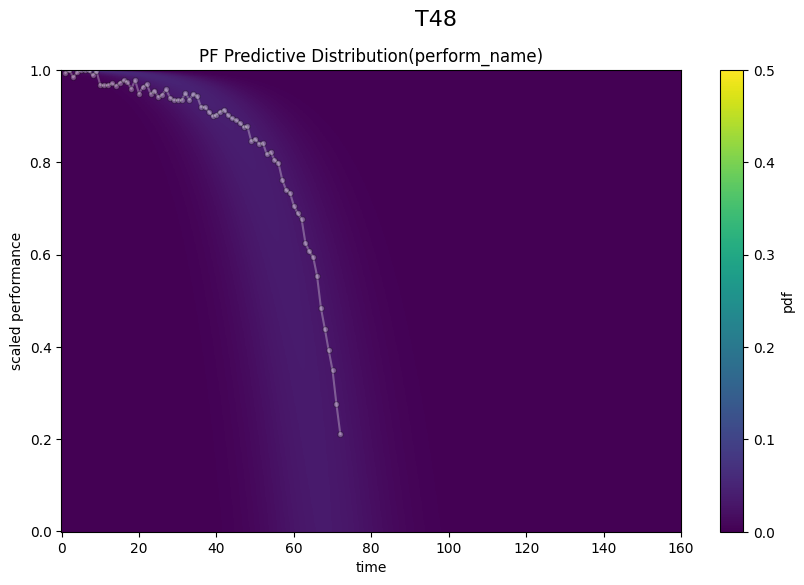

Epoch 1000, Best Loss: 0.7672876715660095
Epoch 2000, Best Loss: 0.6930719614028931
Epoch 3000, Best Loss: 0.6249170899391174
Epoch 4000, Best Loss: 0.5661142468452454
Epoch 5000, Best Loss: 0.5102849006652832
Epoch 6000, Best Loss: 0.46133506298065186
Epoch 7000, Best Loss: 0.41783666610717773
Epoch 8000, Best Loss: 0.37638187408447266
Epoch 9000, Best Loss: 0.32957392930984497
Epoch 10000, Best Loss: 0.27334994077682495
Epoch 11000, Best Loss: 0.21818876266479492
Epoch 12000, Best Loss: 0.18569381535053253
Epoch 13000, Best Loss: 0.17903736233711243
Epoch 14000, Best Loss: 0.1787346452474594
Epoch 15000, Best Loss: 0.178660050034523
Epoch 16000, Best Loss: 0.1785741001367569
Epoch 17000, Best Loss: 0.17847196757793427
Epoch 18000, Best Loss: 0.17835211753845215
Epoch 19000, Best Loss: 0.17821474373340607
Epoch 20000, Best Loss: 0.1780681610107422


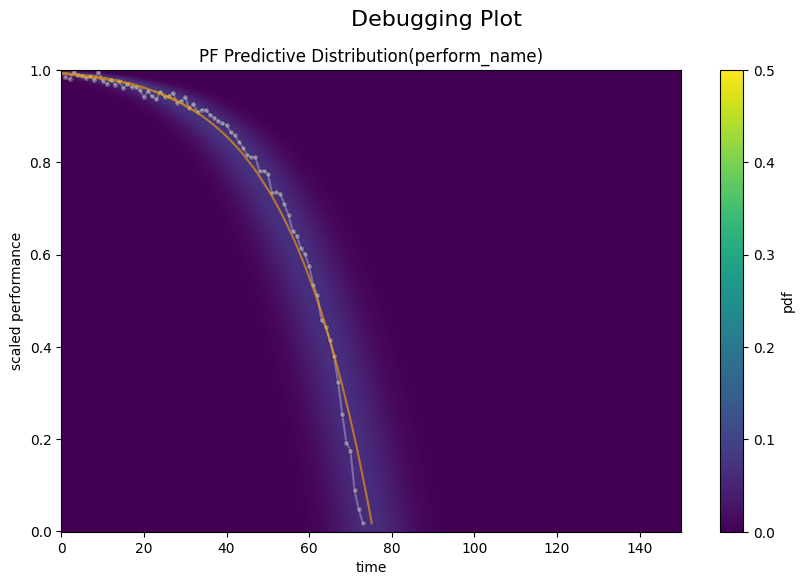

Epoch 21000, Best Loss: 0.1779153198003769
Epoch 22000, Best Loss: 0.17776228487491608
Epoch 23000, Best Loss: 0.17760902643203735
Epoch 24000, Best Loss: 0.17745482921600342
Epoch 25000, Best Loss: 0.17730024456977844
Epoch 26000, Best Loss: 0.1771470606327057
Epoch 27000, Best Loss: 0.1769930124282837
Epoch 28000, Best Loss: 0.176838219165802
Epoch 29000, Best Loss: 0.1766834706068039
Epoch 30000, Best Loss: 0.1765289306640625
Epoch 31000, Best Loss: 0.17637485265731812
Epoch 32000, Best Loss: 0.17622271180152893
Epoch 33000, Best Loss: 0.1760663390159607
Epoch 34000, Best Loss: 0.17591483891010284
Epoch 35000, Best Loss: 0.1757584512233734
Epoch 36000, Best Loss: 0.17560210824012756
Epoch 37000, Best Loss: 0.1754498928785324
Epoch 38000, Best Loss: 0.17529913783073425
Epoch 39000, Best Loss: 0.17514824867248535
Epoch 40000, Best Loss: 0.17499805986881256


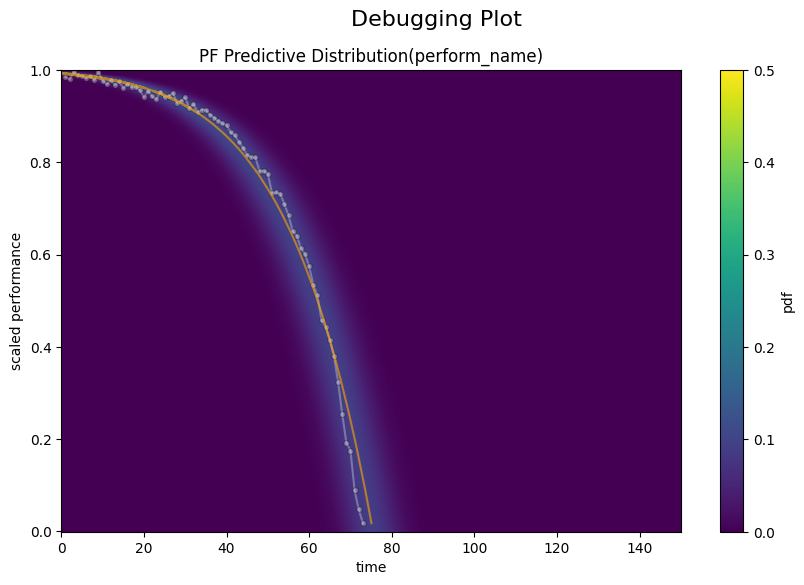

Epoch 41000, Best Loss: 0.17485162615776062
Epoch 42000, Best Loss: 0.17470866441726685
Epoch 43000, Best Loss: 0.17456917464733124
Epoch 44000, Best Loss: 0.17443332076072693
Epoch 45000, Best Loss: 0.17430292069911957
Epoch 46000, Best Loss: 0.17418241500854492
Epoch 47000, Best Loss: 0.17406491935253143
Epoch 48000, Best Loss: 0.17396439611911774
Epoch 49000, Best Loss: 0.17387309670448303
Epoch 50000, Best Loss: 0.1737910509109497
Epoch 51000, Best Loss: 0.17371448874473572
Epoch 52000, Best Loss: 0.17363837361335754
Epoch 53000, Best Loss: 0.17356552183628082
Epoch 54000, Best Loss: 0.17349062860012054
Epoch 55000, Best Loss: 0.1734156459569931
Epoch 56000, Best Loss: 0.17334258556365967
Epoch 57000, Best Loss: 0.17327623069286346
Epoch 58000, Best Loss: 0.17319881916046143
Epoch 59000, Best Loss: 0.17313112318515778
Epoch 60000, Best Loss: 0.1730598658323288


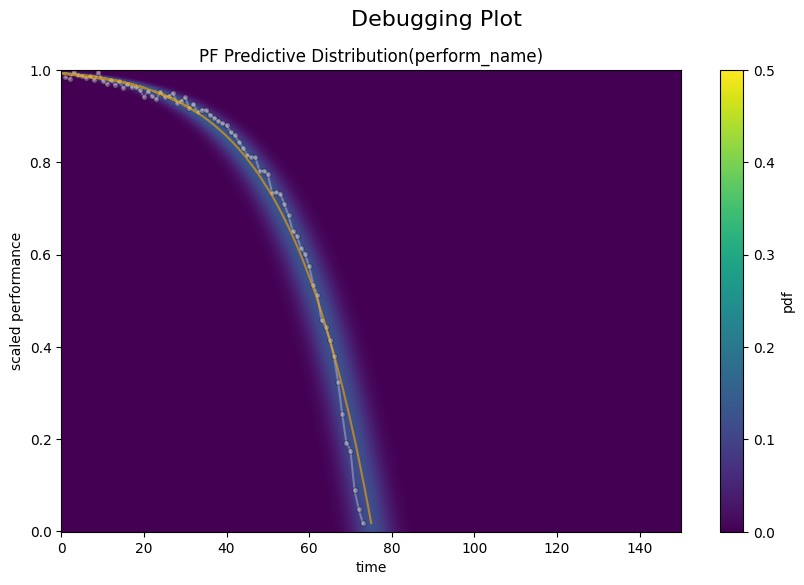

Epoch 61000, Best Loss: 0.17299135029315948
Epoch 62000, Best Loss: 0.17292289435863495
Epoch 63000, Best Loss: 0.17285388708114624
Epoch 64000, Best Loss: 0.17278560996055603
Epoch 65000, Best Loss: 0.1727200746536255
Epoch 66000, Best Loss: 0.17265388369560242
Epoch 67000, Best Loss: 0.1725921779870987
Epoch 68000, Best Loss: 0.1725235879421234
Epoch 69000, Best Loss: 0.17246147990226746
Epoch 70000, Best Loss: 0.17239709198474884
Epoch 71000, Best Loss: 0.1723344773054123
Epoch 72000, Best Loss: 0.172271728515625
Epoch 73000, Best Loss: 0.17220859229564667
Epoch 74000, Best Loss: 0.17214734852313995
Epoch 75000, Best Loss: 0.17208774387836456
Epoch 76000, Best Loss: 0.17202644050121307
Epoch 77000, Best Loss: 0.17196537554264069
Epoch 78000, Best Loss: 0.1719077080488205
Epoch 79000, Best Loss: 0.17184802889823914
Epoch 80000, Best Loss: 0.1717897206544876


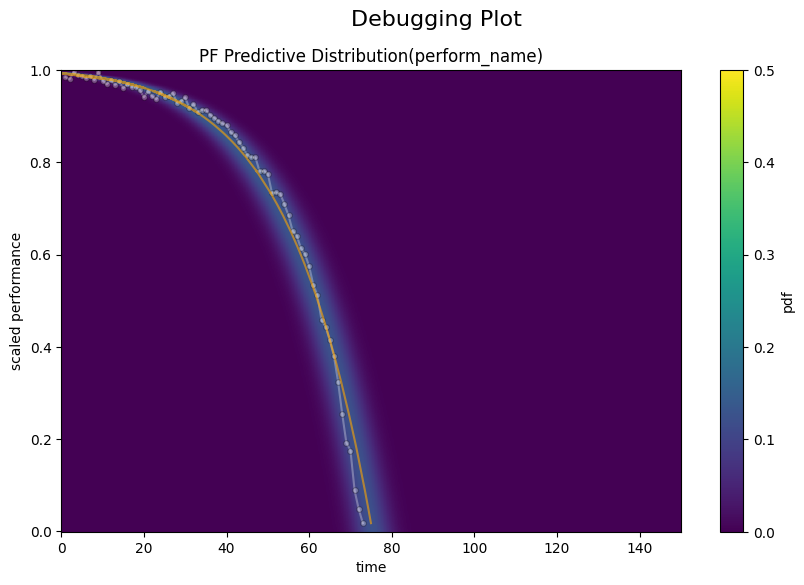

Epoch 81000, Best Loss: 0.1717279553413391
Epoch 82000, Best Loss: 0.1716734915971756
Epoch 83000, Best Loss: 0.17161798477172852
Epoch 84000, Best Loss: 0.1715613454580307
Epoch 85000, Best Loss: 0.1715063452720642
Epoch 86000, Best Loss: 0.17145076394081116
Epoch 87000, Best Loss: 0.17139439284801483
Epoch 88000, Best Loss: 0.17133024334907532
Epoch 89000, Best Loss: 0.17127424478530884
Epoch 90000, Best Loss: 0.17121922969818115
Epoch 91000, Best Loss: 0.1711682379245758
Epoch 92000, Best Loss: 0.17111317813396454
Epoch 93000, Best Loss: 0.171061173081398
Epoch 94000, Best Loss: 0.17100977897644043
Epoch 95000, Best Loss: 0.17096200585365295
Epoch 96000, Best Loss: 0.17090684175491333
Epoch 97000, Best Loss: 0.17085756361484528
Epoch 98000, Best Loss: 0.1708056628704071
Epoch 99000, Best Loss: 0.17075736820697784
Best value: 0.17070947587490082
Best parameters: {'p': 15.652253150939941, 'mu': 231.58880615234375, 'a': 1.0061607772243641, 'mean': 306.73199462890625, 'var': 10.31823635

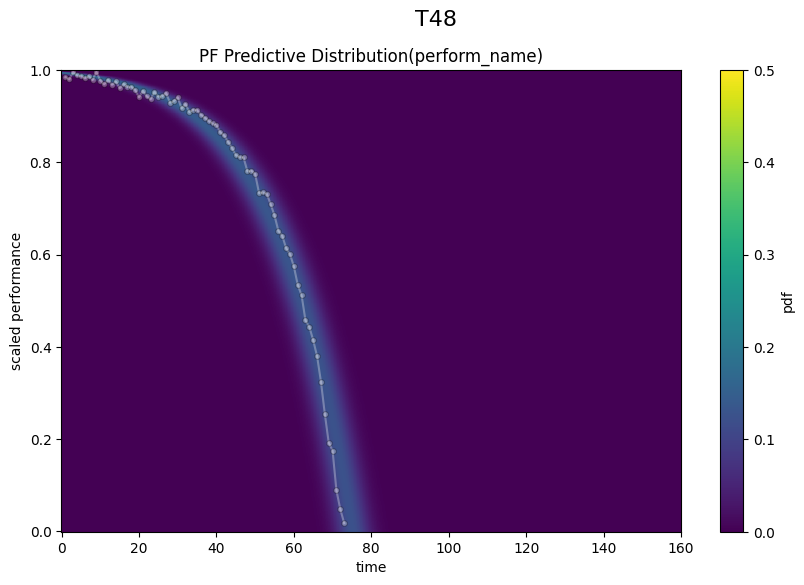

Epoch 1000, Best Loss: 1.195702075958252
Epoch 2000, Best Loss: 0.9559940695762634
Epoch 3000, Best Loss: 0.8369837403297424
Epoch 4000, Best Loss: 0.7374936938285828
Epoch 5000, Best Loss: 0.641110897064209
Epoch 6000, Best Loss: 0.552035391330719
Epoch 7000, Best Loss: 0.4704349935054779
Epoch 8000, Best Loss: 0.3984098434448242
Epoch 9000, Best Loss: 0.3375997543334961
Epoch 10000, Best Loss: 0.2871253490447998
Epoch 11000, Best Loss: 0.24559365212917328
Epoch 12000, Best Loss: 0.2228626161813736
Epoch 13000, Best Loss: 0.21825841069221497
Epoch 14000, Best Loss: 0.21799704432487488
Epoch 15000, Best Loss: 0.21794097125530243
Epoch 16000, Best Loss: 0.21788524091243744
Epoch 17000, Best Loss: 0.21782508492469788
Epoch 18000, Best Loss: 0.2177596539258957
Epoch 19000, Best Loss: 0.21768660843372345
Epoch 20000, Best Loss: 0.2176041305065155


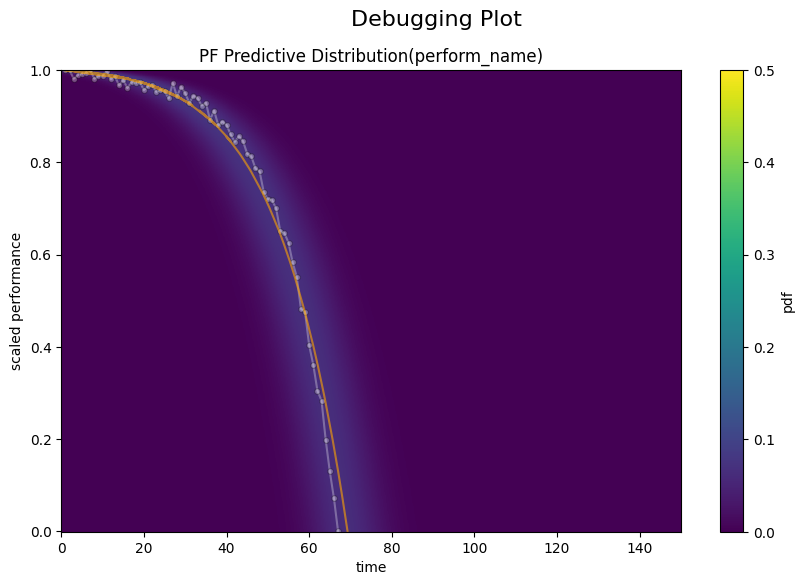

Epoch 21000, Best Loss: 0.21750874817371368
Epoch 22000, Best Loss: 0.21740084886550903
Epoch 23000, Best Loss: 0.21728849411010742
Epoch 24000, Best Loss: 0.2171708345413208
Epoch 25000, Best Loss: 0.2170546054840088
Epoch 26000, Best Loss: 0.21693791449069977
Epoch 27000, Best Loss: 0.2168215662240982
Epoch 28000, Best Loss: 0.21670332551002502
Epoch 29000, Best Loss: 0.21658657491207123
Epoch 30000, Best Loss: 0.21646997332572937
Epoch 31000, Best Loss: 0.2163572609424591
Epoch 32000, Best Loss: 0.21624313294887543
Epoch 33000, Best Loss: 0.21613124012947083
Epoch 34000, Best Loss: 0.21602118015289307
Epoch 35000, Best Loss: 0.21591120958328247
Epoch 36000, Best Loss: 0.21580339968204498
Epoch 37000, Best Loss: 0.21569788455963135
Epoch 38000, Best Loss: 0.21559613943099976
Epoch 39000, Best Loss: 0.21549969911575317
Epoch 40000, Best Loss: 0.21541008353233337


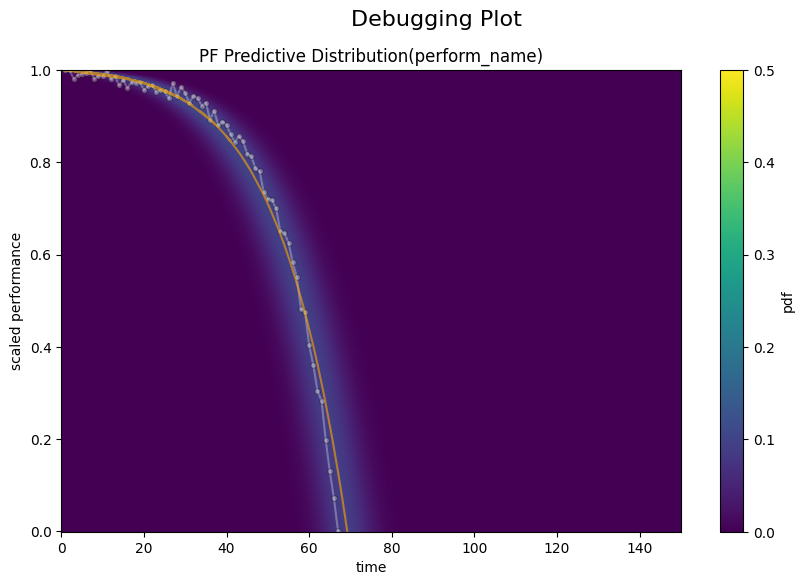

Epoch 41000, Best Loss: 0.21532395482063293
Epoch 42000, Best Loss: 0.21524198353290558
Epoch 43000, Best Loss: 0.21516874432563782
Epoch 44000, Best Loss: 0.2151038497686386
Epoch 45000, Best Loss: 0.21504482626914978
Epoch 46000, Best Loss: 0.214987650513649
Epoch 47000, Best Loss: 0.21493393182754517
Epoch 48000, Best Loss: 0.21487963199615479
Epoch 49000, Best Loss: 0.2148277312517166
Epoch 50000, Best Loss: 0.21477514505386353
Epoch 51000, Best Loss: 0.21472282707691193
Epoch 52000, Best Loss: 0.21467101573944092
Epoch 53000, Best Loss: 0.21462079882621765
Epoch 54000, Best Loss: 0.21456925570964813
Epoch 55000, Best Loss: 0.21451923251152039
Epoch 56000, Best Loss: 0.21446968615055084
Epoch 57000, Best Loss: 0.2144210934638977
Epoch 58000, Best Loss: 0.21437248587608337
Epoch 59000, Best Loss: 0.21432428061962128
Epoch 60000, Best Loss: 0.21426928043365479


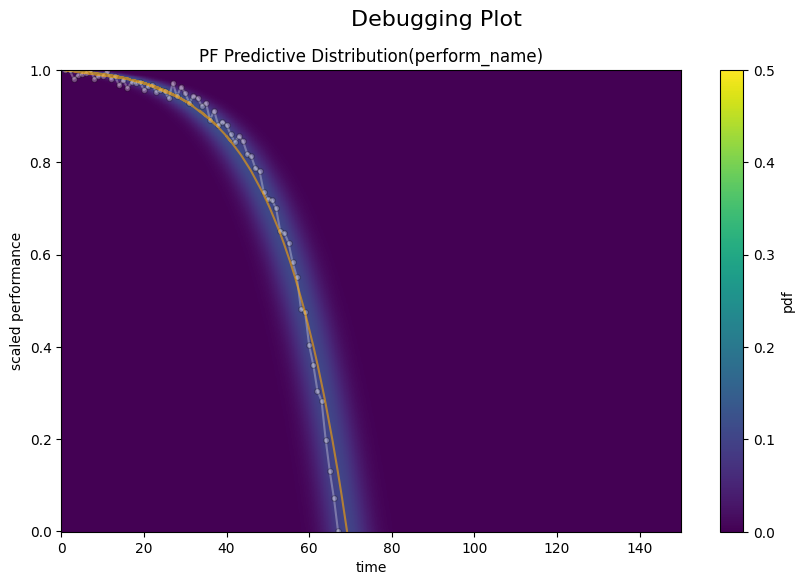

Epoch 61000, Best Loss: 0.21422332525253296
Epoch 62000, Best Loss: 0.21417711675167084
Epoch 63000, Best Loss: 0.21413080394268036
Epoch 64000, Best Loss: 0.21408386528491974
Epoch 65000, Best Loss: 0.21404050290584564
Epoch 66000, Best Loss: 0.21399465203285217
Epoch 67000, Best Loss: 0.2139507383108139
Epoch 68000, Best Loss: 0.21390612423419952
Epoch 69000, Best Loss: 0.21386288106441498
Epoch 70000, Best Loss: 0.2138180136680603
Epoch 71000, Best Loss: 0.21377556025981903
Epoch 72000, Best Loss: 0.21373350918293
Epoch 73000, Best Loss: 0.2136904001235962
Epoch 74000, Best Loss: 0.21364820003509521
Epoch 75000, Best Loss: 0.21360790729522705
Epoch 76000, Best Loss: 0.21356749534606934
Epoch 77000, Best Loss: 0.21352389454841614
Epoch 78000, Best Loss: 0.2134833186864853
Epoch 79000, Best Loss: 0.21344493329524994
Epoch 80000, Best Loss: 0.21340373158454895


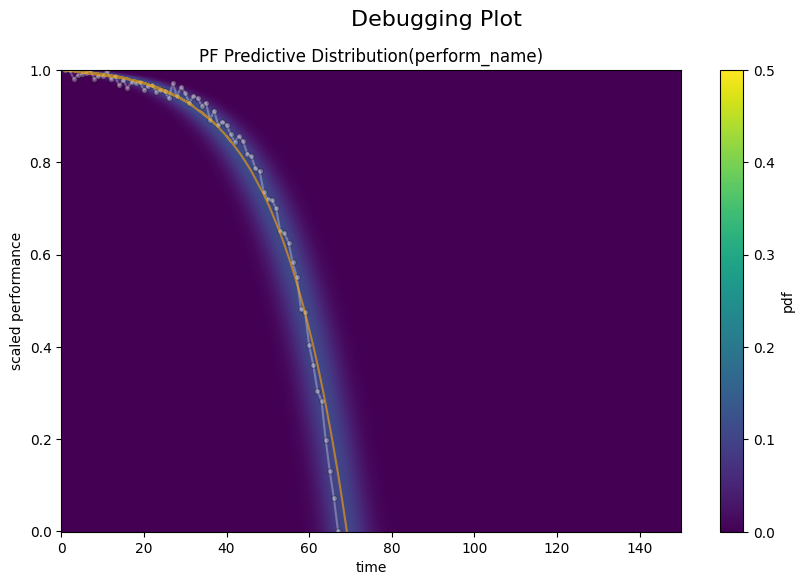

Epoch 81000, Best Loss: 0.21336600184440613
Epoch 82000, Best Loss: 0.21332798898220062
Epoch 83000, Best Loss: 0.21328993141651154
Epoch 84000, Best Loss: 0.2132503092288971
Epoch 85000, Best Loss: 0.2132108211517334
Epoch 86000, Best Loss: 0.21317458152770996
Epoch 87000, Best Loss: 0.2131367027759552
Epoch 88000, Best Loss: 0.21310026943683624
Epoch 89000, Best Loss: 0.2130616456270218
Epoch 90000, Best Loss: 0.2130233496427536
Epoch 91000, Best Loss: 0.2129891812801361
Epoch 92000, Best Loss: 0.21295495331287384
Epoch 93000, Best Loss: 0.21291802823543549
Epoch 94000, Best Loss: 0.21288222074508667
Epoch 95000, Best Loss: 0.2128491997718811
Epoch 96000, Best Loss: 0.2128150314092636
Epoch 97000, Best Loss: 0.2127777636051178
Epoch 98000, Best Loss: 0.21274372935295105
Epoch 99000, Best Loss: 0.21270900964736938
Best value: 0.2126750648021698
Best parameters: {'p': 18.689517974853516, 'mu': 232.15684509277344, 'a': 1.008071701115352, 'mean': 301.117919921875, 'var': 14.2678499221801

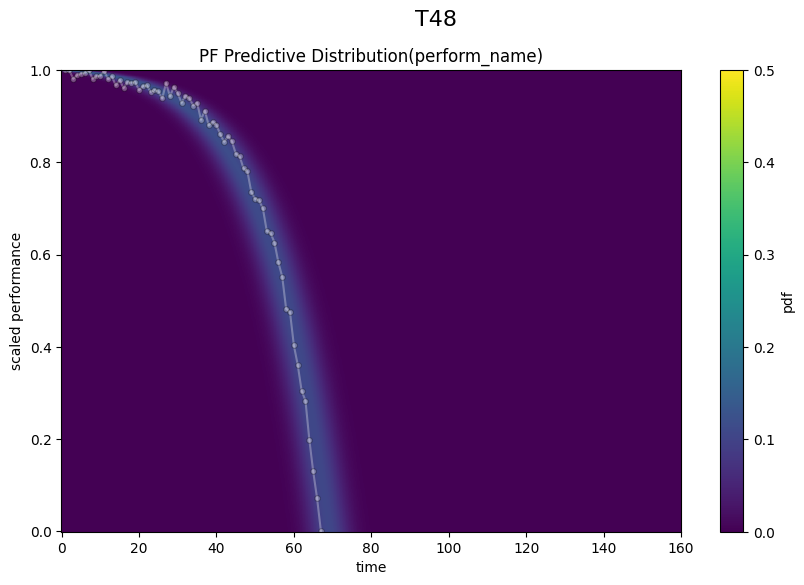

Epoch 1000, Best Loss: 1.0331532955169678
Epoch 2000, Best Loss: 0.9374323487281799
Epoch 3000, Best Loss: 0.8414180874824524
Epoch 4000, Best Loss: 0.7564185857772827
Epoch 5000, Best Loss: 0.6724728345870972
Epoch 6000, Best Loss: 0.5902307033538818
Epoch 7000, Best Loss: 0.5102078914642334
Epoch 8000, Best Loss: 0.4325939118862152
Epoch 9000, Best Loss: 0.35746484994888306
Epoch 10000, Best Loss: 0.28758201003074646
Epoch 11000, Best Loss: 0.23546934127807617
Epoch 12000, Best Loss: 0.21016602218151093
Epoch 13000, Best Loss: 0.20286962389945984
Epoch 14000, Best Loss: 0.20201542973518372
Epoch 15000, Best Loss: 0.2019297182559967
Epoch 16000, Best Loss: 0.20186088979244232
Epoch 17000, Best Loss: 0.20178917050361633
Epoch 18000, Best Loss: 0.20171430706977844
Epoch 19000, Best Loss: 0.20163606107234955
Epoch 20000, Best Loss: 0.2015509009361267


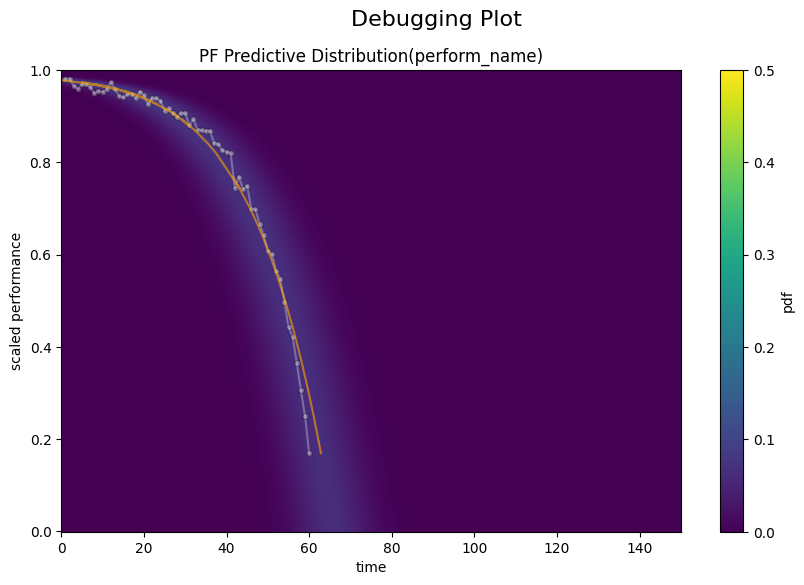

Epoch 21000, Best Loss: 0.20145730674266815
Epoch 22000, Best Loss: 0.20135368406772614
Epoch 23000, Best Loss: 0.20123784244060516
Epoch 24000, Best Loss: 0.20110970735549927
Epoch 25000, Best Loss: 0.20097924768924713
Epoch 26000, Best Loss: 0.2008446604013443
Epoch 27000, Best Loss: 0.20070919394493103
Epoch 28000, Best Loss: 0.20057255029678345
Epoch 29000, Best Loss: 0.2004358172416687
Epoch 30000, Best Loss: 0.20029842853546143
Epoch 31000, Best Loss: 0.20015759766101837
Epoch 32000, Best Loss: 0.2000196874141693
Epoch 33000, Best Loss: 0.19988173246383667
Epoch 34000, Best Loss: 0.1997407078742981
Epoch 35000, Best Loss: 0.19960039854049683
Epoch 36000, Best Loss: 0.19945994019508362
Epoch 37000, Best Loss: 0.19931906461715698
Epoch 38000, Best Loss: 0.19917705655097961
Epoch 39000, Best Loss: 0.19904011487960815
Epoch 40000, Best Loss: 0.19890084862709045


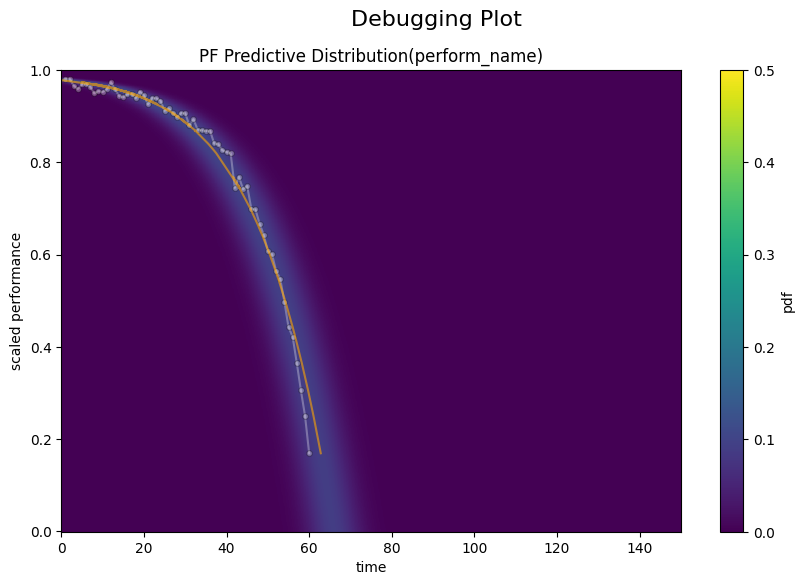

Epoch 41000, Best Loss: 0.1987658143043518
Epoch 42000, Best Loss: 0.1986357718706131
Epoch 43000, Best Loss: 0.19850784540176392
Epoch 44000, Best Loss: 0.19838374853134155
Epoch 45000, Best Loss: 0.1982707977294922
Epoch 46000, Best Loss: 0.19816355407238007
Epoch 47000, Best Loss: 0.19806839525699615
Epoch 48000, Best Loss: 0.19797895848751068
Epoch 49000, Best Loss: 0.19791030883789062
Epoch 50000, Best Loss: 0.1978498101234436
Epoch 51000, Best Loss: 0.19780120253562927
Epoch 52000, Best Loss: 0.19775226712226868
Epoch 53000, Best Loss: 0.19770047068595886
Epoch 54000, Best Loss: 0.1976538896560669
Epoch 55000, Best Loss: 0.19760513305664062
Epoch 56000, Best Loss: 0.19755715131759644
Epoch 57000, Best Loss: 0.19750899076461792
Epoch 58000, Best Loss: 0.19746248424053192
Epoch 59000, Best Loss: 0.19741475582122803
Epoch 60000, Best Loss: 0.19737109541893005


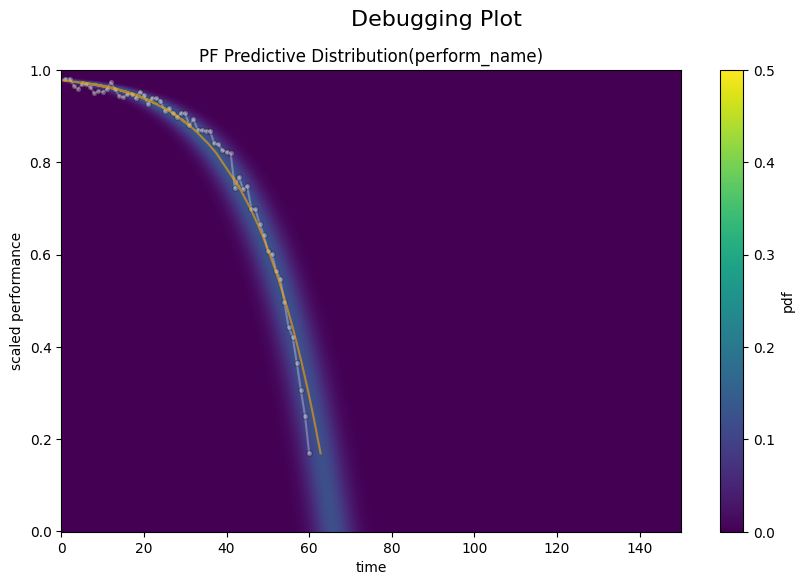

Epoch 61000, Best Loss: 0.19732414186000824
Epoch 62000, Best Loss: 0.19727899134159088
Epoch 63000, Best Loss: 0.19723458588123322
Epoch 64000, Best Loss: 0.19719132781028748
Epoch 65000, Best Loss: 0.197146475315094
Epoch 66000, Best Loss: 0.1971033662557602
Epoch 67000, Best Loss: 0.1970607340335846
Epoch 68000, Best Loss: 0.19701947271823883
Epoch 69000, Best Loss: 0.1969749927520752
Epoch 70000, Best Loss: 0.19693221151828766
Epoch 71000, Best Loss: 0.1968911737203598
Epoch 72000, Best Loss: 0.19684861600399017
Epoch 73000, Best Loss: 0.19680975377559662
Epoch 74000, Best Loss: 0.19677002727985382
Epoch 75000, Best Loss: 0.19672973453998566
Epoch 76000, Best Loss: 0.19668817520141602
Epoch 77000, Best Loss: 0.19665053486824036
Epoch 78000, Best Loss: 0.19661016762256622
Epoch 79000, Best Loss: 0.1965714693069458
Epoch 80000, Best Loss: 0.1965344399213791


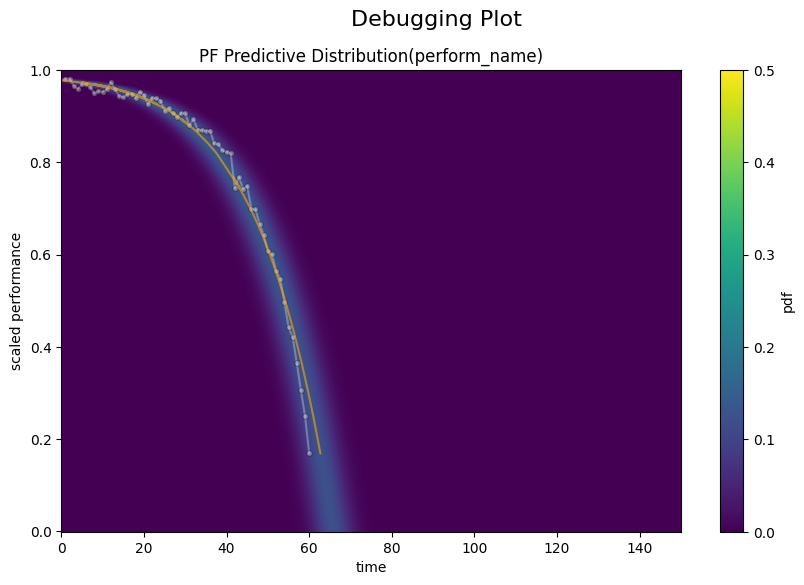

Epoch 81000, Best Loss: 0.1964944452047348
Epoch 82000, Best Loss: 0.19645877182483673
Epoch 83000, Best Loss: 0.19641922414302826
Epoch 84000, Best Loss: 0.19638311862945557
Epoch 85000, Best Loss: 0.19634808599948883
Epoch 86000, Best Loss: 0.19630961120128632
Epoch 87000, Best Loss: 0.19627557694911957
Epoch 88000, Best Loss: 0.19623640179634094
Epoch 89000, Best Loss: 0.1962043046951294
Epoch 90000, Best Loss: 0.19616906344890594
Epoch 91000, Best Loss: 0.19613434374332428
Epoch 92000, Best Loss: 0.19609840214252472
Epoch 93000, Best Loss: 0.19606561958789825
Epoch 94000, Best Loss: 0.19602671265602112
Epoch 95000, Best Loss: 0.19599518179893494
Epoch 96000, Best Loss: 0.19596269726753235
Epoch 97000, Best Loss: 0.19591063261032104
Epoch 98000, Best Loss: 0.1958812177181244
Epoch 99000, Best Loss: 0.19584810733795166
Best value: 0.19581477344036102
Best parameters: {'p': 17.578001022338867, 'mu': 231.80459594726562, 'a': 0.9912422562584526, 'mean': 297.7951965332031, 'var': 10.5507

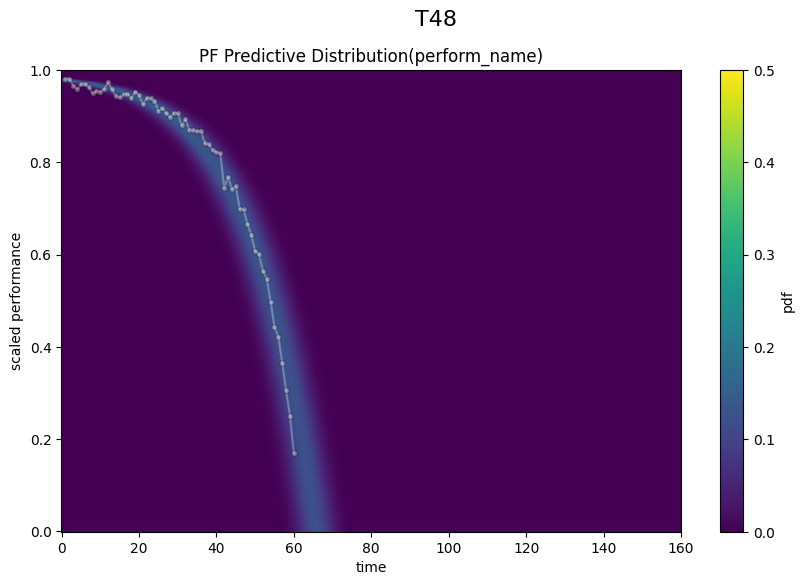

Epoch 1000, Best Loss: 0.6233381032943726
Epoch 2000, Best Loss: 0.5858427286148071
Epoch 3000, Best Loss: 0.5771571397781372
Epoch 4000, Best Loss: 0.5719537138938904
Epoch 5000, Best Loss: 0.5668658018112183
Epoch 6000, Best Loss: 0.5628204941749573
Epoch 7000, Best Loss: 0.5602536797523499
Epoch 8000, Best Loss: 0.5586844086647034
Epoch 9000, Best Loss: 0.5573221445083618
Epoch 10000, Best Loss: 0.5557873249053955
Epoch 11000, Best Loss: 0.5540562868118286
Epoch 12000, Best Loss: 0.5521982908248901
Epoch 13000, Best Loss: 0.5502798557281494
Epoch 14000, Best Loss: 0.5483444929122925
Epoch 15000, Best Loss: 0.5464022755622864
Epoch 16000, Best Loss: 0.5444632768630981
Epoch 17000, Best Loss: 0.5425281524658203
Epoch 18000, Best Loss: 0.54059898853302
Epoch 19000, Best Loss: 0.5386711955070496
Epoch 20000, Best Loss: 0.5367468595504761


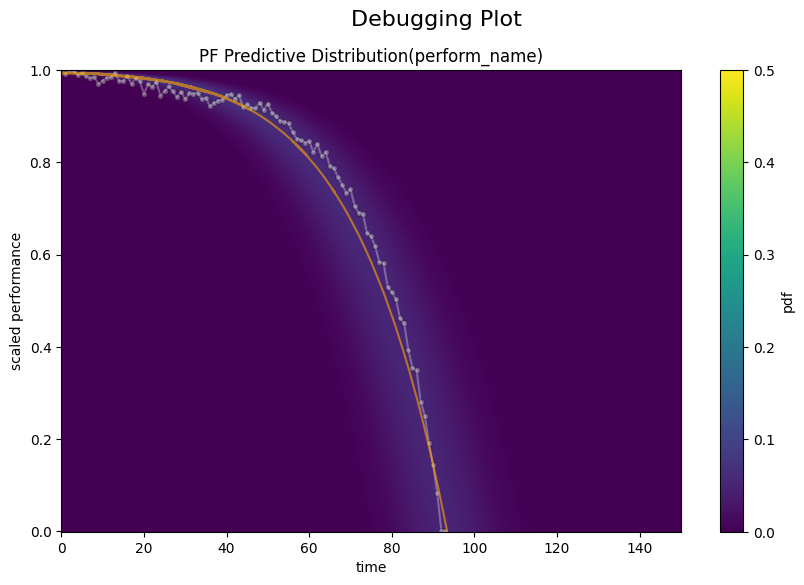

Epoch 21000, Best Loss: 0.5348246097564697
Epoch 22000, Best Loss: 0.5329129099845886
Epoch 23000, Best Loss: 0.5310065746307373
Epoch 24000, Best Loss: 0.5291025638580322
Epoch 25000, Best Loss: 0.5272003412246704
Epoch 26000, Best Loss: 0.5252987146377563
Epoch 27000, Best Loss: 0.5233994126319885
Epoch 28000, Best Loss: 0.5215012431144714
Epoch 29000, Best Loss: 0.5196001529693604
Epoch 30000, Best Loss: 0.5177004337310791
Epoch 31000, Best Loss: 0.5158016085624695
Epoch 32000, Best Loss: 0.5139036774635315
Epoch 33000, Best Loss: 0.5120055079460144
Epoch 34000, Best Loss: 0.5101103186607361
Epoch 35000, Best Loss: 0.5082239508628845
Epoch 36000, Best Loss: 0.5063392519950867
Epoch 37000, Best Loss: 0.5044537782669067
Epoch 38000, Best Loss: 0.5025700330734253
Epoch 39000, Best Loss: 0.5006859302520752
Epoch 40000, Best Loss: 0.4988024830818176


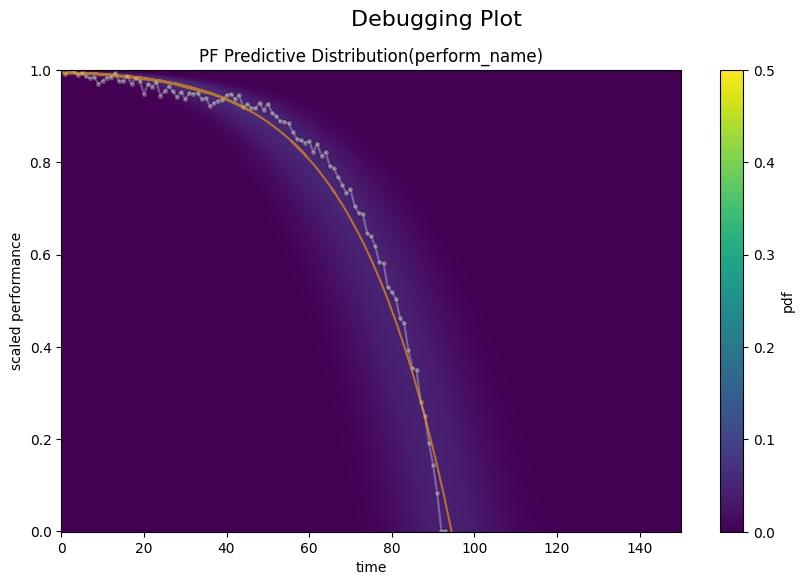

Epoch 41000, Best Loss: 0.4969186782836914
Epoch 42000, Best Loss: 0.49503636360168457
Epoch 43000, Best Loss: 0.49315452575683594
Epoch 44000, Best Loss: 0.49127328395843506
Epoch 45000, Best Loss: 0.48939305543899536
Epoch 46000, Best Loss: 0.48751354217529297
Epoch 47000, Best Loss: 0.48563629388809204
Epoch 48000, Best Loss: 0.4837593734264374
Epoch 49000, Best Loss: 0.481884241104126
Epoch 50000, Best Loss: 0.48000872135162354
Epoch 51000, Best Loss: 0.4781345725059509
Epoch 52000, Best Loss: 0.47626587748527527
Epoch 53000, Best Loss: 0.47440916299819946
Epoch 54000, Best Loss: 0.4725548326969147
Epoch 55000, Best Loss: 0.47070416808128357
Epoch 56000, Best Loss: 0.4688565731048584
Epoch 57000, Best Loss: 0.46701282262802124
Epoch 58000, Best Loss: 0.46517398953437805
Epoch 59000, Best Loss: 0.46333926916122437
Epoch 60000, Best Loss: 0.46150919795036316


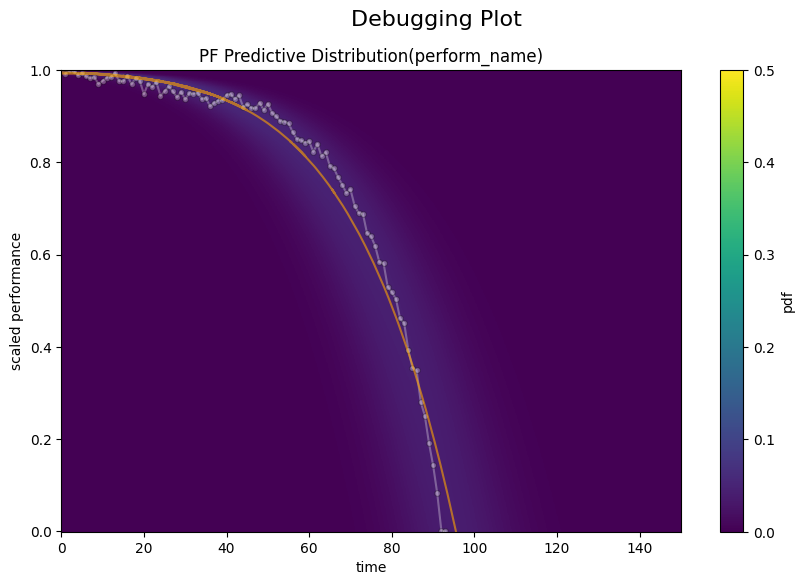

Epoch 61000, Best Loss: 0.4596851170063019
Epoch 62000, Best Loss: 0.4578673243522644
Epoch 63000, Best Loss: 0.4560554027557373
Epoch 64000, Best Loss: 0.4542509615421295
Epoch 65000, Best Loss: 0.45245373249053955
Epoch 66000, Best Loss: 0.45066404342651367
Epoch 67000, Best Loss: 0.4488837420940399
Epoch 68000, Best Loss: 0.44711244106292725
Epoch 69000, Best Loss: 0.4453510046005249
Epoch 70000, Best Loss: 0.44360896944999695
Epoch 71000, Best Loss: 0.44188037514686584
Epoch 72000, Best Loss: 0.44016343355178833
Epoch 73000, Best Loss: 0.4384589195251465
Epoch 74000, Best Loss: 0.43676725029945374
Epoch 75000, Best Loss: 0.4350905418395996
Epoch 76000, Best Loss: 0.4334278404712677
Epoch 77000, Best Loss: 0.4317810535430908
Epoch 78000, Best Loss: 0.4301510751247406
Epoch 79000, Best Loss: 0.42853879928588867
Epoch 80000, Best Loss: 0.4269474148750305


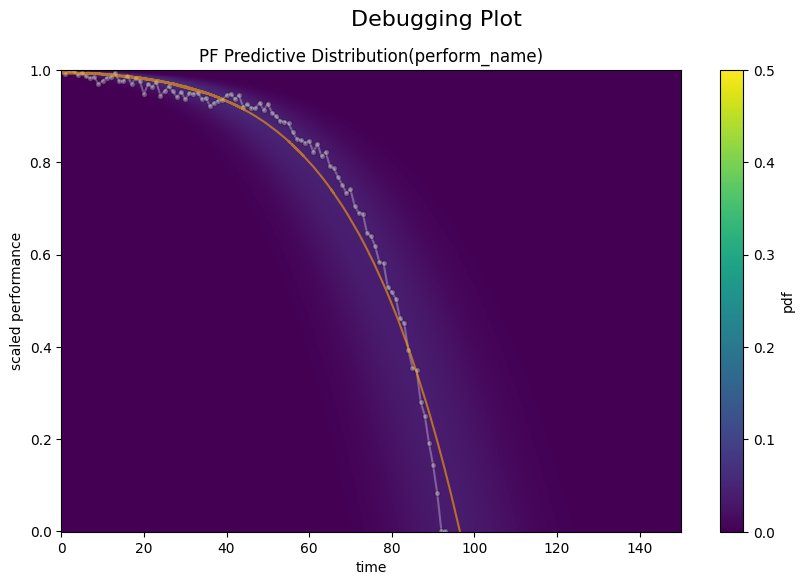

Epoch 81000, Best Loss: 0.42538323998451233
Epoch 82000, Best Loss: 0.4238370954990387
Epoch 83000, Best Loss: 0.4223121404647827
Epoch 84000, Best Loss: 0.4208095371723175
Epoch 85000, Best Loss: 0.4193308353424072
Epoch 86000, Best Loss: 0.4178820550441742
Epoch 87000, Best Loss: 0.4164595901966095
Epoch 88000, Best Loss: 0.4150656759738922
Epoch 89000, Best Loss: 0.41370248794555664
Epoch 90000, Best Loss: 0.4123687744140625
Epoch 91000, Best Loss: 0.41106918454170227
Epoch 92000, Best Loss: 0.40980154275894165
Epoch 93000, Best Loss: 0.40857023000717163
Epoch 94000, Best Loss: 0.4073745608329773
Epoch 95000, Best Loss: 0.4062168300151825
Epoch 96000, Best Loss: 0.4050977826118469
Epoch 97000, Best Loss: 0.40401989221572876
Epoch 98000, Best Loss: 0.40298375487327576
Epoch 99000, Best Loss: 0.4019910395145416
Best value: 0.40104421973228455
Best parameters: {'p': 5.441579341888428, 'mu': 49.655941009521484, 'a': 1.0000000000336144, 'mean': 146.95352172851562, 'var': 143.121292114257

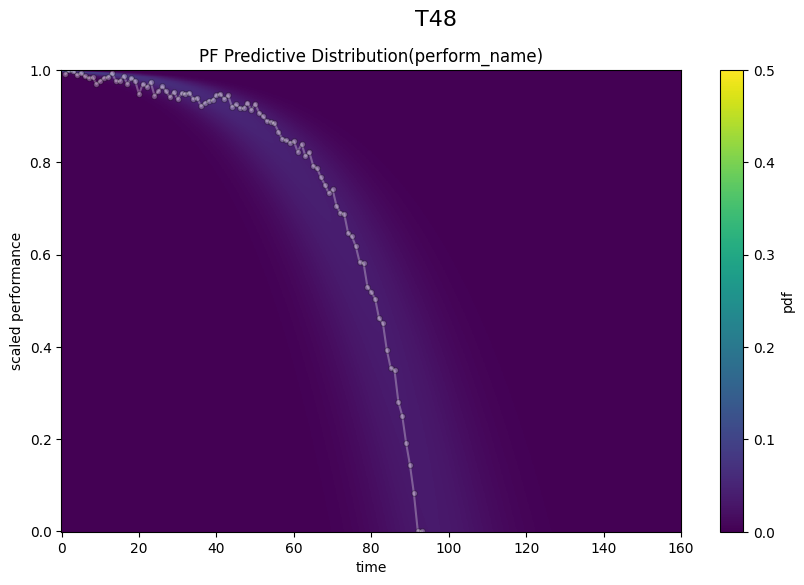

Epoch 1000, Best Loss: 1.11909019947052
Epoch 2000, Best Loss: 1.0172172784805298
Epoch 3000, Best Loss: 0.9193276762962341
Epoch 4000, Best Loss: 0.8269414901733398
Epoch 5000, Best Loss: 0.7375566363334656
Epoch 6000, Best Loss: 0.6493736505508423
Epoch 7000, Best Loss: 0.5630969405174255
Epoch 8000, Best Loss: 0.47908684611320496
Epoch 9000, Best Loss: 0.3960445523262024
Epoch 10000, Best Loss: 0.3112487494945526
Epoch 11000, Best Loss: 0.2325514256954193
Epoch 12000, Best Loss: 0.19174835085868835
Epoch 13000, Best Loss: 0.18297278881072998
Epoch 14000, Best Loss: 0.18192774057388306
Epoch 15000, Best Loss: 0.18182724714279175
Epoch 16000, Best Loss: 0.18175937235355377
Epoch 17000, Best Loss: 0.18169021606445312
Epoch 18000, Best Loss: 0.18161937594413757
Epoch 19000, Best Loss: 0.18154698610305786
Epoch 20000, Best Loss: 0.18147388100624084


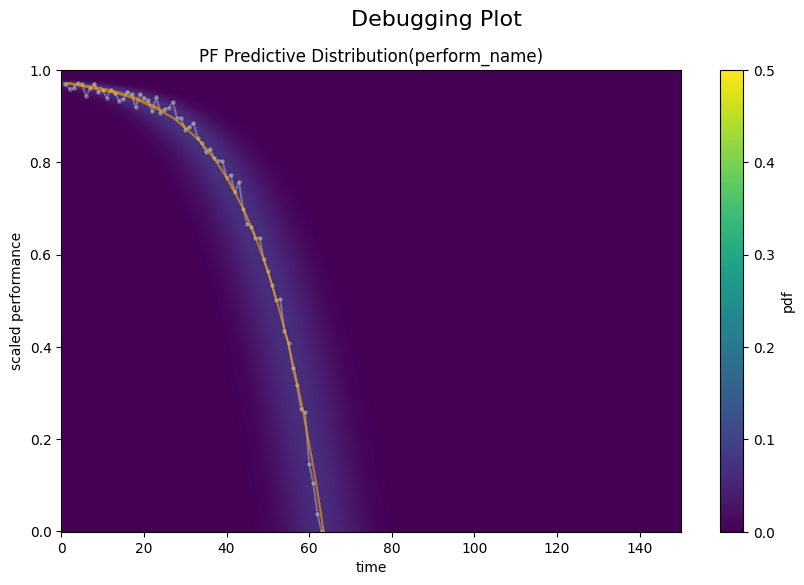

Epoch 21000, Best Loss: 0.18139836192131042
Epoch 22000, Best Loss: 0.18132111430168152
Epoch 23000, Best Loss: 0.18124078214168549
Epoch 24000, Best Loss: 0.18115726113319397
Epoch 25000, Best Loss: 0.1810670644044876
Epoch 26000, Best Loss: 0.18097428977489471
Epoch 27000, Best Loss: 0.18087628483772278
Epoch 28000, Best Loss: 0.18077439069747925
Epoch 29000, Best Loss: 0.18067005276679993
Epoch 30000, Best Loss: 0.18056491017341614
Epoch 31000, Best Loss: 0.18045827746391296
Epoch 32000, Best Loss: 0.18035003542900085
Epoch 33000, Best Loss: 0.18023931980133057
Epoch 34000, Best Loss: 0.18012909591197968
Epoch 35000, Best Loss: 0.18001653254032135
Epoch 36000, Best Loss: 0.17990204691886902
Epoch 37000, Best Loss: 0.17978888750076294
Epoch 38000, Best Loss: 0.1796717643737793
Epoch 39000, Best Loss: 0.17955507338047028
Epoch 40000, Best Loss: 0.17943453788757324


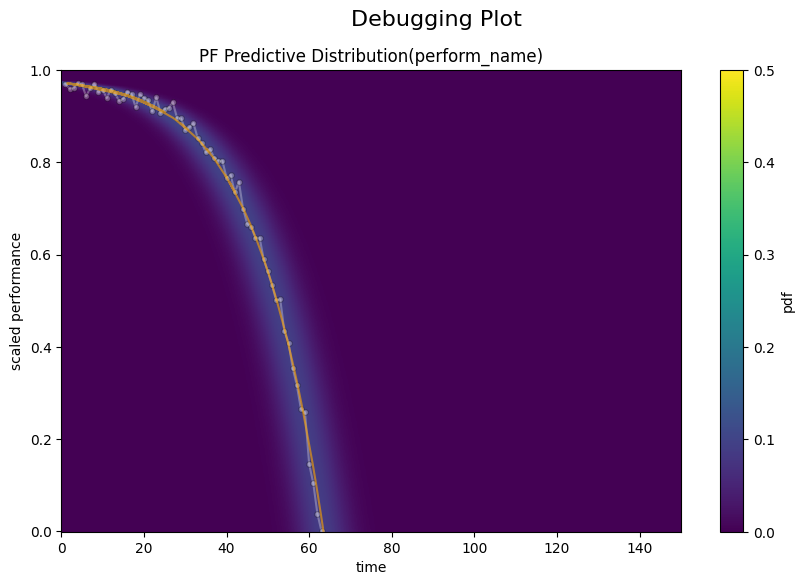

Epoch 41000, Best Loss: 0.1793173849582672
Epoch 42000, Best Loss: 0.17920154333114624
Epoch 43000, Best Loss: 0.17908558249473572
Epoch 44000, Best Loss: 0.1789720207452774
Epoch 45000, Best Loss: 0.17886300384998322
Epoch 46000, Best Loss: 0.17875874042510986
Epoch 47000, Best Loss: 0.17865929007530212
Epoch 48000, Best Loss: 0.17856557667255402
Epoch 49000, Best Loss: 0.17848894000053406
Epoch 50000, Best Loss: 0.17843404412269592
Epoch 51000, Best Loss: 0.1783924400806427
Epoch 52000, Best Loss: 0.17836418747901917
Epoch 53000, Best Loss: 0.1783440262079239
Epoch 54000, Best Loss: 0.17832157015800476
Epoch 55000, Best Loss: 0.17830117046833038
Epoch 56000, Best Loss: 0.178282231092453
Epoch 57000, Best Loss: 0.17826248705387115
Epoch 58000, Best Loss: 0.17824555933475494
Epoch 59000, Best Loss: 0.17822536826133728
Epoch 60000, Best Loss: 0.1782063990831375


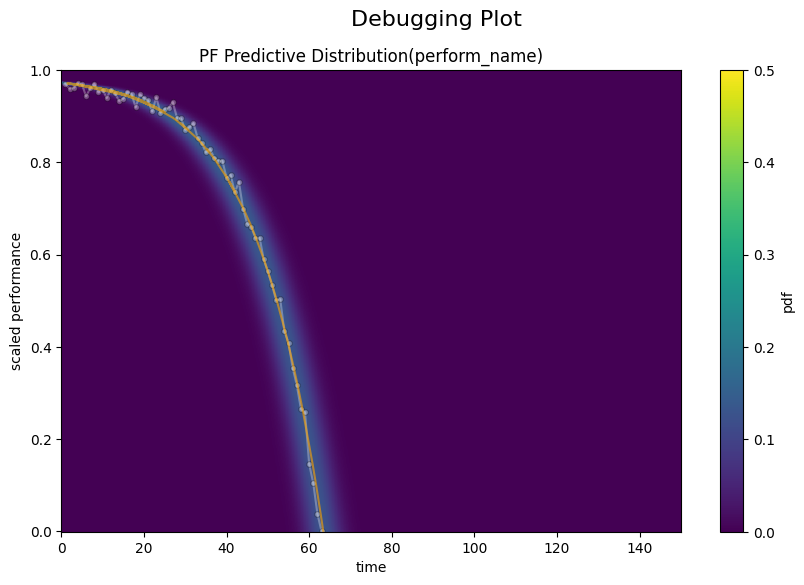

Epoch 61000, Best Loss: 0.17818941175937653
Epoch 62000, Best Loss: 0.17817190289497375
Epoch 63000, Best Loss: 0.1781531274318695
Epoch 64000, Best Loss: 0.17813673615455627
Epoch 65000, Best Loss: 0.17811748385429382
Epoch 66000, Best Loss: 0.17809924483299255
Epoch 67000, Best Loss: 0.17808344960212708
Epoch 68000, Best Loss: 0.17806686460971832
Epoch 69000, Best Loss: 0.1780489683151245
Epoch 70000, Best Loss: 0.17803063988685608
Epoch 71000, Best Loss: 0.1780177354812622
Epoch 72000, Best Loss: 0.17799964547157288
Epoch 73000, Best Loss: 0.17798414826393127
Epoch 74000, Best Loss: 0.17796726524829865
Epoch 75000, Best Loss: 0.1779528558254242
Epoch 76000, Best Loss: 0.1779373586177826
Epoch 77000, Best Loss: 0.17792202532291412
Epoch 78000, Best Loss: 0.17790716886520386
Epoch 79000, Best Loss: 0.17789258062839508
Epoch 80000, Best Loss: 0.17787690460681915


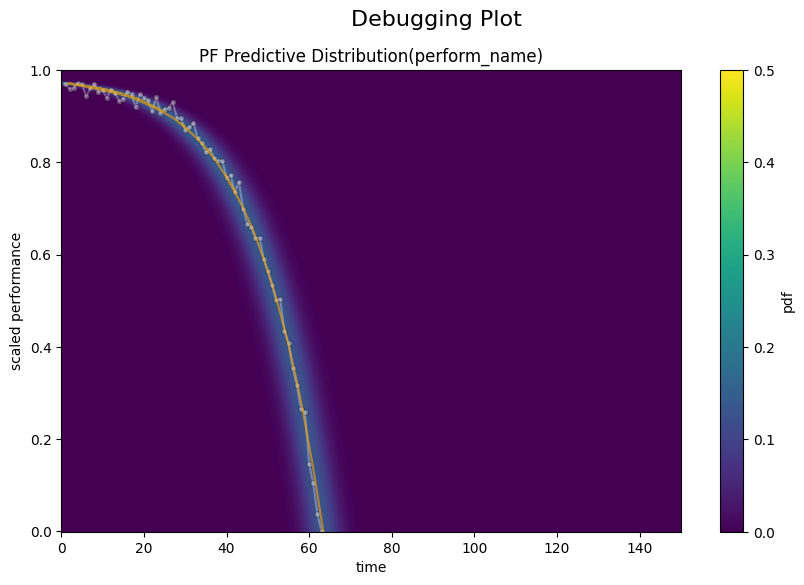

Epoch 81000, Best Loss: 0.17786163091659546
Epoch 82000, Best Loss: 0.17784684896469116
Epoch 83000, Best Loss: 0.17783398926258087
Epoch 84000, Best Loss: 0.1778191477060318
Epoch 85000, Best Loss: 0.17780612409114838
Epoch 86000, Best Loss: 0.1777748316526413
Epoch 87000, Best Loss: 0.17776143550872803
Epoch 88000, Best Loss: 0.1777460128068924
Epoch 89000, Best Loss: 0.17773453891277313
Epoch 90000, Best Loss: 0.1777207851409912
Epoch 91000, Best Loss: 0.17770729959011078
Epoch 92000, Best Loss: 0.17769354581832886
Epoch 93000, Best Loss: 0.17768296599388123
Epoch 94000, Best Loss: 0.17767086625099182
Epoch 95000, Best Loss: 0.1776539534330368
Epoch 96000, Best Loss: 0.17764614522457123
Epoch 97000, Best Loss: 0.1776328980922699
Epoch 98000, Best Loss: 0.17761841416358948
Epoch 99000, Best Loss: 0.1776045560836792
Best value: 0.17759548127651215
Best parameters: {'p': 18.09707260131836, 'mu': 226.68431091308594, 'a': 0.9837650149855826, 'mean': 290.3067321777344, 'var': 9.2421684265

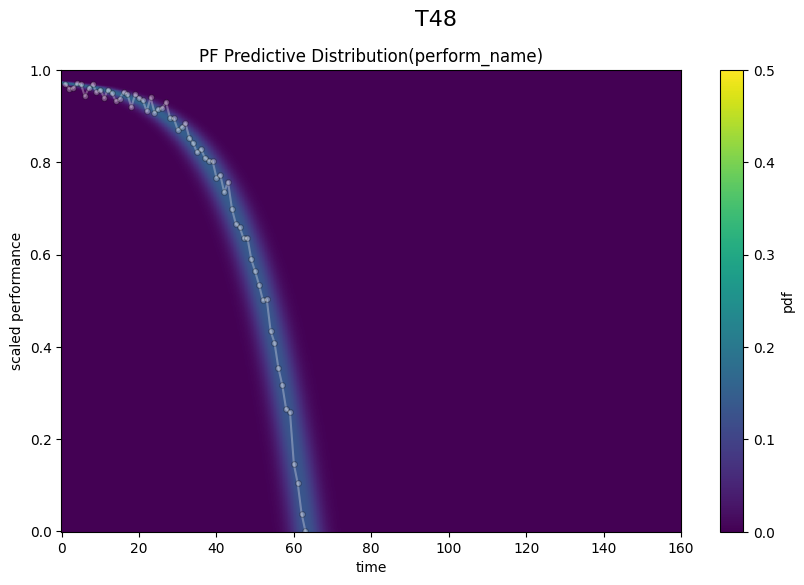

Epoch 1000, Best Loss: 0.6114622354507446
Epoch 2000, Best Loss: 0.5193384885787964
Epoch 3000, Best Loss: 0.48359376192092896
Epoch 4000, Best Loss: 0.4524427056312561
Epoch 5000, Best Loss: 0.42513737082481384
Epoch 6000, Best Loss: 0.39614200592041016
Epoch 7000, Best Loss: 0.36637571454048157
Epoch 8000, Best Loss: 0.335909903049469
Epoch 9000, Best Loss: 0.30437058210372925
Epoch 10000, Best Loss: 0.2705509662628174
Epoch 11000, Best Loss: 0.23599331080913544
Epoch 12000, Best Loss: 0.21350368857383728
Epoch 13000, Best Loss: 0.2088206708431244
Epoch 14000, Best Loss: 0.20859822630882263
Epoch 15000, Best Loss: 0.2085012048482895
Epoch 16000, Best Loss: 0.20839586853981018
Epoch 17000, Best Loss: 0.20828691124916077
Epoch 18000, Best Loss: 0.20817656815052032
Epoch 19000, Best Loss: 0.2080671787261963
Epoch 20000, Best Loss: 0.20795555412769318


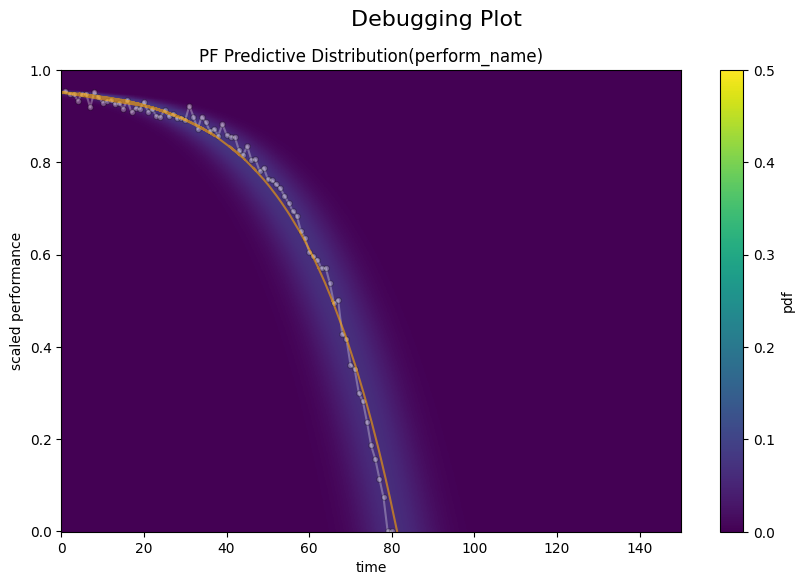

Epoch 21000, Best Loss: 0.20784622430801392
Epoch 22000, Best Loss: 0.207737997174263
Epoch 23000, Best Loss: 0.20763042569160461
Epoch 24000, Best Loss: 0.2075241208076477
Epoch 25000, Best Loss: 0.20741763710975647
Epoch 26000, Best Loss: 0.20731310546398163
Epoch 27000, Best Loss: 0.2072080820798874
Epoch 28000, Best Loss: 0.20710542798042297
Epoch 29000, Best Loss: 0.20700331032276154
Epoch 30000, Best Loss: 0.20690347254276276
Epoch 31000, Best Loss: 0.20680473744869232
Epoch 32000, Best Loss: 0.20670786499977112
Epoch 33000, Best Loss: 0.206612229347229
Epoch 34000, Best Loss: 0.2065196931362152
Epoch 35000, Best Loss: 0.2064305990934372
Epoch 36000, Best Loss: 0.20633964240550995
Epoch 37000, Best Loss: 0.206255704164505
Epoch 38000, Best Loss: 0.20617499947547913
Epoch 39000, Best Loss: 0.20609813928604126
Epoch 40000, Best Loss: 0.20602627098560333


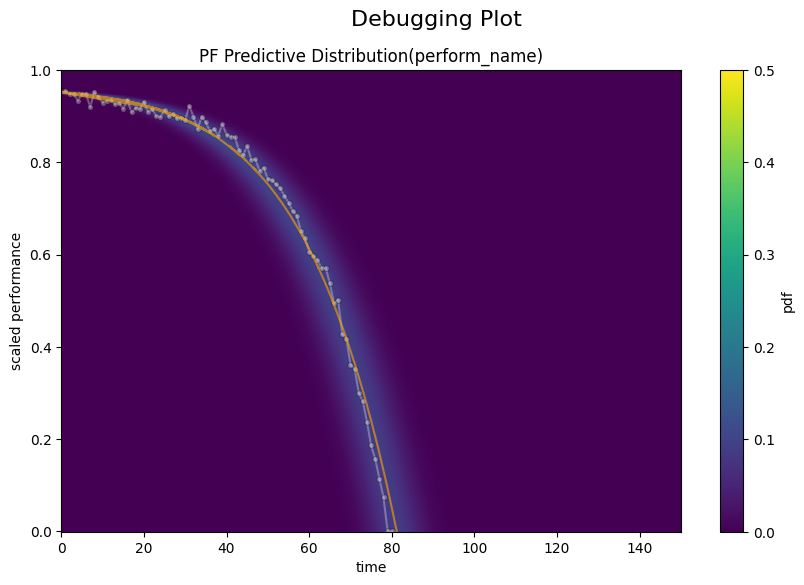

Epoch 41000, Best Loss: 0.20595715939998627
Epoch 42000, Best Loss: 0.20589394867420197
Epoch 43000, Best Loss: 0.20583274960517883
Epoch 44000, Best Loss: 0.20577189326286316
Epoch 45000, Best Loss: 0.20571249723434448
Epoch 46000, Best Loss: 0.20565423369407654
Epoch 47000, Best Loss: 0.2055959403514862
Epoch 48000, Best Loss: 0.20554028451442719
Epoch 49000, Best Loss: 0.20548352599143982
Epoch 50000, Best Loss: 0.20542502403259277
Epoch 51000, Best Loss: 0.2053724229335785
Epoch 52000, Best Loss: 0.20531728863716125
Epoch 53000, Best Loss: 0.20526252686977386
Epoch 54000, Best Loss: 0.20520928502082825
Epoch 55000, Best Loss: 0.20515617728233337
Epoch 56000, Best Loss: 0.20510181784629822
Epoch 57000, Best Loss: 0.2050505429506302
Epoch 58000, Best Loss: 0.2049994319677353
Epoch 59000, Best Loss: 0.20494858920574188
Epoch 60000, Best Loss: 0.20489712059497833


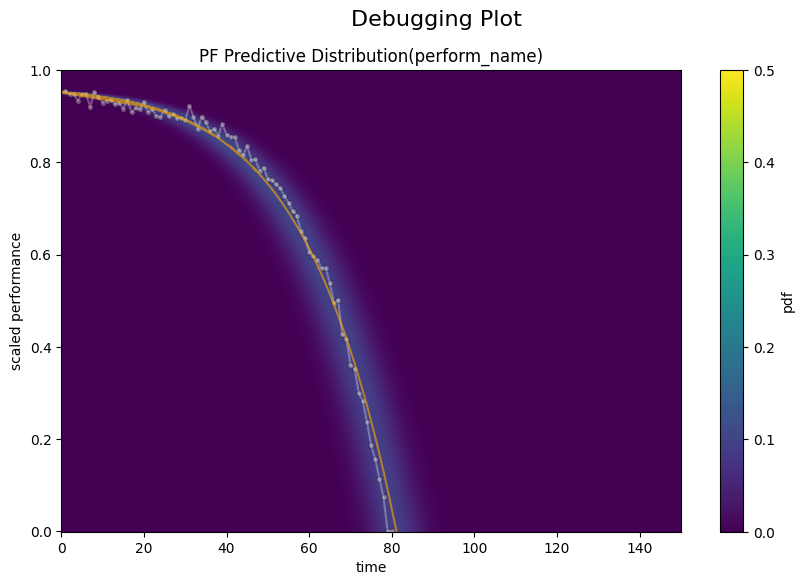

Epoch 61000, Best Loss: 0.20484767854213715
Epoch 62000, Best Loss: 0.20479874312877655
Epoch 63000, Best Loss: 0.2047482430934906
Epoch 64000, Best Loss: 0.2047005444765091
Epoch 65000, Best Loss: 0.20465366542339325
Epoch 66000, Best Loss: 0.20460447669029236
Epoch 67000, Best Loss: 0.2045564502477646
Epoch 68000, Best Loss: 0.20451058447360992
Epoch 69000, Best Loss: 0.2044636607170105
Epoch 70000, Best Loss: 0.20441743731498718
Epoch 71000, Best Loss: 0.2043696641921997
Epoch 72000, Best Loss: 0.20432090759277344
Epoch 73000, Best Loss: 0.20427772402763367
Epoch 74000, Best Loss: 0.20423203706741333
Epoch 75000, Best Loss: 0.20418791472911835
Epoch 76000, Best Loss: 0.20414398610591888
Epoch 77000, Best Loss: 0.20410072803497314
Epoch 78000, Best Loss: 0.2040589302778244
Epoch 79000, Best Loss: 0.20401592552661896
Epoch 80000, Best Loss: 0.2039746791124344


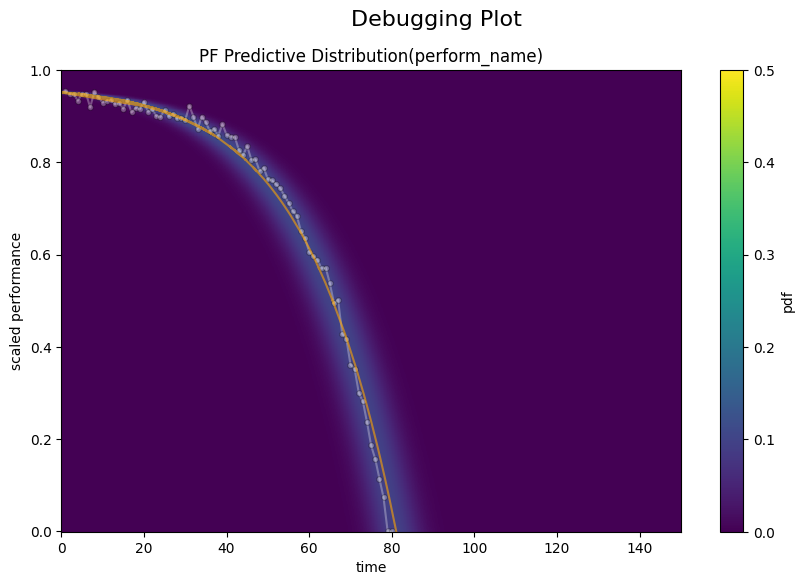

Epoch 81000, Best Loss: 0.20393310487270355
Epoch 82000, Best Loss: 0.2038927674293518
Epoch 83000, Best Loss: 0.2038487195968628
Epoch 84000, Best Loss: 0.20381005108356476
Epoch 85000, Best Loss: 0.2037702351808548
Epoch 86000, Best Loss: 0.20373035967350006
Epoch 87000, Best Loss: 0.20369064807891846
Epoch 88000, Best Loss: 0.2036515772342682
Epoch 89000, Best Loss: 0.20361164212226868
Epoch 90000, Best Loss: 0.20357446372509003
Epoch 91000, Best Loss: 0.20353510975837708
Epoch 92000, Best Loss: 0.2034977674484253
Epoch 93000, Best Loss: 0.20346041023731232
Epoch 94000, Best Loss: 0.2034228891134262
Epoch 95000, Best Loss: 0.20338740944862366
Epoch 96000, Best Loss: 0.20334993302822113
Epoch 97000, Best Loss: 0.20331452786922455
Epoch 98000, Best Loss: 0.20327860116958618
Epoch 99000, Best Loss: 0.20324189960956573
Best value: 0.20320548117160797
Best parameters: {'p': 14.422918319702148, 'mu': 228.6596221923828, 'a': 0.9642043866151692, 'mean': 310.47442626953125, 'var': 17.0067710

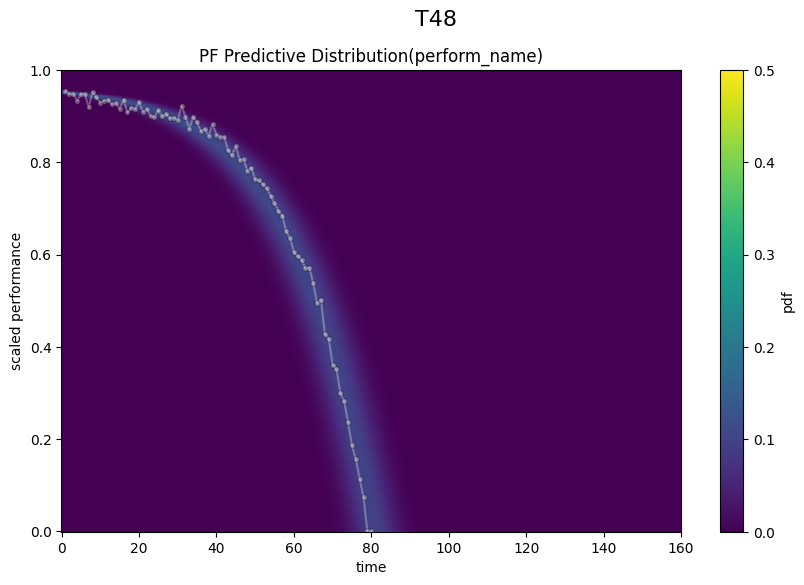

Epoch 1000, Best Loss: 0.8440940380096436
Epoch 2000, Best Loss: 0.7980636954307556
Epoch 3000, Best Loss: 0.754772424697876
Epoch 4000, Best Loss: 0.7162397503852844
Epoch 5000, Best Loss: 0.6831103563308716
Epoch 6000, Best Loss: 0.6557022333145142
Epoch 7000, Best Loss: 0.6340620517730713
Epoch 8000, Best Loss: 0.6180353164672852
Epoch 9000, Best Loss: 0.6072289943695068
Epoch 10000, Best Loss: 0.6008692979812622
Epoch 11000, Best Loss: 0.5977855920791626
Epoch 12000, Best Loss: 0.596485435962677
Epoch 13000, Best Loss: 0.5956454873085022
Epoch 14000, Best Loss: 0.5946630239486694
Epoch 15000, Best Loss: 0.5934239625930786
Epoch 16000, Best Loss: 0.5919520854949951
Epoch 17000, Best Loss: 0.5903295874595642
Epoch 18000, Best Loss: 0.5886241793632507
Epoch 19000, Best Loss: 0.5868828892707825
Epoch 20000, Best Loss: 0.5851215124130249


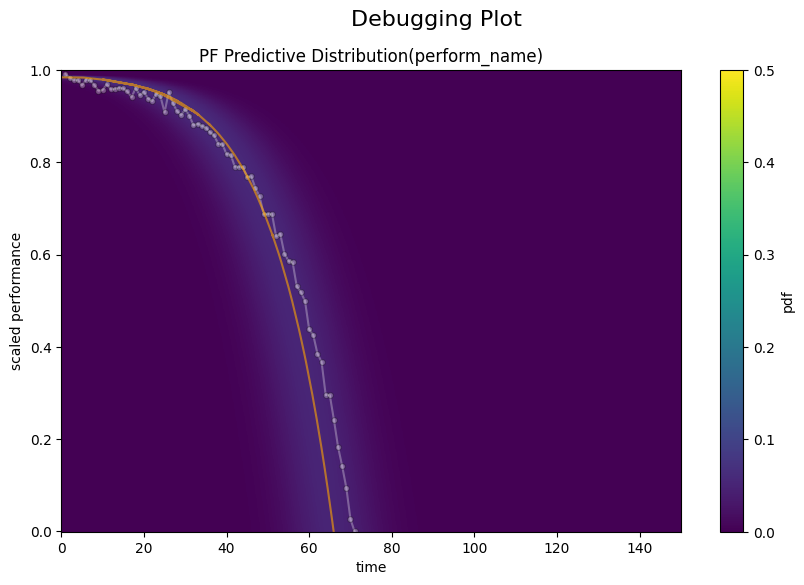

Epoch 21000, Best Loss: 0.5833491683006287
Epoch 22000, Best Loss: 0.581565797328949
Epoch 23000, Best Loss: 0.5797733068466187
Epoch 24000, Best Loss: 0.5779669284820557
Epoch 25000, Best Loss: 0.5761498212814331
Epoch 26000, Best Loss: 0.5743194818496704
Epoch 27000, Best Loss: 0.5724771022796631
Epoch 28000, Best Loss: 0.570618212223053
Epoch 29000, Best Loss: 0.568745493888855
Epoch 30000, Best Loss: 0.5668624639511108
Epoch 31000, Best Loss: 0.5649691224098206
Epoch 32000, Best Loss: 0.5630618333816528
Epoch 33000, Best Loss: 0.561138391494751
Epoch 34000, Best Loss: 0.5592019557952881
Epoch 35000, Best Loss: 0.5572481751441956
Epoch 36000, Best Loss: 0.5552814602851868
Epoch 37000, Best Loss: 0.5532971620559692
Epoch 38000, Best Loss: 0.5513103008270264
Epoch 39000, Best Loss: 0.5493069291114807
Epoch 40000, Best Loss: 0.5472750663757324


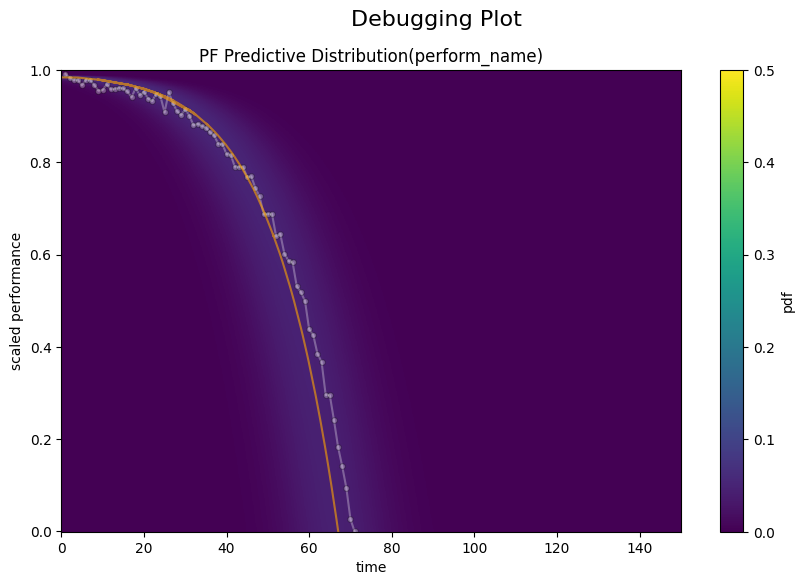

Epoch 41000, Best Loss: 0.5452305674552917
Epoch 42000, Best Loss: 0.5431782007217407
Epoch 43000, Best Loss: 0.5411064624786377
Epoch 44000, Best Loss: 0.5390190482139587
Epoch 45000, Best Loss: 0.5369128584861755
Epoch 46000, Best Loss: 0.534787118434906
Epoch 47000, Best Loss: 0.5326429009437561
Epoch 48000, Best Loss: 0.5304796695709229
Epoch 49000, Best Loss: 0.5282974243164062
Epoch 50000, Best Loss: 0.5260959267616272
Epoch 51000, Best Loss: 0.5238760113716125
Epoch 52000, Best Loss: 0.5216363072395325
Epoch 53000, Best Loss: 0.5193852782249451
Epoch 54000, Best Loss: 0.5171141624450684
Epoch 55000, Best Loss: 0.514824628829956
Epoch 56000, Best Loss: 0.5125156044960022
Epoch 57000, Best Loss: 0.5101886987686157
Epoch 58000, Best Loss: 0.5078452825546265
Epoch 59000, Best Loss: 0.5054812431335449
Epoch 60000, Best Loss: 0.5030973553657532


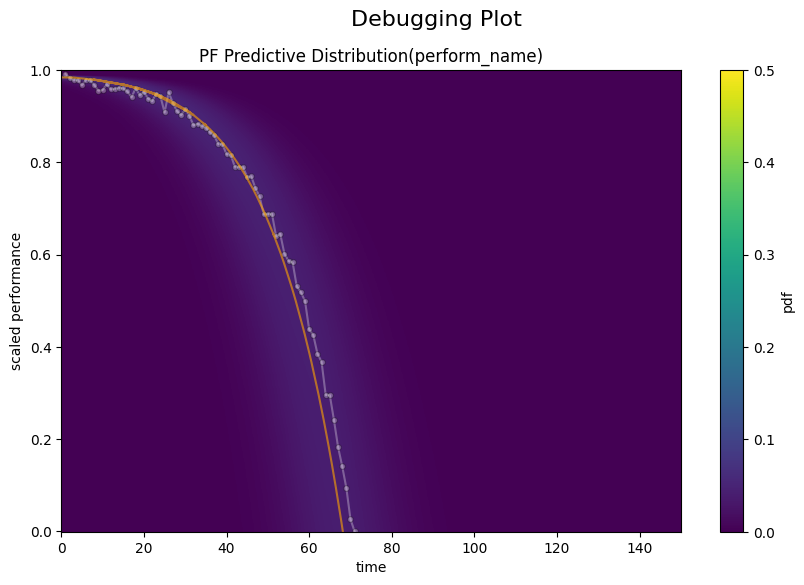

Epoch 61000, Best Loss: 0.5006925463676453
Epoch 62000, Best Loss: 0.4982675611972809
Epoch 63000, Best Loss: 0.49582135677337646
Epoch 64000, Best Loss: 0.4933552145957947
Epoch 65000, Best Loss: 0.4908682107925415
Epoch 66000, Best Loss: 0.4883602559566498
Epoch 67000, Best Loss: 0.48583173751831055
Epoch 68000, Best Loss: 0.48328232765197754
Epoch 69000, Best Loss: 0.48071184754371643
Epoch 70000, Best Loss: 0.4781208038330078
Epoch 71000, Best Loss: 0.47550779581069946
Epoch 72000, Best Loss: 0.47287338972091675
Epoch 73000, Best Loss: 0.4702180027961731
Epoch 74000, Best Loss: 0.46754229068756104
Epoch 75000, Best Loss: 0.4648464322090149
Epoch 76000, Best Loss: 0.4621427357196808
Epoch 77000, Best Loss: 0.4594247341156006
Epoch 78000, Best Loss: 0.45668745040893555
Epoch 79000, Best Loss: 0.4539302587509155
Epoch 80000, Best Loss: 0.4511532783508301


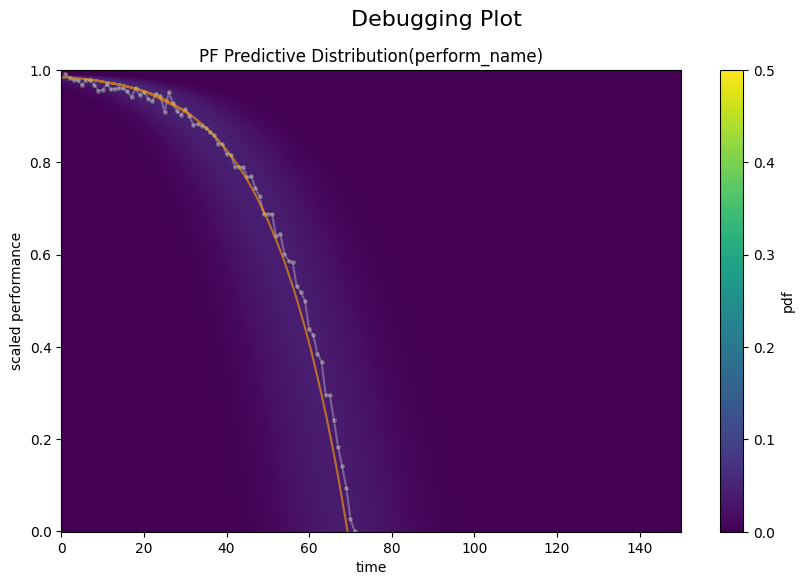

Epoch 81000, Best Loss: 0.44835716485977173
Epoch 82000, Best Loss: 0.4455417990684509
Epoch 83000, Best Loss: 0.4427075982093811
Epoch 84000, Best Loss: 0.43985500931739807
Epoch 85000, Best Loss: 0.4369843602180481
Epoch 86000, Best Loss: 0.43409526348114014
Epoch 87000, Best Loss: 0.4311875104904175
Epoch 88000, Best Loss: 0.42826226353645325
Epoch 89000, Best Loss: 0.42532071471214294
Epoch 90000, Best Loss: 0.4223629832267761
Epoch 91000, Best Loss: 0.419389545917511
Epoch 92000, Best Loss: 0.4164009094238281
Epoch 93000, Best Loss: 0.4133976697921753
Epoch 94000, Best Loss: 0.41038021445274353
Epoch 95000, Best Loss: 0.40735021233558655
Epoch 96000, Best Loss: 0.40430718660354614
Epoch 97000, Best Loss: 0.40125247836112976
Epoch 98000, Best Loss: 0.3981873095035553
Epoch 99000, Best Loss: 0.39511191844940186
Best value: 0.3920307755470276
Best parameters: {'p': 7.019279479980469, 'mu': 66.1134033203125, 'a': 0.9912800132321253, 'mean': 136.6736602783203, 'var': 142.21751403808594

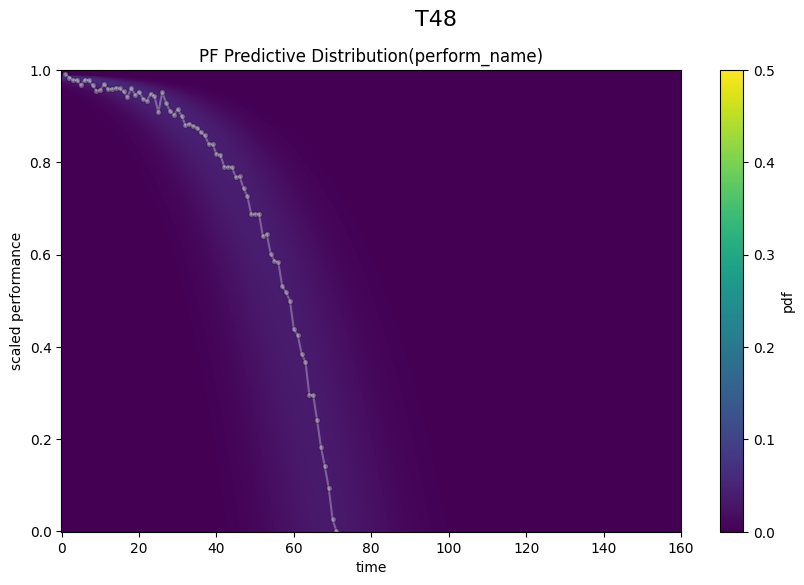

Epoch 1000, Best Loss: 0.5523136854171753
Epoch 2000, Best Loss: 0.5222824811935425
Epoch 3000, Best Loss: 0.4960540235042572
Epoch 4000, Best Loss: 0.4681940972805023
Epoch 5000, Best Loss: 0.4382159113883972
Epoch 6000, Best Loss: 0.40747180581092834
Epoch 7000, Best Loss: 0.37600308656692505
Epoch 8000, Best Loss: 0.344312846660614
Epoch 9000, Best Loss: 0.313223659992218
Epoch 10000, Best Loss: 0.2844170928001404
Epoch 11000, Best Loss: 0.261078804731369
Epoch 12000, Best Loss: 0.24811767041683197
Epoch 13000, Best Loss: 0.24514134228229523
Epoch 14000, Best Loss: 0.24483948945999146
Epoch 15000, Best Loss: 0.24465784430503845
Epoch 16000, Best Loss: 0.2444838285446167
Epoch 17000, Best Loss: 0.244314506649971
Epoch 18000, Best Loss: 0.24414722621440887
Epoch 19000, Best Loss: 0.24398042261600494
Epoch 20000, Best Loss: 0.24381566047668457


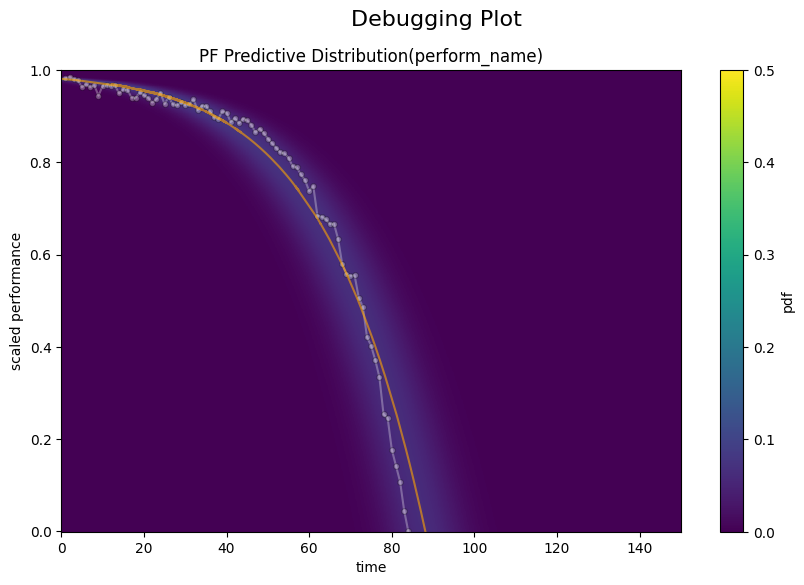

Epoch 21000, Best Loss: 0.24365314841270447
Epoch 22000, Best Loss: 0.24349424242973328
Epoch 23000, Best Loss: 0.2433355450630188
Epoch 24000, Best Loss: 0.2431805580854416
Epoch 25000, Best Loss: 0.24302585422992706
Epoch 26000, Best Loss: 0.2428736835718155
Epoch 27000, Best Loss: 0.24272507429122925
Epoch 28000, Best Loss: 0.2425786554813385
Epoch 29000, Best Loss: 0.24243520200252533
Epoch 30000, Best Loss: 0.24229371547698975
Epoch 31000, Best Loss: 0.2421553134918213
Epoch 32000, Best Loss: 0.24202017486095428
Epoch 33000, Best Loss: 0.24188868701457977
Epoch 34000, Best Loss: 0.2417568564414978
Epoch 35000, Best Loss: 0.24162942171096802
Epoch 36000, Best Loss: 0.2415057271718979
Epoch 37000, Best Loss: 0.24138230085372925
Epoch 38000, Best Loss: 0.2412606179714203
Epoch 39000, Best Loss: 0.24114112555980682
Epoch 40000, Best Loss: 0.2410208284854889


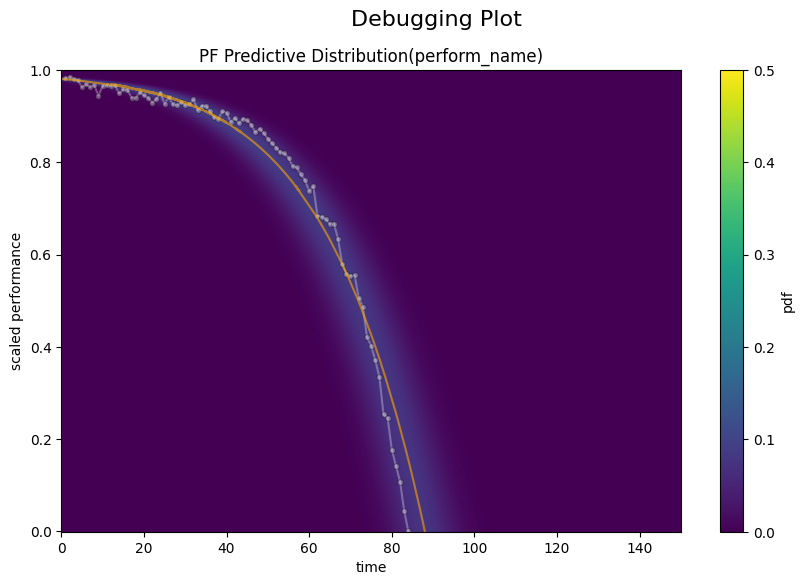

Epoch 41000, Best Loss: 0.24090377986431122
Epoch 42000, Best Loss: 0.2407863885164261
Epoch 43000, Best Loss: 0.24067038297653198
Epoch 44000, Best Loss: 0.24055679142475128
Epoch 45000, Best Loss: 0.24044162034988403
Epoch 46000, Best Loss: 0.24032939970493317
Epoch 47000, Best Loss: 0.2402193397283554
Epoch 48000, Best Loss: 0.24010802805423737
Epoch 49000, Best Loss: 0.23999924957752228
Epoch 50000, Best Loss: 0.2398923933506012
Epoch 51000, Best Loss: 0.2397867739200592
Epoch 52000, Best Loss: 0.2396790236234665
Epoch 53000, Best Loss: 0.23957552015781403
Epoch 54000, Best Loss: 0.2394719272851944
Epoch 55000, Best Loss: 0.2393684685230255
Epoch 56000, Best Loss: 0.23926694691181183
Epoch 57000, Best Loss: 0.23916654288768768
Epoch 58000, Best Loss: 0.2390659898519516
Epoch 59000, Best Loss: 0.2389691323041916
Epoch 60000, Best Loss: 0.23887000977993011


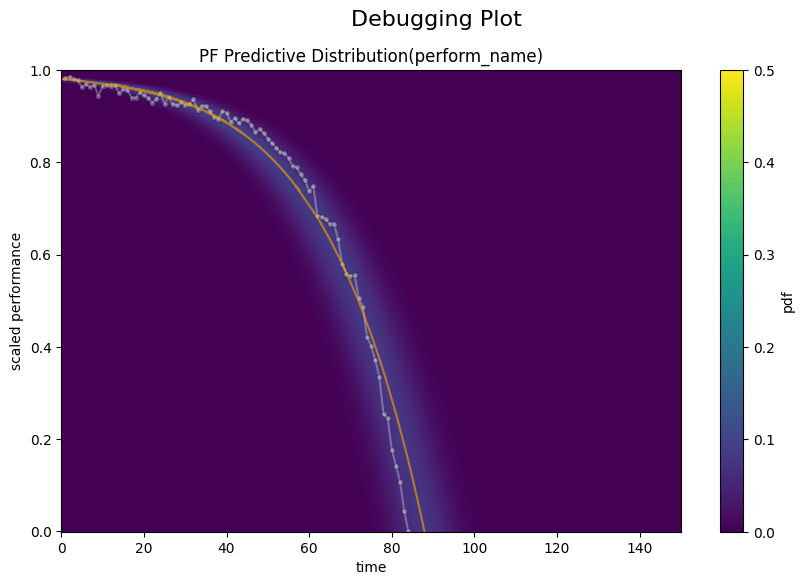

Epoch 61000, Best Loss: 0.23877334594726562
Epoch 62000, Best Loss: 0.2386772781610489
Epoch 63000, Best Loss: 0.23858177661895752
Epoch 64000, Best Loss: 0.23848652839660645
Epoch 65000, Best Loss: 0.2383974939584732
Epoch 66000, Best Loss: 0.23830072581768036
Epoch 67000, Best Loss: 0.23820798099040985
Epoch 68000, Best Loss: 0.23811687529087067
Epoch 69000, Best Loss: 0.2380276918411255
Epoch 70000, Best Loss: 0.23793892562389374
Epoch 71000, Best Loss: 0.2378499060869217
Epoch 72000, Best Loss: 0.23776128888130188
Epoch 73000, Best Loss: 0.23767422139644623
Epoch 74000, Best Loss: 0.23758909106254578
Epoch 75000, Best Loss: 0.23750196397304535
Epoch 76000, Best Loss: 0.2374178171157837
Epoch 77000, Best Loss: 0.2373342216014862
Epoch 78000, Best Loss: 0.23725175857543945
Epoch 79000, Best Loss: 0.23716731369495392
Epoch 80000, Best Loss: 0.23708514869213104


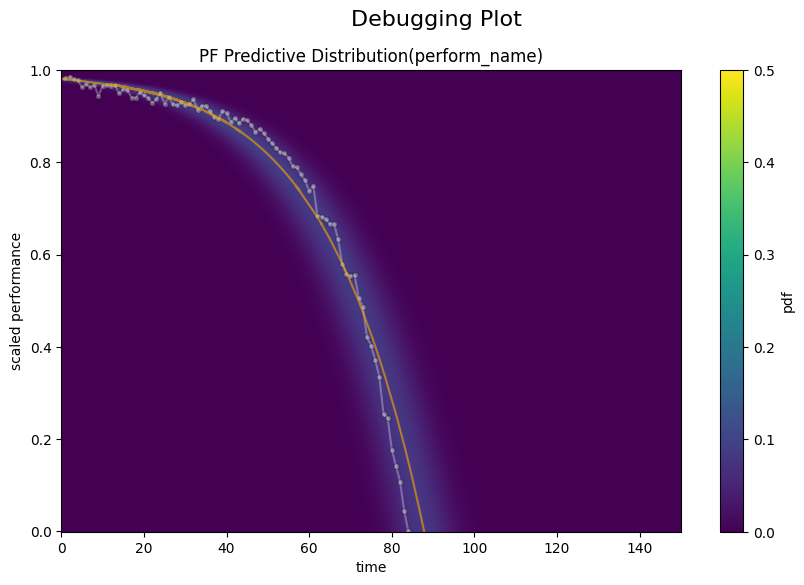

Epoch 81000, Best Loss: 0.23700423538684845
Epoch 82000, Best Loss: 0.2369232177734375
Epoch 83000, Best Loss: 0.23684296011924744
Epoch 84000, Best Loss: 0.2367648482322693
Epoch 85000, Best Loss: 0.2366875410079956
Epoch 86000, Best Loss: 0.2366085648536682
Epoch 87000, Best Loss: 0.23653064668178558
Epoch 88000, Best Loss: 0.2364548146724701
Epoch 89000, Best Loss: 0.23637862503528595
Epoch 90000, Best Loss: 0.23630347847938538
Epoch 91000, Best Loss: 0.23622816801071167
Epoch 92000, Best Loss: 0.23615413904190063
Epoch 93000, Best Loss: 0.23607999086380005
Epoch 94000, Best Loss: 0.2360072284936905
Epoch 95000, Best Loss: 0.2359362542629242
Epoch 96000, Best Loss: 0.2358626127243042
Epoch 97000, Best Loss: 0.23579095304012299
Epoch 98000, Best Loss: 0.23572136461734772
Epoch 99000, Best Loss: 0.2356514185667038
Best value: 0.23558026552200317
Best parameters: {'p': 13.564229965209961, 'mu': 226.131103515625, 'a': 0.9919078161459991, 'mean': 314.089111328125, 'var': 24.1386489868164

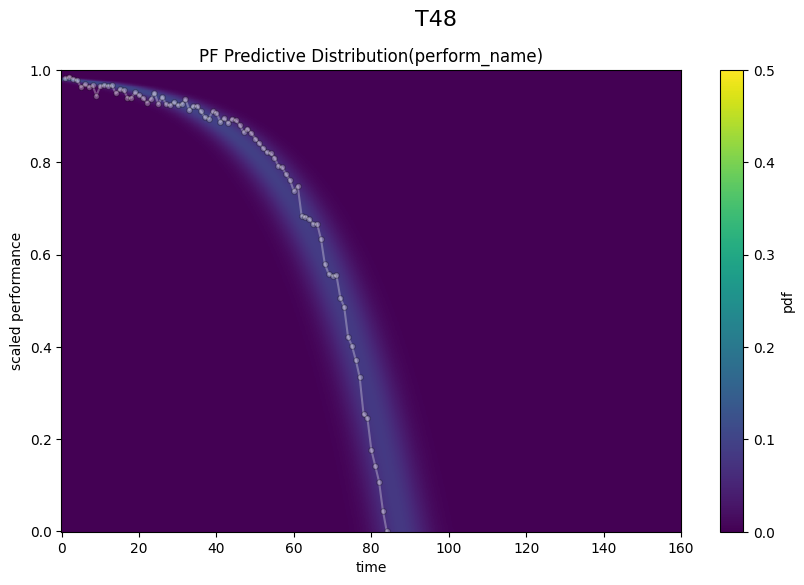

Epoch 1000, Best Loss: 1.1033718585968018
Epoch 2000, Best Loss: 1.0701254606246948
Epoch 3000, Best Loss: 1.041982650756836
Epoch 4000, Best Loss: 1.0179219245910645
Epoch 5000, Best Loss: 0.9974086284637451
Epoch 6000, Best Loss: 0.9801791310310364
Epoch 7000, Best Loss: 0.9660492539405823
Epoch 8000, Best Loss: 0.9548465013504028
Epoch 9000, Best Loss: 0.9463890790939331
Epoch 10000, Best Loss: 0.9404261708259583
Epoch 11000, Best Loss: 0.9365877509117126
Epoch 12000, Best Loss: 0.9343799948692322
Epoch 13000, Best Loss: 0.9331986308097839
Epoch 14000, Best Loss: 0.9324353337287903
Epoch 15000, Best Loss: 0.9316810965538025
Epoch 16000, Best Loss: 0.9308061003684998
Epoch 17000, Best Loss: 0.9298142790794373
Epoch 18000, Best Loss: 0.9287477731704712
Epoch 19000, Best Loss: 0.927641749382019
Epoch 20000, Best Loss: 0.9265196919441223


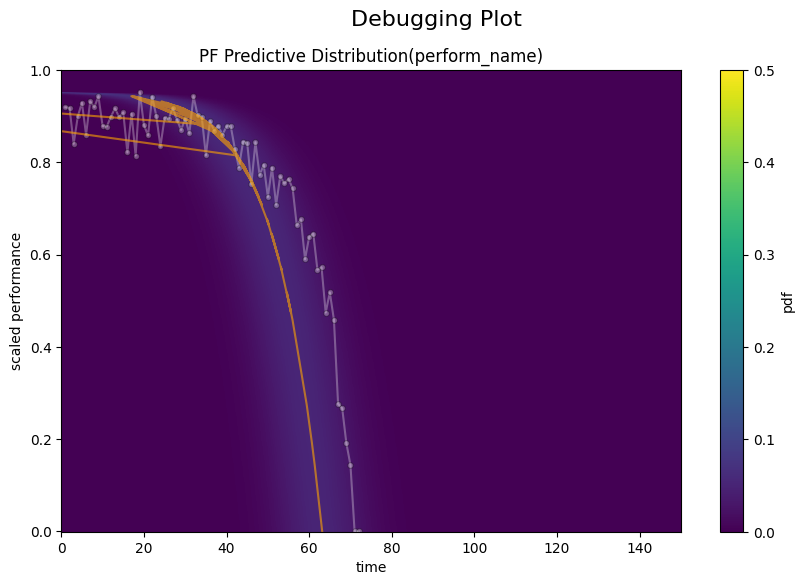

Epoch 21000, Best Loss: 0.9253885746002197
Epoch 22000, Best Loss: 0.924252986907959
Epoch 23000, Best Loss: 0.9231170415878296
Epoch 24000, Best Loss: 0.9219745993614197
Epoch 25000, Best Loss: 0.9208294153213501
Epoch 26000, Best Loss: 0.9196759462356567
Epoch 27000, Best Loss: 0.9185162782669067
Epoch 28000, Best Loss: 0.9173519611358643
Epoch 29000, Best Loss: 0.916179358959198
Epoch 30000, Best Loss: 0.9149981141090393
Epoch 31000, Best Loss: 0.9138143062591553
Epoch 32000, Best Loss: 0.9126238822937012
Epoch 33000, Best Loss: 0.9114232063293457
Epoch 34000, Best Loss: 0.9102134108543396
Epoch 35000, Best Loss: 0.9089937806129456
Epoch 36000, Best Loss: 0.9077642560005188
Epoch 37000, Best Loss: 0.9065233469009399
Epoch 38000, Best Loss: 0.9052696228027344
Epoch 39000, Best Loss: 0.9040059447288513
Epoch 40000, Best Loss: 0.902729332447052


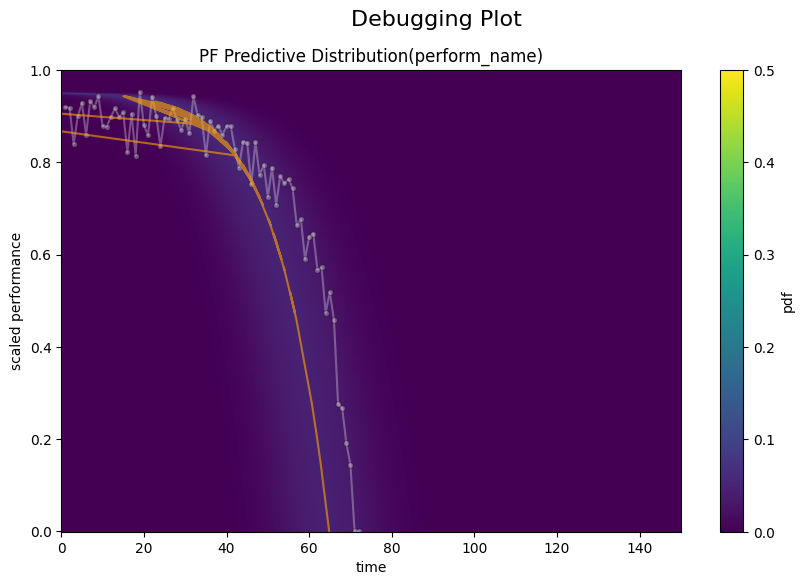

Epoch 41000, Best Loss: 0.9014456272125244
Epoch 42000, Best Loss: 0.9001526832580566
Epoch 43000, Best Loss: 0.898845911026001
Epoch 44000, Best Loss: 0.8975271582603455
Epoch 45000, Best Loss: 0.8961944580078125
Epoch 46000, Best Loss: 0.8948526978492737
Epoch 47000, Best Loss: 0.8934987783432007
Epoch 48000, Best Loss: 0.8921303749084473
Epoch 49000, Best Loss: 0.8907477259635925
Epoch 50000, Best Loss: 0.8893503546714783
Epoch 51000, Best Loss: 0.8879384994506836
Epoch 52000, Best Loss: 0.886511504650116
Epoch 53000, Best Loss: 0.885068953037262
Epoch 54000, Best Loss: 0.8836113810539246
Epoch 55000, Best Loss: 0.8821379542350769
Epoch 56000, Best Loss: 0.8806535601615906
Epoch 57000, Best Loss: 0.8791579008102417
Epoch 58000, Best Loss: 0.8776460886001587
Epoch 59000, Best Loss: 0.8761180639266968
Epoch 60000, Best Loss: 0.8745737075805664


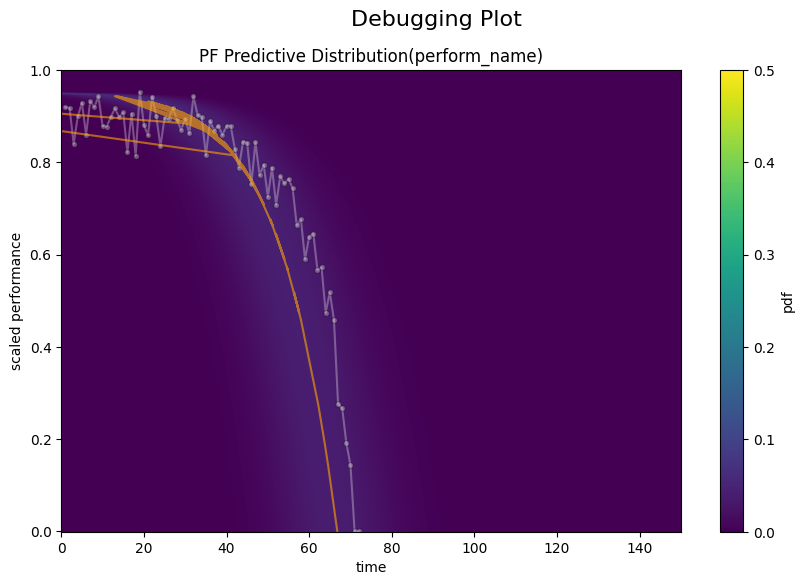

Epoch 61000, Best Loss: 0.8730135560035706
Epoch 62000, Best Loss: 0.8714369535446167
Epoch 63000, Best Loss: 0.8698439002037048
Epoch 64000, Best Loss: 0.8682323098182678
Epoch 65000, Best Loss: 0.866604745388031
Epoch 66000, Best Loss: 0.8649603128433228
Epoch 67000, Best Loss: 0.8632993698120117
Epoch 68000, Best Loss: 0.8616219162940979
Epoch 69000, Best Loss: 0.8599278926849365
Epoch 70000, Best Loss: 0.8582181930541992
Epoch 71000, Best Loss: 0.8564920425415039
Epoch 72000, Best Loss: 0.854749858379364
Epoch 73000, Best Loss: 0.8529910445213318
Epoch 74000, Best Loss: 0.8512165546417236
Epoch 75000, Best Loss: 0.8494364619255066
Epoch 76000, Best Loss: 0.8476431965827942
Epoch 77000, Best Loss: 0.8458344340324402
Epoch 78000, Best Loss: 0.8440114855766296
Epoch 79000, Best Loss: 0.8421737551689148
Epoch 80000, Best Loss: 0.8403214812278748


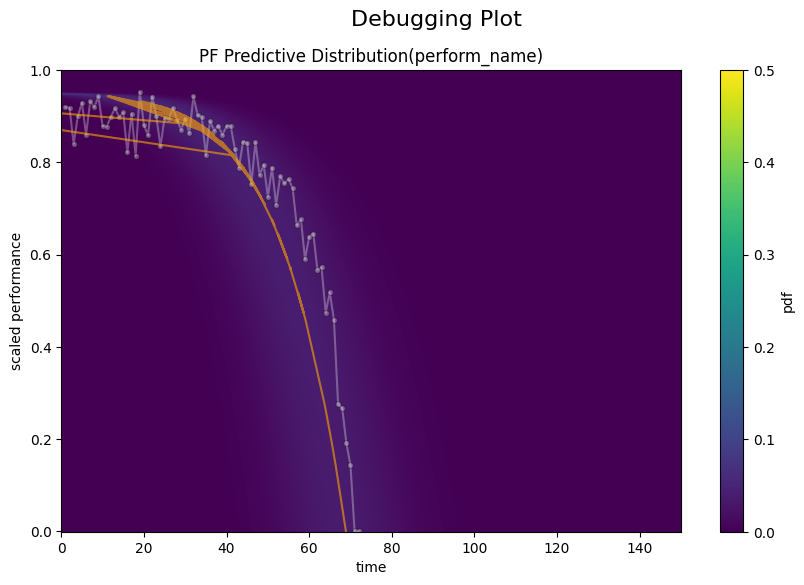

Epoch 81000, Best Loss: 0.8384554386138916
Epoch 82000, Best Loss: 0.8365762829780579
Epoch 83000, Best Loss: 0.8346837162971497
Epoch 84000, Best Loss: 0.8327780961990356
Epoch 85000, Best Loss: 0.8308601379394531
Epoch 86000, Best Loss: 0.8289302587509155
Epoch 87000, Best Loss: 0.8269873261451721
Epoch 88000, Best Loss: 0.8250334858894348
Epoch 89000, Best Loss: 0.8230689764022827
Epoch 90000, Best Loss: 0.8210948705673218
Epoch 91000, Best Loss: 0.8191118836402893
Epoch 92000, Best Loss: 0.8171195983886719
Epoch 93000, Best Loss: 0.8151196241378784
Epoch 94000, Best Loss: 0.8131124377250671
Epoch 95000, Best Loss: 0.8110983967781067
Epoch 96000, Best Loss: 0.8090896606445312
Epoch 97000, Best Loss: 0.80707848072052
Epoch 98000, Best Loss: 0.8050633668899536
Epoch 99000, Best Loss: 0.8030446767807007
Best value: 0.8010258674621582
Best parameters: {'p': 8.175506591796875, 'mu': 68.05289459228516, 'a': 0.9520178920816902, 'mean': 139.57472229003906, 'var': 142.1330108642578}


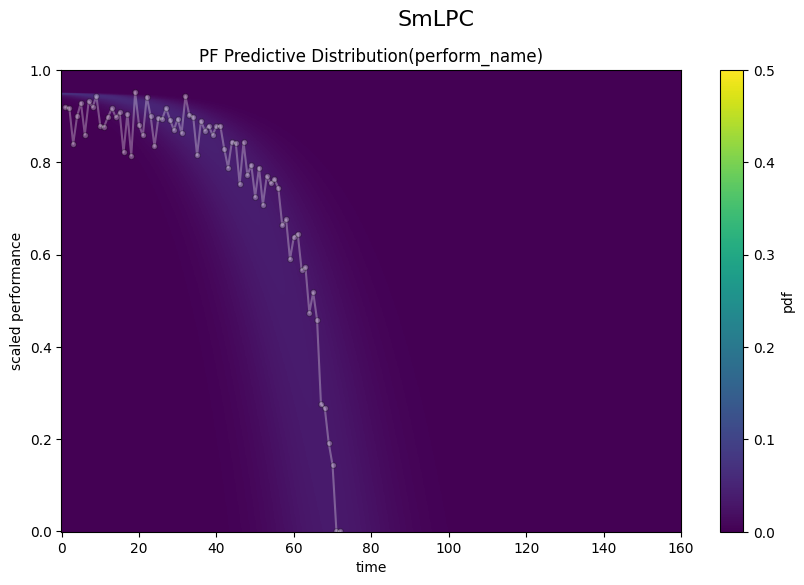

Epoch 1000, Best Loss: 1.0196186304092407
Epoch 2000, Best Loss: 0.9844570755958557
Epoch 3000, Best Loss: 0.952961802482605
Epoch 4000, Best Loss: 0.9245307445526123
Epoch 5000, Best Loss: 0.9000424742698669
Epoch 6000, Best Loss: 0.8796860575675964
Epoch 7000, Best Loss: 0.8633794784545898
Epoch 8000, Best Loss: 0.8508822321891785
Epoch 9000, Best Loss: 0.8418931365013123
Epoch 10000, Best Loss: 0.8359744548797607
Epoch 11000, Best Loss: 0.8325246572494507
Epoch 12000, Best Loss: 0.8307421207427979
Epoch 13000, Best Loss: 0.829694926738739
Epoch 14000, Best Loss: 0.828681230545044
Epoch 15000, Best Loss: 0.8274758458137512
Epoch 16000, Best Loss: 0.8260793089866638
Epoch 17000, Best Loss: 0.8245545029640198
Epoch 18000, Best Loss: 0.8229589462280273
Epoch 19000, Best Loss: 0.8213299512863159
Epoch 20000, Best Loss: 0.8196896314620972


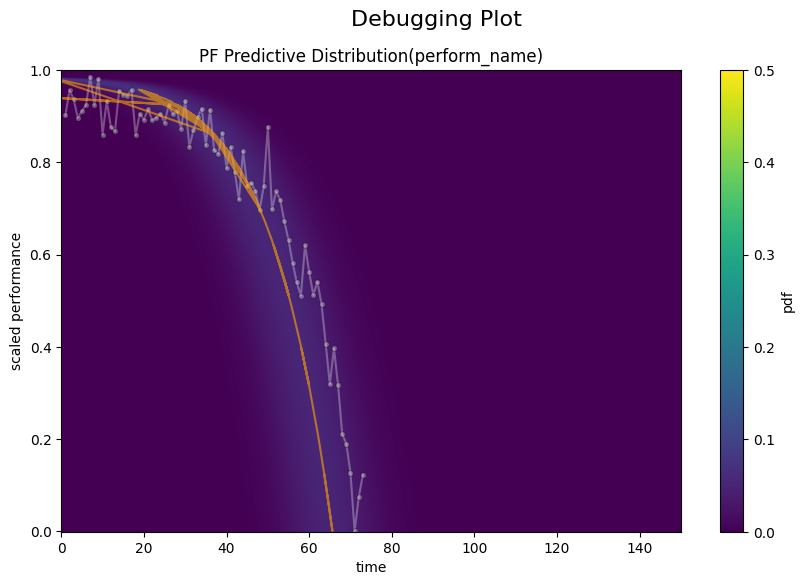

Epoch 21000, Best Loss: 0.8180404901504517
Epoch 22000, Best Loss: 0.8163851499557495
Epoch 23000, Best Loss: 0.8147170543670654
Epoch 24000, Best Loss: 0.8130404949188232
Epoch 25000, Best Loss: 0.8113595247268677
Epoch 26000, Best Loss: 0.8096758127212524
Epoch 27000, Best Loss: 0.8079821467399597
Epoch 28000, Best Loss: 0.8062809109687805
Epoch 29000, Best Loss: 0.8045720458030701
Epoch 30000, Best Loss: 0.8028499484062195
Epoch 31000, Best Loss: 0.8011189103126526
Epoch 32000, Best Loss: 0.7993746995925903
Epoch 33000, Best Loss: 0.7976195812225342
Epoch 34000, Best Loss: 0.7958529591560364
Epoch 35000, Best Loss: 0.7940758466720581
Epoch 36000, Best Loss: 0.7922982573509216
Epoch 37000, Best Loss: 0.7905086278915405
Epoch 38000, Best Loss: 0.7887099385261536
Epoch 39000, Best Loss: 0.7868987321853638
Epoch 40000, Best Loss: 0.7850687503814697


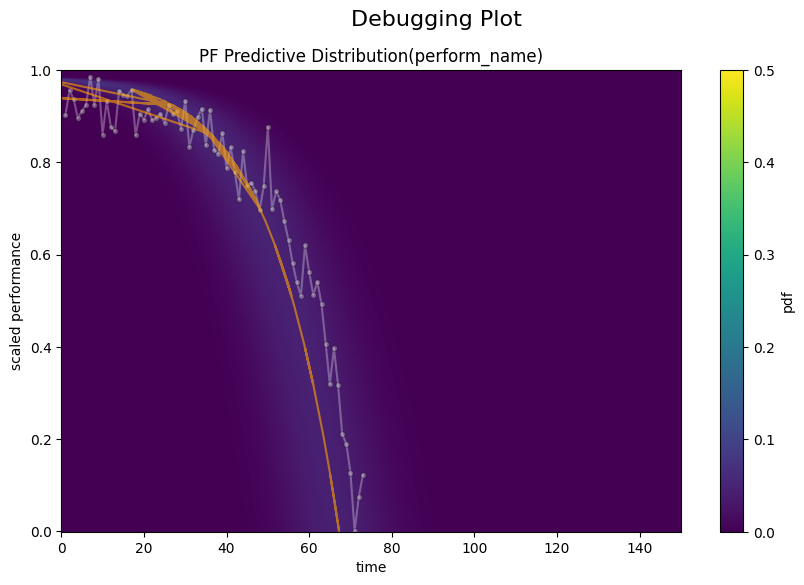

Epoch 41000, Best Loss: 0.7832286953926086
Epoch 42000, Best Loss: 0.7813766002655029
Epoch 43000, Best Loss: 0.7795091271400452
Epoch 44000, Best Loss: 0.7776299715042114
Epoch 45000, Best Loss: 0.7757359147071838
Epoch 46000, Best Loss: 0.7738272547721863
Epoch 47000, Best Loss: 0.7719122171401978
Epoch 48000, Best Loss: 0.769987940788269
Epoch 49000, Best Loss: 0.768051266670227
Epoch 50000, Best Loss: 0.7660993933677673
Epoch 51000, Best Loss: 0.7641346454620361
Epoch 52000, Best Loss: 0.7621564269065857
Epoch 53000, Best Loss: 0.7601638436317444
Epoch 54000, Best Loss: 0.7581573724746704
Epoch 55000, Best Loss: 0.7561383247375488
Epoch 56000, Best Loss: 0.7541054487228394
Epoch 57000, Best Loss: 0.7520589828491211
Epoch 58000, Best Loss: 0.7499995231628418
Epoch 59000, Best Loss: 0.7479263544082642
Epoch 60000, Best Loss: 0.7458437085151672


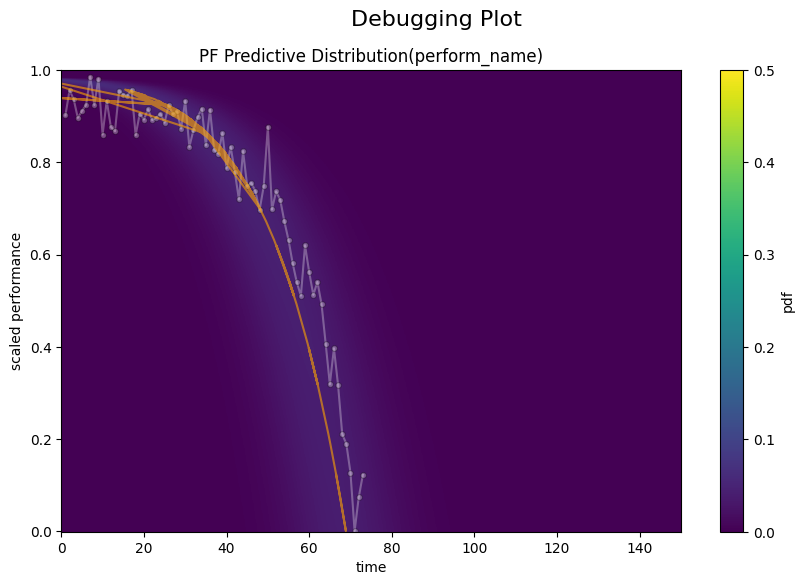

Epoch 61000, Best Loss: 0.7437564134597778
Epoch 62000, Best Loss: 0.74165940284729
Epoch 63000, Best Loss: 0.739547848701477
Epoch 64000, Best Loss: 0.7374241948127747
Epoch 65000, Best Loss: 0.7352893948554993
Epoch 66000, Best Loss: 0.7331430912017822
Epoch 67000, Best Loss: 0.7309859991073608
Epoch 68000, Best Loss: 0.7288187146186829
Epoch 69000, Best Loss: 0.7266409397125244
Epoch 70000, Best Loss: 0.7244529128074646
Epoch 71000, Best Loss: 0.722254753112793
Epoch 72000, Best Loss: 0.7200484275817871
Epoch 73000, Best Loss: 0.717833399772644
Epoch 74000, Best Loss: 0.7156093120574951
Epoch 75000, Best Loss: 0.7133780717849731
Epoch 76000, Best Loss: 0.7111390829086304
Epoch 77000, Best Loss: 0.7088936567306519
Epoch 78000, Best Loss: 0.706642210483551
Epoch 79000, Best Loss: 0.7043847441673279
Epoch 80000, Best Loss: 0.7021254301071167


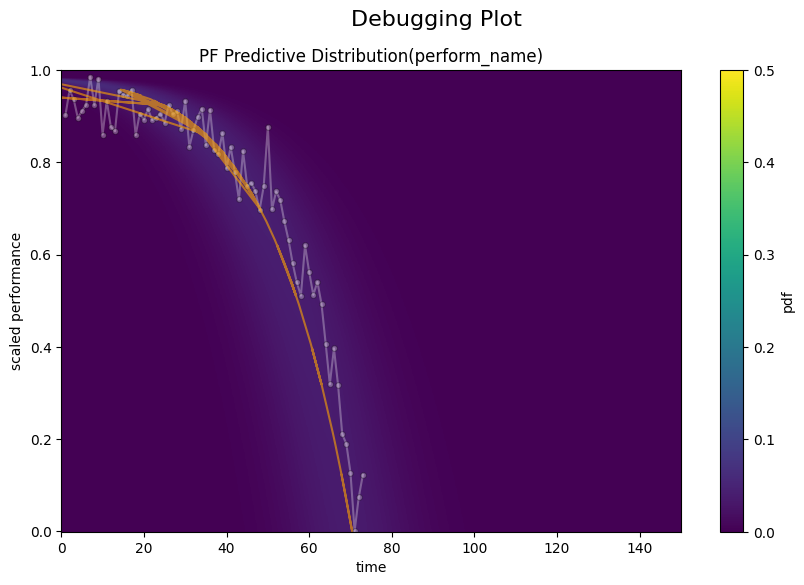

Epoch 81000, Best Loss: 0.6998734474182129
Epoch 82000, Best Loss: 0.6976175308227539
Epoch 83000, Best Loss: 0.6953588128089905
Epoch 84000, Best Loss: 0.6930976510047913
Epoch 85000, Best Loss: 0.6908351182937622
Epoch 86000, Best Loss: 0.6885700821876526
Epoch 87000, Best Loss: 0.6863041520118713
Epoch 88000, Best Loss: 0.6840384006500244
Epoch 89000, Best Loss: 0.6817741990089417
Epoch 90000, Best Loss: 0.6795126795768738
Epoch 91000, Best Loss: 0.6772538423538208
Epoch 92000, Best Loss: 0.6749996542930603
Epoch 93000, Best Loss: 0.672749936580658
Epoch 94000, Best Loss: 0.6705068945884705
Epoch 95000, Best Loss: 0.668270468711853
Epoch 96000, Best Loss: 0.6660424470901489
Epoch 97000, Best Loss: 0.6638354063034058
Epoch 98000, Best Loss: 0.6616412401199341
Epoch 99000, Best Loss: 0.659458577632904
Best value: 0.6572905778884888
Best parameters: {'p': 6.616086006164551, 'mu': 66.56708526611328, 'a': 0.985467243459273, 'mean': 138.404296875, 'var': 142.54751586914062}


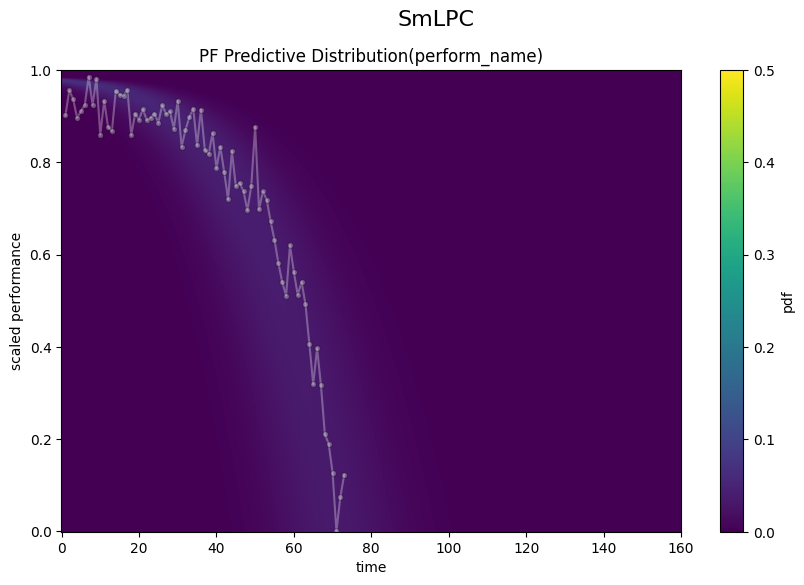

Epoch 1000, Best Loss: 2.2538328170776367
Epoch 2000, Best Loss: 2.11395001411438
Epoch 3000, Best Loss: 1.9993932247161865
Epoch 4000, Best Loss: 1.9004580974578857
Epoch 5000, Best Loss: 1.812610149383545
Epoch 6000, Best Loss: 1.7333917617797852
Epoch 7000, Best Loss: 1.661513328552246
Epoch 8000, Best Loss: 1.5962371826171875
Epoch 9000, Best Loss: 1.5371590852737427
Epoch 10000, Best Loss: 1.4840867519378662
Epoch 11000, Best Loss: 1.4367849826812744
Epoch 12000, Best Loss: 1.395018458366394
Epoch 13000, Best Loss: 1.358401894569397
Epoch 14000, Best Loss: 1.3262619972229004
Epoch 15000, Best Loss: 1.2977499961853027
Epoch 16000, Best Loss: 1.2720588445663452
Epoch 17000, Best Loss: 1.2486729621887207
Epoch 18000, Best Loss: 1.2273186445236206
Epoch 19000, Best Loss: 1.2078173160552979
Epoch 20000, Best Loss: 1.1900403499603271


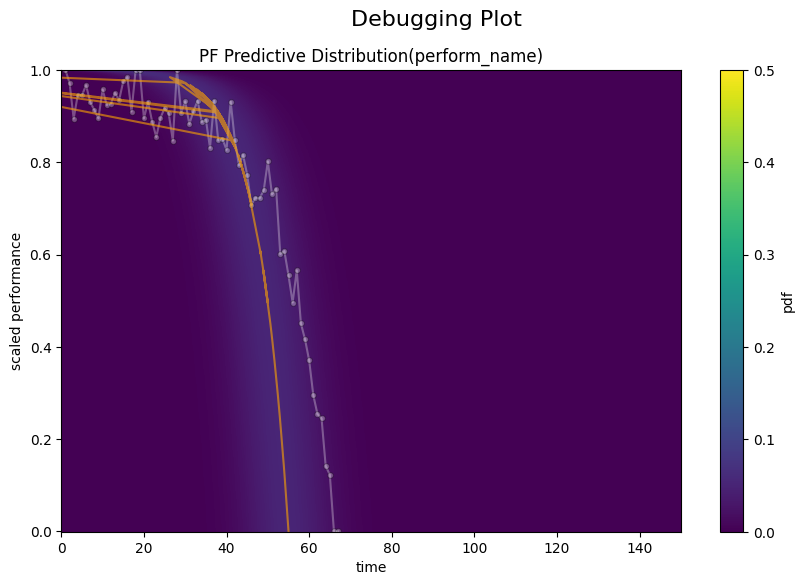

Epoch 21000, Best Loss: 1.1738321781158447
Epoch 22000, Best Loss: 1.1590502262115479
Epoch 23000, Best Loss: 1.1455711126327515
Epoch 24000, Best Loss: 1.133284091949463
Epoch 25000, Best Loss: 1.1220860481262207
Epoch 26000, Best Loss: 1.1118890047073364
Epoch 27000, Best Loss: 1.1026225090026855
Epoch 28000, Best Loss: 1.094205617904663
Epoch 29000, Best Loss: 1.0865598917007446
Epoch 30000, Best Loss: 1.0796287059783936
Epoch 31000, Best Loss: 1.0733656883239746
Epoch 32000, Best Loss: 1.0677151679992676
Epoch 33000, Best Loss: 1.0626168251037598
Epoch 34000, Best Loss: 1.058029055595398
Epoch 35000, Best Loss: 1.0539106130599976
Epoch 36000, Best Loss: 1.05022132396698
Epoch 37000, Best Loss: 1.0469290018081665
Epoch 38000, Best Loss: 1.044006109237671
Epoch 39000, Best Loss: 1.0414260625839233
Epoch 40000, Best Loss: 1.0391517877578735


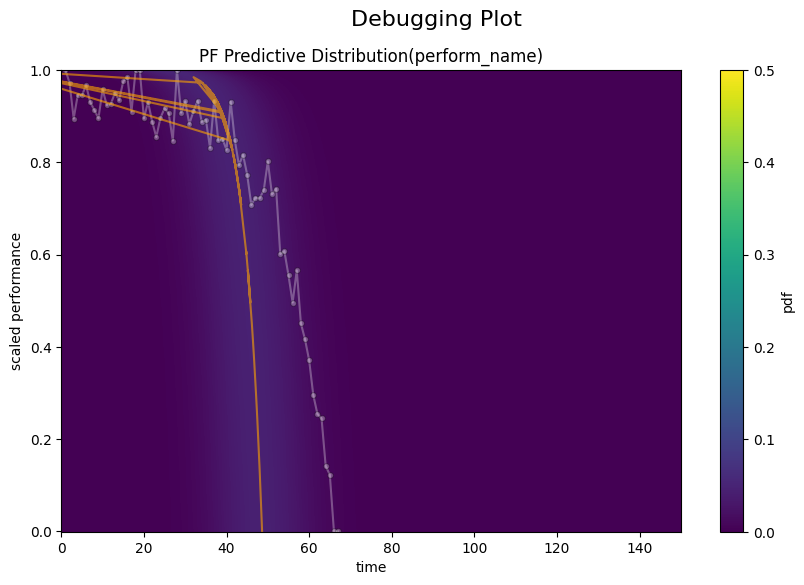

Epoch 41000, Best Loss: 1.037161946296692
Epoch 42000, Best Loss: 1.0354331731796265
Epoch 43000, Best Loss: 1.0339455604553223
Epoch 44000, Best Loss: 1.0326751470565796
Epoch 45000, Best Loss: 1.0316048860549927
Epoch 46000, Best Loss: 1.0307146310806274
Epoch 47000, Best Loss: 1.029988408088684
Epoch 48000, Best Loss: 1.029407262802124
Epoch 49000, Best Loss: 1.028951644897461
Epoch 50000, Best Loss: 1.028599739074707
Epoch 51000, Best Loss: 1.028324842453003
Epoch 52000, Best Loss: 1.0280932188034058
Epoch 53000, Best Loss: 1.0278682708740234
Epoch 54000, Best Loss: 1.0276306867599487
Epoch 55000, Best Loss: 1.0273849964141846
Epoch 56000, Best Loss: 1.0271364450454712
Epoch 57000, Best Loss: 1.0268876552581787
Epoch 58000, Best Loss: 1.0266380310058594
Epoch 59000, Best Loss: 1.0263872146606445
Epoch 60000, Best Loss: 1.026134729385376


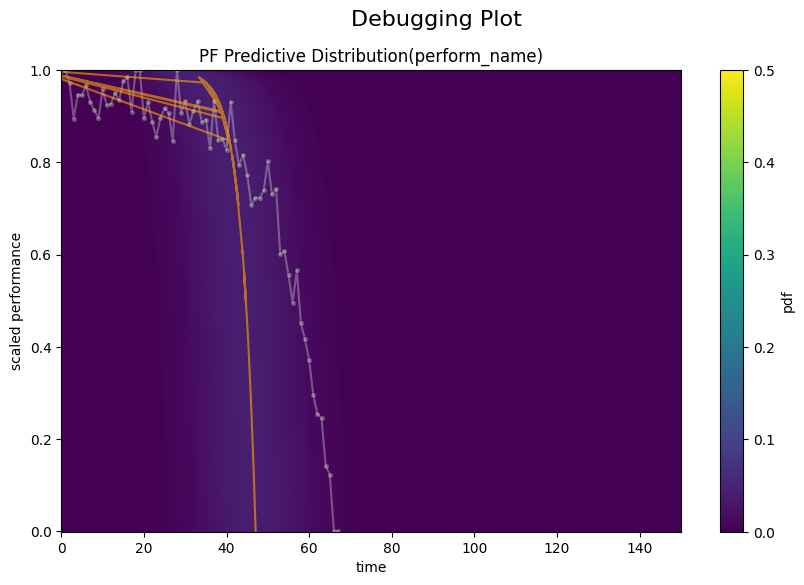

Epoch 61000, Best Loss: 1.025881052017212
Epoch 62000, Best Loss: 1.0256255865097046
Epoch 63000, Best Loss: 1.025368571281433
Epoch 64000, Best Loss: 1.0251091718673706
Epoch 65000, Best Loss: 1.0248486995697021
Epoch 66000, Best Loss: 1.024585485458374
Epoch 67000, Best Loss: 1.0243198871612549
Epoch 68000, Best Loss: 1.024051547050476
Epoch 69000, Best Loss: 1.023781180381775
Epoch 70000, Best Loss: 1.0235071182250977
Epoch 71000, Best Loss: 1.0232301950454712
Epoch 72000, Best Loss: 1.0229490995407104
Epoch 73000, Best Loss: 1.0226658582687378
Epoch 74000, Best Loss: 1.0223785638809204
Epoch 75000, Best Loss: 1.0220876932144165
Epoch 76000, Best Loss: 1.0217927694320679
Epoch 77000, Best Loss: 1.021493673324585
Epoch 78000, Best Loss: 1.0211900472640991
Epoch 79000, Best Loss: 1.0208818912506104
Epoch 80000, Best Loss: 1.0205692052841187


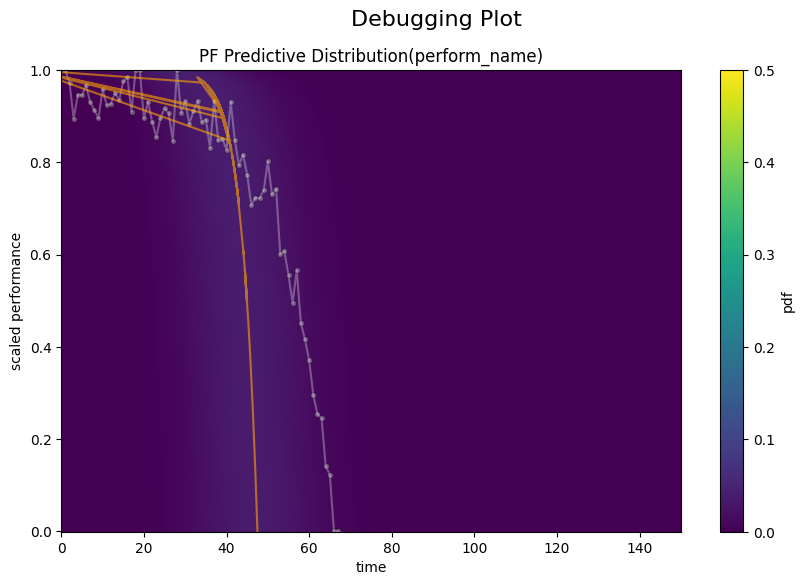

Epoch 81000, Best Loss: 1.020250916481018
Epoch 82000, Best Loss: 1.0199278593063354
Epoch 83000, Best Loss: 1.0195987224578857
Epoch 84000, Best Loss: 1.0192639827728271
Epoch 85000, Best Loss: 1.018923282623291
Epoch 86000, Best Loss: 1.0185755491256714
Epoch 87000, Best Loss: 1.0182214975357056
Epoch 88000, Best Loss: 1.0178604125976562
Epoch 89000, Best Loss: 1.017491102218628
Epoch 90000, Best Loss: 1.0171146392822266
Epoch 91000, Best Loss: 1.0167293548583984
Epoch 92000, Best Loss: 1.0163352489471436
Epoch 93000, Best Loss: 1.0159320831298828
Epoch 94000, Best Loss: 1.015519618988037
Epoch 95000, Best Loss: 1.0150970220565796
Epoch 96000, Best Loss: 1.0146634578704834
Epoch 97000, Best Loss: 1.0142189264297485
Epoch 98000, Best Loss: 1.013762354850769
Epoch 99000, Best Loss: 1.013293743133545
Best value: 1.012811541557312
Best parameters: {'p': 32.347476959228516, 'mu': 85.19010925292969, 'a': 1.000000000065207, 'mean': 133.42791748046875, 'var': 138.8379364013672}


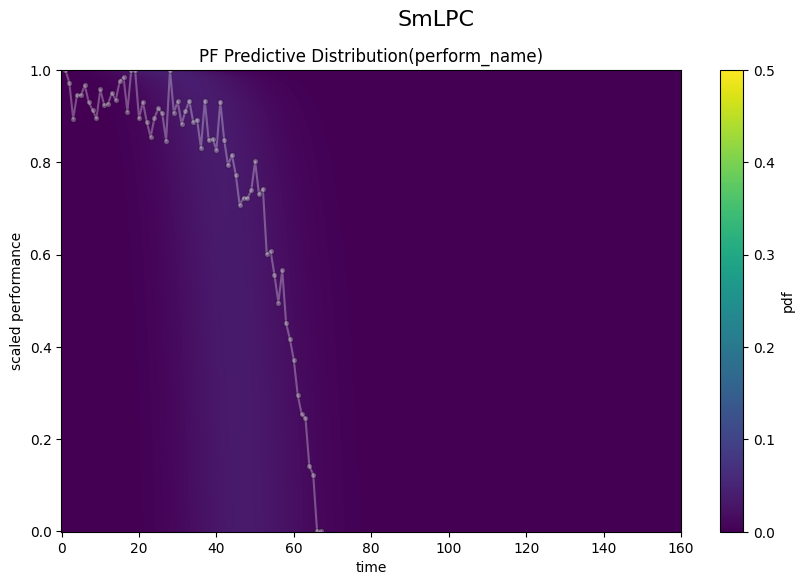

Epoch 1000, Best Loss: 1.3023936748504639
Epoch 2000, Best Loss: 1.23891019821167
Epoch 3000, Best Loss: 1.1774187088012695
Epoch 4000, Best Loss: 1.1193079948425293
Epoch 5000, Best Loss: 1.0649346113204956
Epoch 6000, Best Loss: 1.0139387845993042
Epoch 7000, Best Loss: 0.9669385552406311
Epoch 8000, Best Loss: 0.923683762550354
Epoch 9000, Best Loss: 0.8845837712287903
Epoch 10000, Best Loss: 0.8497018814086914
Epoch 11000, Best Loss: 0.8192666172981262
Epoch 12000, Best Loss: 0.7934905886650085
Epoch 13000, Best Loss: 0.7724890112876892
Epoch 14000, Best Loss: 0.7562786936759949
Epoch 15000, Best Loss: 0.7446924448013306
Epoch 16000, Best Loss: 0.7373077869415283
Epoch 17000, Best Loss: 0.7333426475524902
Epoch 18000, Best Loss: 0.731667160987854
Epoch 19000, Best Loss: 0.7310613393783569
Epoch 20000, Best Loss: 0.7306634187698364


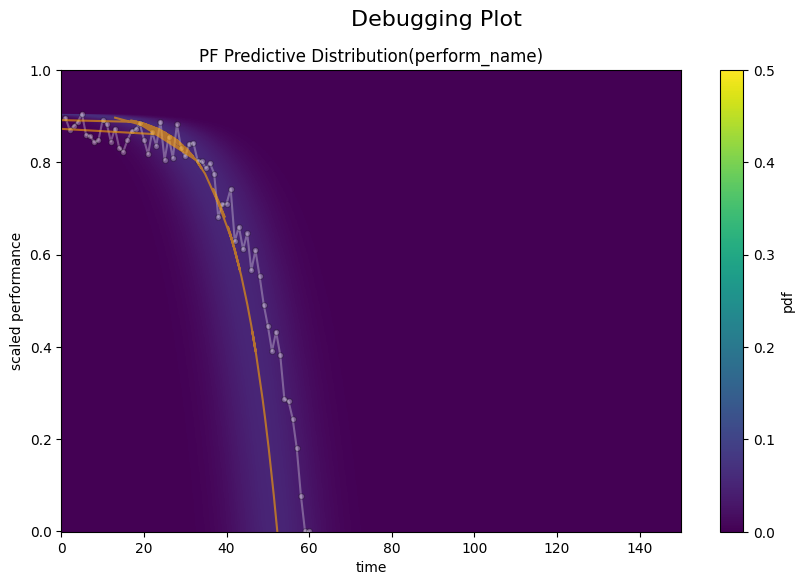

Epoch 21000, Best Loss: 0.7301939129829407
Epoch 22000, Best Loss: 0.7295932173728943
Epoch 23000, Best Loss: 0.7288535833358765
Epoch 24000, Best Loss: 0.7280057668685913
Epoch 25000, Best Loss: 0.72709721326828
Epoch 26000, Best Loss: 0.7261531352996826
Epoch 27000, Best Loss: 0.7251955270767212
Epoch 28000, Best Loss: 0.7242276072502136
Epoch 29000, Best Loss: 0.7232505679130554
Epoch 30000, Best Loss: 0.7222661375999451
Epoch 31000, Best Loss: 0.7212716341018677
Epoch 32000, Best Loss: 0.7202697992324829
Epoch 33000, Best Loss: 0.7192568182945251
Epoch 34000, Best Loss: 0.7182353734970093
Epoch 35000, Best Loss: 0.71720290184021
Epoch 36000, Best Loss: 0.7161601185798645
Epoch 37000, Best Loss: 0.7151061296463013
Epoch 38000, Best Loss: 0.714040219783783
Epoch 39000, Best Loss: 0.7129630446434021
Epoch 40000, Best Loss: 0.7118734121322632


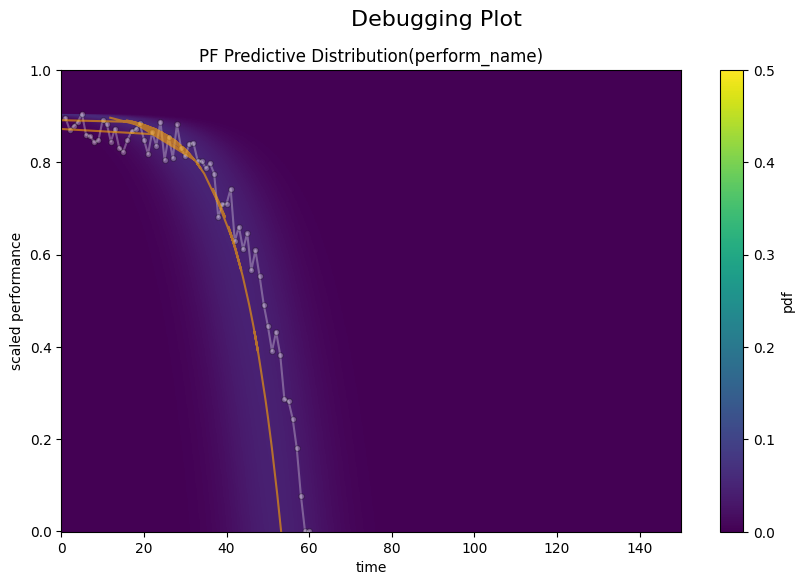

Epoch 41000, Best Loss: 0.7107719779014587
Epoch 42000, Best Loss: 0.7096596956253052
Epoch 43000, Best Loss: 0.7085349559783936
Epoch 44000, Best Loss: 0.7073938250541687
Epoch 45000, Best Loss: 0.7062415480613708
Epoch 46000, Best Loss: 0.7050729393959045
Epoch 47000, Best Loss: 0.7038915157318115
Epoch 48000, Best Loss: 0.7026945352554321
Epoch 49000, Best Loss: 0.7014960050582886
Epoch 50000, Best Loss: 0.7002843618392944
Epoch 51000, Best Loss: 0.6990574598312378
Epoch 52000, Best Loss: 0.6978151202201843
Epoch 53000, Best Loss: 0.6965540051460266
Epoch 54000, Best Loss: 0.6952751874923706
Epoch 55000, Best Loss: 0.6939805150032043
Epoch 56000, Best Loss: 0.6926677823066711
Epoch 57000, Best Loss: 0.6913400888442993
Epoch 58000, Best Loss: 0.6899971961975098
Epoch 59000, Best Loss: 0.6886359453201294
Epoch 60000, Best Loss: 0.687257707118988


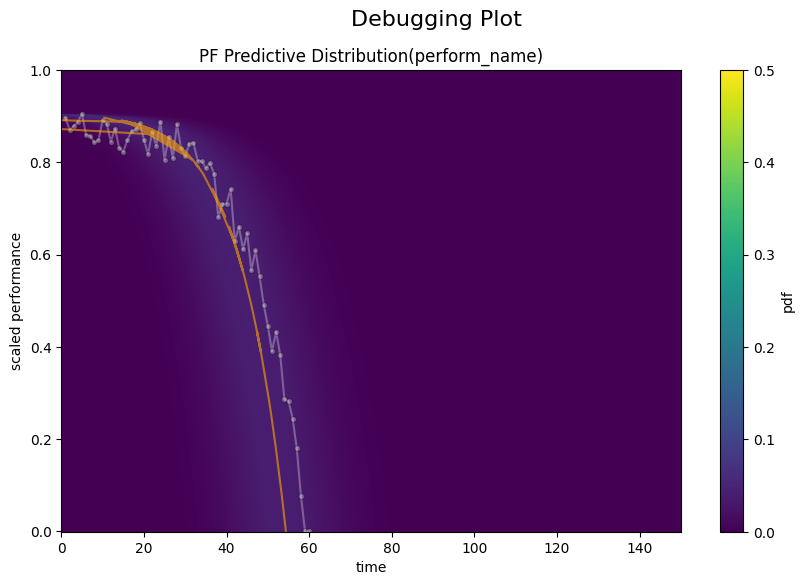

Epoch 61000, Best Loss: 0.6858598589897156
Epoch 62000, Best Loss: 0.6844441294670105
Epoch 63000, Best Loss: 0.683009147644043
Epoch 64000, Best Loss: 0.6815555691719055
Epoch 65000, Best Loss: 0.6800814867019653
Epoch 66000, Best Loss: 0.678587794303894
Epoch 67000, Best Loss: 0.6770743131637573
Epoch 68000, Best Loss: 0.6755394339561462
Epoch 69000, Best Loss: 0.6739844083786011
Epoch 70000, Best Loss: 0.6724075675010681
Epoch 71000, Best Loss: 0.6708102822303772
Epoch 72000, Best Loss: 0.6691914200782776
Epoch 73000, Best Loss: 0.6675500869750977
Epoch 74000, Best Loss: 0.6658929586410522
Epoch 75000, Best Loss: 0.6642187237739563
Epoch 76000, Best Loss: 0.6625218987464905
Epoch 77000, Best Loss: 0.6608030796051025
Epoch 78000, Best Loss: 0.6590613126754761
Epoch 79000, Best Loss: 0.6572966575622559
Epoch 80000, Best Loss: 0.6555087566375732


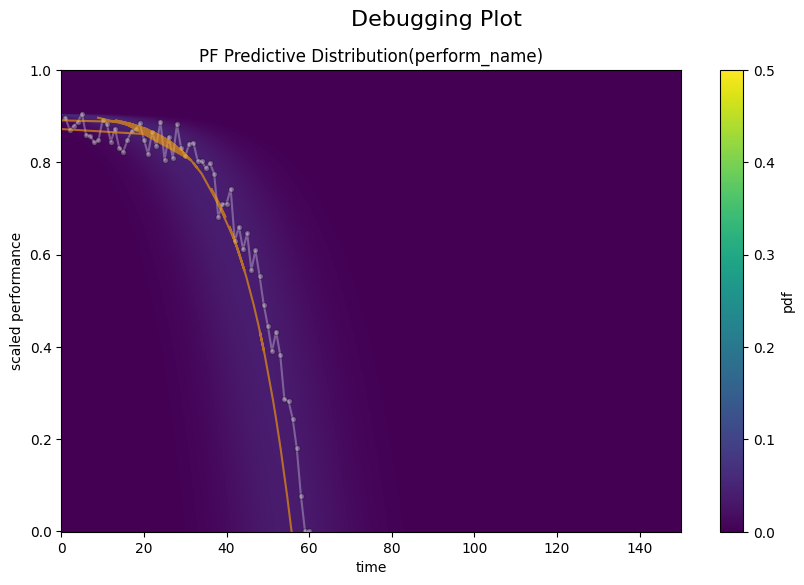

Epoch 81000, Best Loss: 0.6536972522735596
Epoch 82000, Best Loss: 0.6518630385398865
Epoch 83000, Best Loss: 0.6500051021575928
Epoch 84000, Best Loss: 0.6481232643127441
Epoch 85000, Best Loss: 0.6462180018424988
Epoch 86000, Best Loss: 0.6442884802818298
Epoch 87000, Best Loss: 0.6423352360725403
Epoch 88000, Best Loss: 0.640357255935669
Epoch 89000, Best Loss: 0.6383554339408875
Epoch 90000, Best Loss: 0.6363288760185242
Epoch 91000, Best Loss: 0.6342785954475403
Epoch 92000, Best Loss: 0.632204532623291
Epoch 93000, Best Loss: 0.6301060318946838
Epoch 94000, Best Loss: 0.6279838681221008
Epoch 95000, Best Loss: 0.6258379817008972
Epoch 96000, Best Loss: 0.6236680746078491
Epoch 97000, Best Loss: 0.6214752793312073
Epoch 98000, Best Loss: 0.619258463382721
Epoch 99000, Best Loss: 0.6170191168785095
Best value: 0.6147629022598267
Best parameters: {'p': 10.204397201538086, 'mu': 79.52519989013672, 'a': 0.9054818846382819, 'mean': 138.09483337402344, 'var': 140.9307861328125}


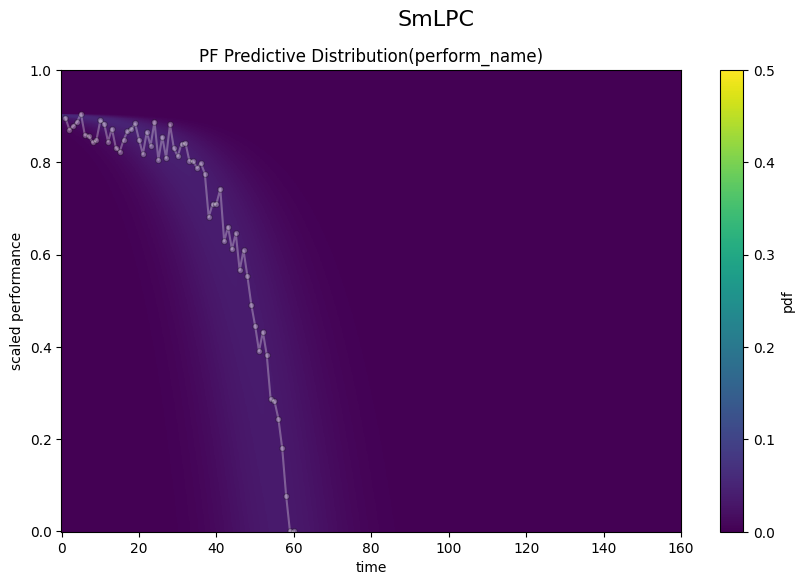

Epoch 1000, Best Loss: 0.997680127620697
Epoch 2000, Best Loss: 0.9887283444404602
Epoch 3000, Best Loss: 0.9856166243553162
Epoch 4000, Best Loss: 0.9823264479637146
Epoch 5000, Best Loss: 0.9790022373199463
Epoch 6000, Best Loss: 0.9761006832122803
Epoch 7000, Best Loss: 0.9737477898597717
Epoch 8000, Best Loss: 0.9717045426368713
Epoch 9000, Best Loss: 0.9696674942970276
Epoch 10000, Best Loss: 0.9675453901290894
Epoch 11000, Best Loss: 0.9653730392456055
Epoch 12000, Best Loss: 0.9631881713867188
Epoch 13000, Best Loss: 0.9610112905502319
Epoch 14000, Best Loss: 0.9588507413864136
Epoch 15000, Best Loss: 0.9567042589187622
Epoch 16000, Best Loss: 0.9545740485191345
Epoch 17000, Best Loss: 0.9524601697921753
Epoch 18000, Best Loss: 0.9503633975982666
Epoch 19000, Best Loss: 0.9482802748680115
Epoch 20000, Best Loss: 0.9462124705314636


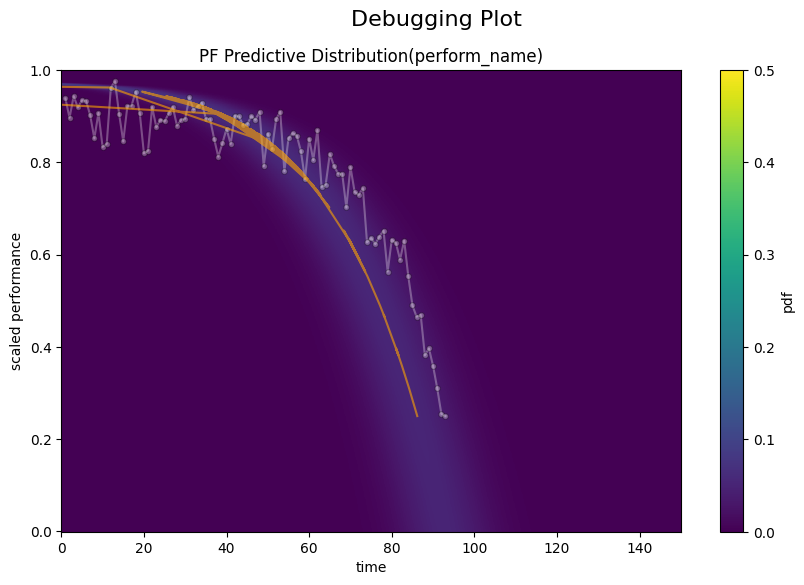

Epoch 21000, Best Loss: 0.9441651701927185
Epoch 22000, Best Loss: 0.9421268105506897
Epoch 23000, Best Loss: 0.9401029348373413
Epoch 24000, Best Loss: 0.9380988478660583
Epoch 25000, Best Loss: 0.9361071586608887
Epoch 26000, Best Loss: 0.9341275095939636
Epoch 27000, Best Loss: 0.9321606159210205
Epoch 28000, Best Loss: 0.9302054047584534
Epoch 29000, Best Loss: 0.9282615184783936
Epoch 30000, Best Loss: 0.9263284206390381
Epoch 31000, Best Loss: 0.9244082570075989
Epoch 32000, Best Loss: 0.9224982261657715
Epoch 33000, Best Loss: 0.92060786485672
Epoch 34000, Best Loss: 0.9187281131744385
Epoch 35000, Best Loss: 0.9168601036071777
Epoch 36000, Best Loss: 0.9150035381317139
Epoch 37000, Best Loss: 0.9131584167480469
Epoch 38000, Best Loss: 0.9113251566886902
Epoch 39000, Best Loss: 0.9094975590705872
Epoch 40000, Best Loss: 0.9076798558235168


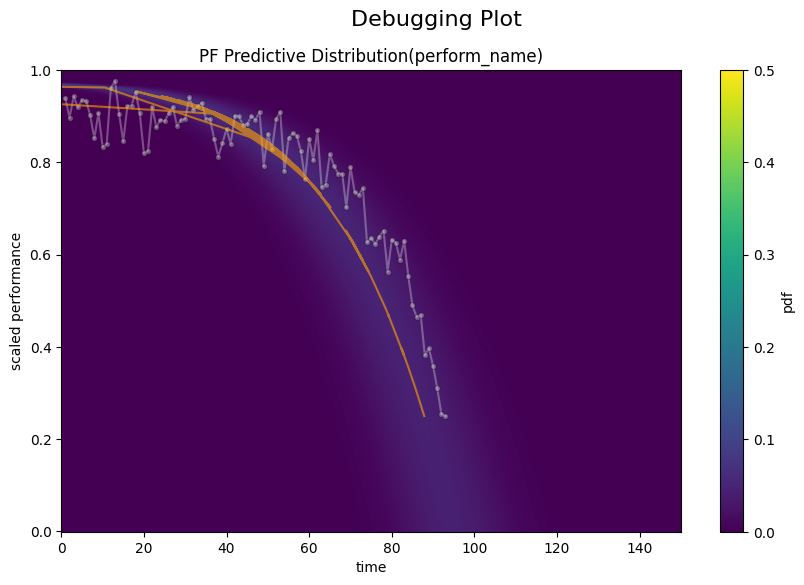

Epoch 41000, Best Loss: 0.9058748483657837
Epoch 42000, Best Loss: 0.9040808081626892
Epoch 43000, Best Loss: 0.9022998213768005
Epoch 44000, Best Loss: 0.9005303978919983
Epoch 45000, Best Loss: 0.8987735509872437
Epoch 46000, Best Loss: 0.8970298171043396
Epoch 47000, Best Loss: 0.8953049182891846
Epoch 48000, Best Loss: 0.8935941457748413
Epoch 49000, Best Loss: 0.8918960094451904
Epoch 50000, Best Loss: 0.8902117609977722
Epoch 51000, Best Loss: 0.8885413408279419
Epoch 52000, Best Loss: 0.8868855237960815
Epoch 53000, Best Loss: 0.8852432370185852
Epoch 54000, Best Loss: 0.8836159110069275
Epoch 55000, Best Loss: 0.8820041418075562
Epoch 56000, Best Loss: 0.8804072737693787
Epoch 57000, Best Loss: 0.8788264393806458
Epoch 58000, Best Loss: 0.8772612810134888
Epoch 59000, Best Loss: 0.8757162094116211
Epoch 60000, Best Loss: 0.8741908073425293


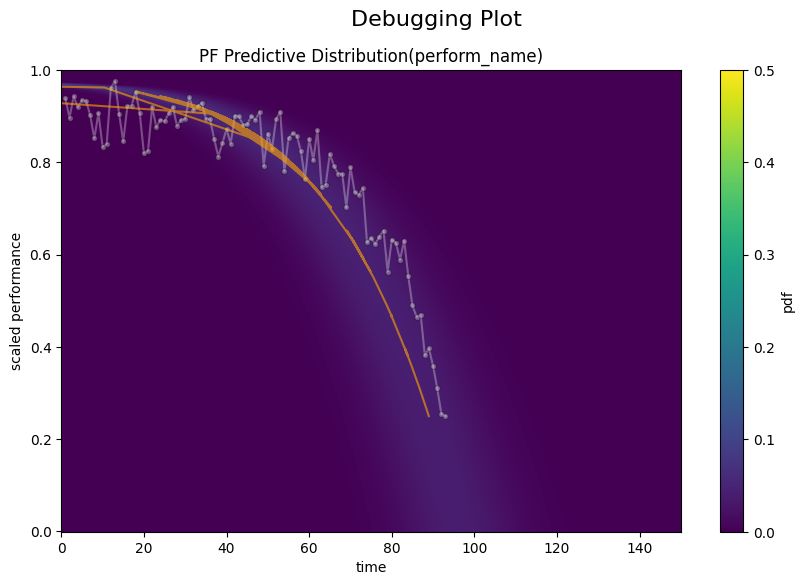

Epoch 61000, Best Loss: 0.8726826906204224
Epoch 62000, Best Loss: 0.8711921572685242
Epoch 63000, Best Loss: 0.8697190284729004
Epoch 64000, Best Loss: 0.8682643175125122
Epoch 65000, Best Loss: 0.8668287992477417
Epoch 66000, Best Loss: 0.8654122948646545
Epoch 67000, Best Loss: 0.8640182018280029
Epoch 68000, Best Loss: 0.8626471757888794
Epoch 69000, Best Loss: 0.8612962365150452
Epoch 70000, Best Loss: 0.8599671721458435
Epoch 71000, Best Loss: 0.858659029006958
Epoch 72000, Best Loss: 0.8573731780052185
Epoch 73000, Best Loss: 0.8561134934425354
Epoch 74000, Best Loss: 0.8548775911331177
Epoch 75000, Best Loss: 0.853665292263031
Epoch 76000, Best Loss: 0.8524765968322754
Epoch 77000, Best Loss: 0.8513157963752747
Epoch 78000, Best Loss: 0.8501801490783691
Epoch 79000, Best Loss: 0.8490703701972961
Epoch 80000, Best Loss: 0.8479892611503601


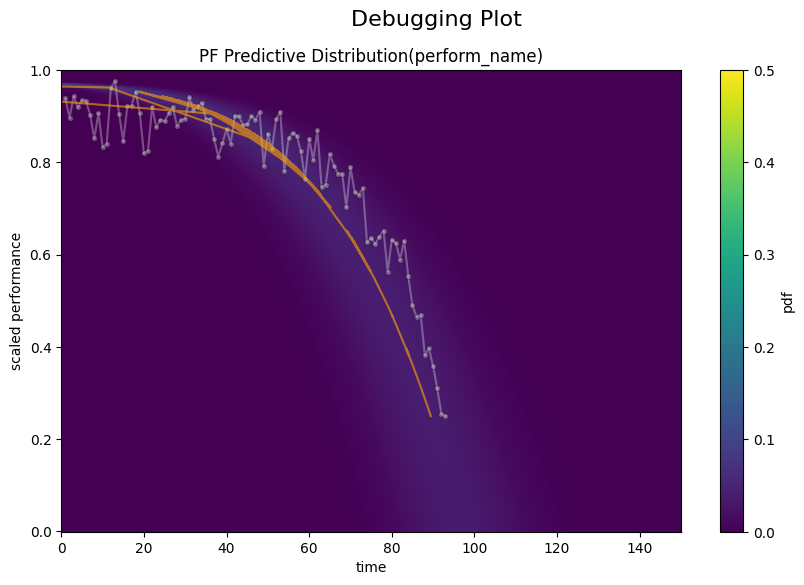

Epoch 81000, Best Loss: 0.8469346761703491
Epoch 82000, Best Loss: 0.8459087014198303
Epoch 83000, Best Loss: 0.8449109792709351
Epoch 84000, Best Loss: 0.8439428806304932
Epoch 85000, Best Loss: 0.8430038094520569
Epoch 86000, Best Loss: 0.842095136642456
Epoch 87000, Best Loss: 0.8412166237831116
Epoch 88000, Best Loss: 0.8403692841529846
Epoch 89000, Best Loss: 0.8395525813102722
Epoch 90000, Best Loss: 0.8387671709060669
Epoch 91000, Best Loss: 0.8380129933357239
Epoch 92000, Best Loss: 0.8372900485992432
Epoch 93000, Best Loss: 0.8365976810455322
Epoch 94000, Best Loss: 0.8359359502792358
Epoch 95000, Best Loss: 0.8353031277656555
Epoch 96000, Best Loss: 0.8346976637840271
Epoch 97000, Best Loss: 0.8341172933578491
Epoch 98000, Best Loss: 0.8335572481155396
Epoch 99000, Best Loss: 0.8330124616622925
Best value: 0.8324781656265259
Best parameters: {'p': 5.191437244415283, 'mu': 53.02997589111328, 'a': 0.9755434510384757, 'mean': 151.56314086914062, 'var': 143.49935913085938}


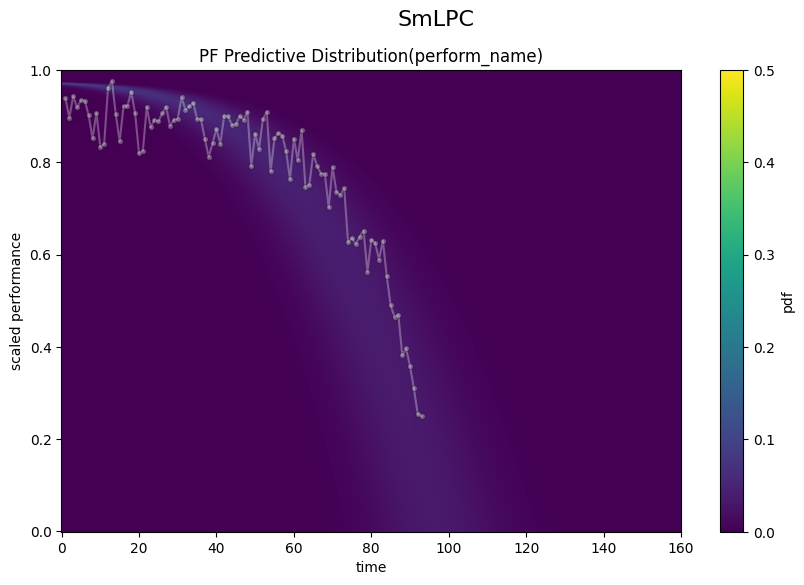

Epoch 1000, Best Loss: 1.6462821960449219
Epoch 2000, Best Loss: 1.5445314645767212
Epoch 3000, Best Loss: 1.470861792564392
Epoch 4000, Best Loss: 1.402477502822876
Epoch 5000, Best Loss: 1.3377196788787842
Epoch 6000, Best Loss: 1.2772371768951416
Epoch 7000, Best Loss: 1.221539855003357
Epoch 8000, Best Loss: 1.170667290687561
Epoch 9000, Best Loss: 1.124529242515564
Epoch 10000, Best Loss: 1.083138346672058
Epoch 11000, Best Loss: 1.0463100671768188
Epoch 12000, Best Loss: 1.0140584707260132
Epoch 13000, Best Loss: 0.9862843751907349
Epoch 14000, Best Loss: 0.9629523158073425
Epoch 15000, Best Loss: 0.9440222978591919
Epoch 16000, Best Loss: 0.9293992519378662
Epoch 17000, Best Loss: 0.9189058542251587
Epoch 18000, Best Loss: 0.9121155738830566
Epoch 19000, Best Loss: 0.908266544342041
Epoch 20000, Best Loss: 0.9063513875007629


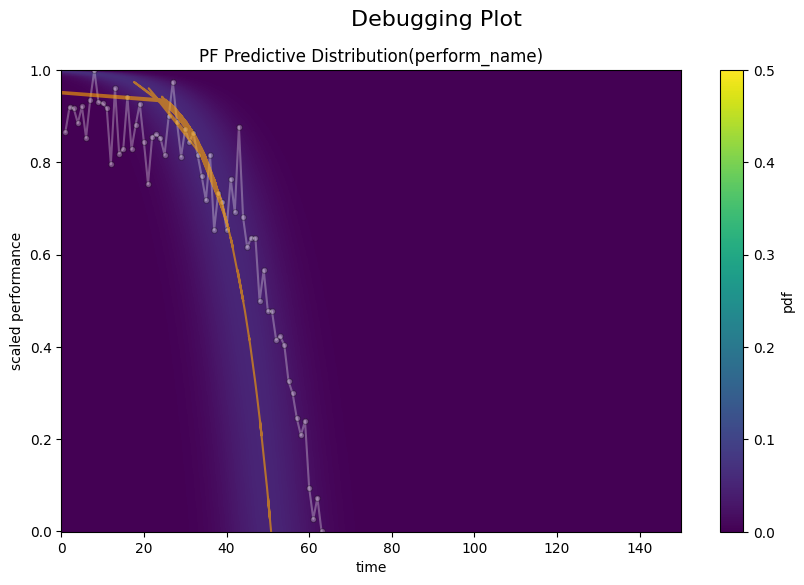

Epoch 21000, Best Loss: 0.9054334163665771
Epoch 22000, Best Loss: 0.9048957228660583
Epoch 23000, Best Loss: 0.9043970704078674
Epoch 24000, Best Loss: 0.9037968516349792
Epoch 25000, Best Loss: 0.9030741453170776
Epoch 26000, Best Loss: 0.9022521376609802
Epoch 27000, Best Loss: 0.9013726711273193
Epoch 28000, Best Loss: 0.9004618525505066
Epoch 29000, Best Loss: 0.8995340466499329
Epoch 30000, Best Loss: 0.8985937237739563
Epoch 31000, Best Loss: 0.8976410031318665
Epoch 32000, Best Loss: 0.8966770172119141
Epoch 33000, Best Loss: 0.8957013487815857
Epoch 34000, Best Loss: 0.8947134017944336
Epoch 35000, Best Loss: 0.8937131762504578
Epoch 36000, Best Loss: 0.8926997780799866
Epoch 37000, Best Loss: 0.891672670841217
Epoch 38000, Best Loss: 0.8906292915344238
Epoch 39000, Best Loss: 0.8895690441131592
Epoch 40000, Best Loss: 0.8884934186935425


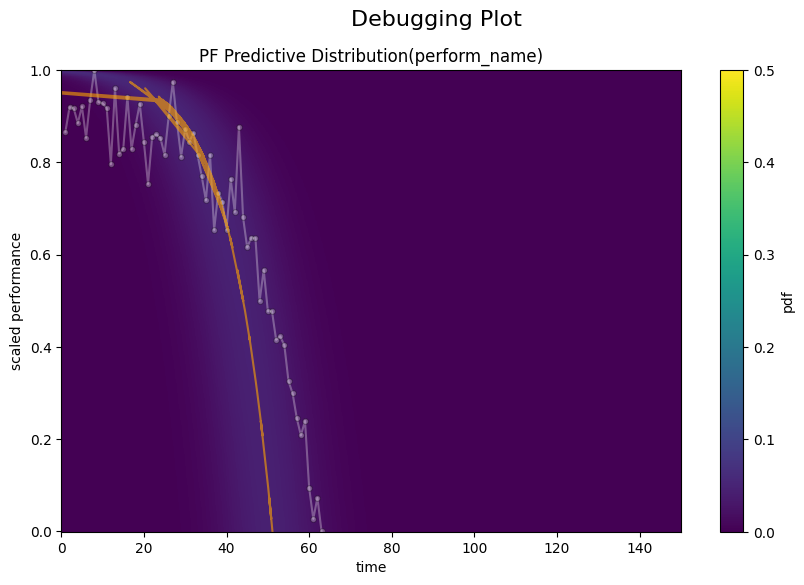

Epoch 41000, Best Loss: 0.8874104619026184
Epoch 42000, Best Loss: 0.8863141536712646
Epoch 43000, Best Loss: 0.8851981163024902
Epoch 44000, Best Loss: 0.8840655088424683
Epoch 45000, Best Loss: 0.8829138278961182
Epoch 46000, Best Loss: 0.8817452192306519
Epoch 47000, Best Loss: 0.8805572390556335
Epoch 48000, Best Loss: 0.8793478012084961
Epoch 49000, Best Loss: 0.878118097782135
Epoch 50000, Best Loss: 0.8768671154975891
Epoch 51000, Best Loss: 0.8755934834480286
Epoch 52000, Best Loss: 0.8742970824241638
Epoch 53000, Best Loss: 0.8729782104492188
Epoch 54000, Best Loss: 0.8716350197792053
Epoch 55000, Best Loss: 0.8702656626701355
Epoch 56000, Best Loss: 0.8688756227493286
Epoch 57000, Best Loss: 0.8674654960632324
Epoch 58000, Best Loss: 0.866029679775238
Epoch 59000, Best Loss: 0.8645671010017395
Epoch 60000, Best Loss: 0.8630784153938293


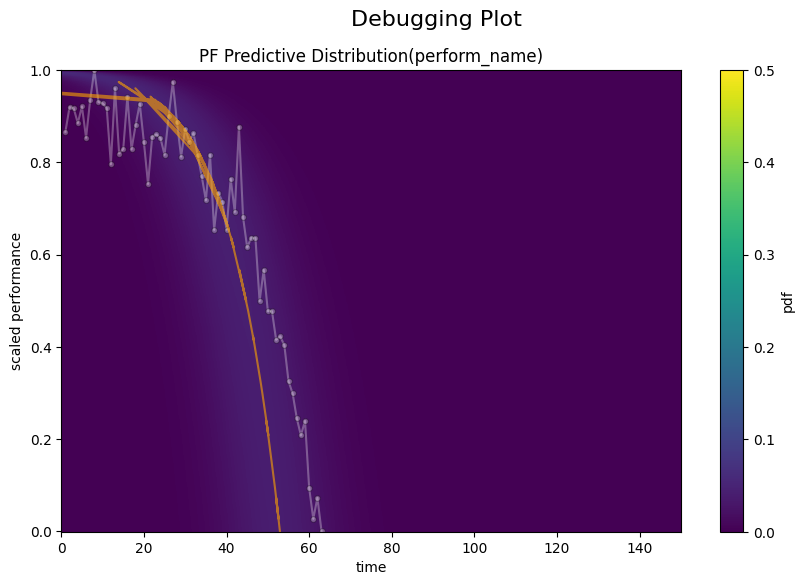

Epoch 61000, Best Loss: 0.8615619540214539
Epoch 62000, Best Loss: 0.8600214719772339
Epoch 63000, Best Loss: 0.8584598898887634
Epoch 64000, Best Loss: 0.856870174407959
Epoch 65000, Best Loss: 0.855251669883728
Epoch 66000, Best Loss: 0.853604793548584
Epoch 67000, Best Loss: 0.8519275784492493
Epoch 68000, Best Loss: 0.8502212762832642
Epoch 69000, Best Loss: 0.8484842777252197
Epoch 70000, Best Loss: 0.8467161059379578
Epoch 71000, Best Loss: 0.8449183702468872
Epoch 72000, Best Loss: 0.8430903553962708
Epoch 73000, Best Loss: 0.841231107711792
Epoch 74000, Best Loss: 0.8393411040306091
Epoch 75000, Best Loss: 0.837422251701355
Epoch 76000, Best Loss: 0.8354841470718384
Epoch 77000, Best Loss: 0.8335156440734863
Epoch 78000, Best Loss: 0.8315172791481018
Epoch 79000, Best Loss: 0.8294889330863953
Epoch 80000, Best Loss: 0.8274311423301697


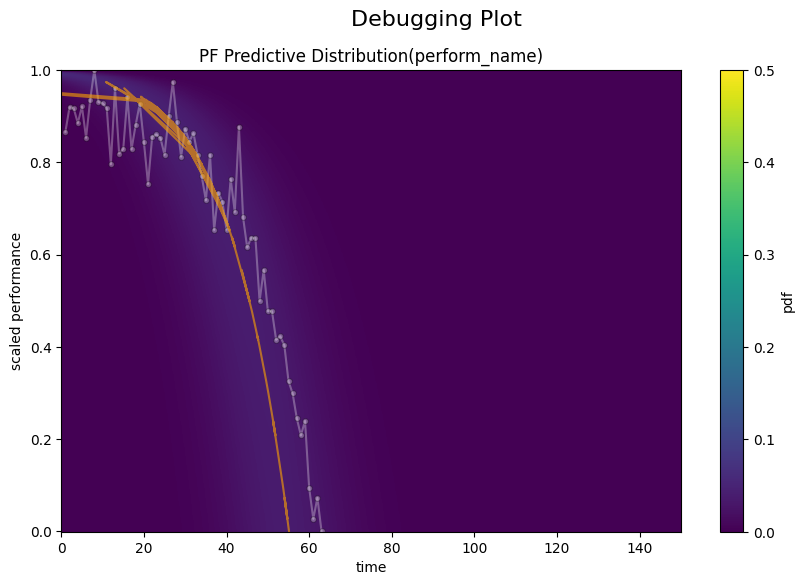

Epoch 81000, Best Loss: 0.825343132019043
Epoch 82000, Best Loss: 0.8232260346412659
Epoch 83000, Best Loss: 0.8210797905921936
Epoch 84000, Best Loss: 0.8189049363136292
Epoch 85000, Best Loss: 0.8167015314102173
Epoch 86000, Best Loss: 0.8144709467887878
Epoch 87000, Best Loss: 0.8122122287750244
Epoch 88000, Best Loss: 0.8099272847175598
Epoch 89000, Best Loss: 0.8076159358024597
Epoch 90000, Best Loss: 0.8052791357040405
Epoch 91000, Best Loss: 0.8029171228408813
Epoch 92000, Best Loss: 0.8005445003509521
Epoch 93000, Best Loss: 0.7981514930725098
Epoch 94000, Best Loss: 0.7957356572151184
Epoch 95000, Best Loss: 0.7932987213134766
Epoch 96000, Best Loss: 0.7908408641815186
Epoch 97000, Best Loss: 0.7883628010749817
Epoch 98000, Best Loss: 0.7858657836914062
Epoch 99000, Best Loss: 0.7833510041236877
Best value: 0.7808210253715515
Best parameters: {'p': 8.55453872680664, 'mu': 82.84915161132812, 'a': 1.0000000000853442, 'mean': 139.9371337890625, 'var': 141.42784118652344}


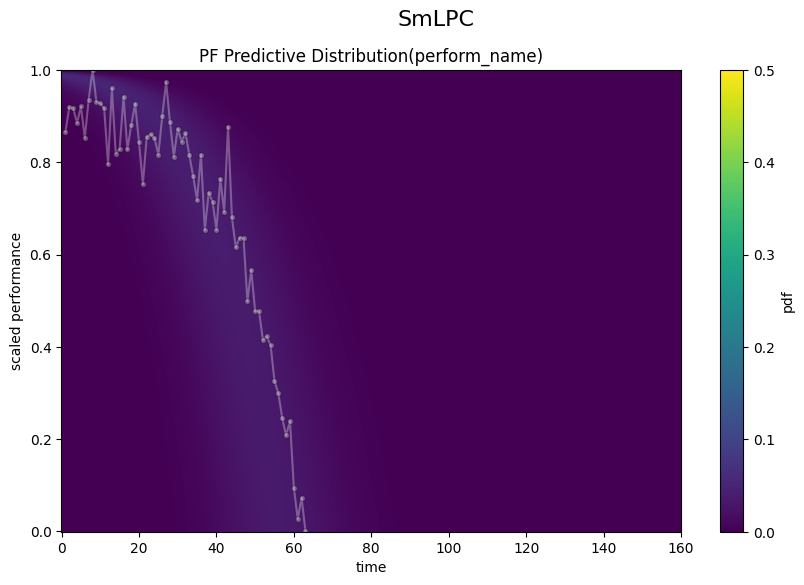

Epoch 1000, Best Loss: 1.0846596956253052
Epoch 2000, Best Loss: 1.0357855558395386
Epoch 3000, Best Loss: 0.9929337501525879
Epoch 4000, Best Loss: 0.9584904909133911
Epoch 5000, Best Loss: 0.9286430478096008
Epoch 6000, Best Loss: 0.9028842449188232
Epoch 7000, Best Loss: 0.8796827793121338
Epoch 8000, Best Loss: 0.8563052415847778
Epoch 9000, Best Loss: 0.8293849229812622
Epoch 10000, Best Loss: 0.7943283319473267
Epoch 11000, Best Loss: 0.7462086081504822
Epoch 12000, Best Loss: 0.690386176109314
Epoch 13000, Best Loss: 0.6416707038879395
Epoch 14000, Best Loss: 0.6112619042396545
Epoch 15000, Best Loss: 0.599516749382019
Epoch 16000, Best Loss: 0.5974714756011963
Epoch 17000, Best Loss: 0.5972721576690674
Epoch 18000, Best Loss: 0.5971590876579285
Epoch 19000, Best Loss: 0.5970458984375
Epoch 20000, Best Loss: 0.5969326496124268


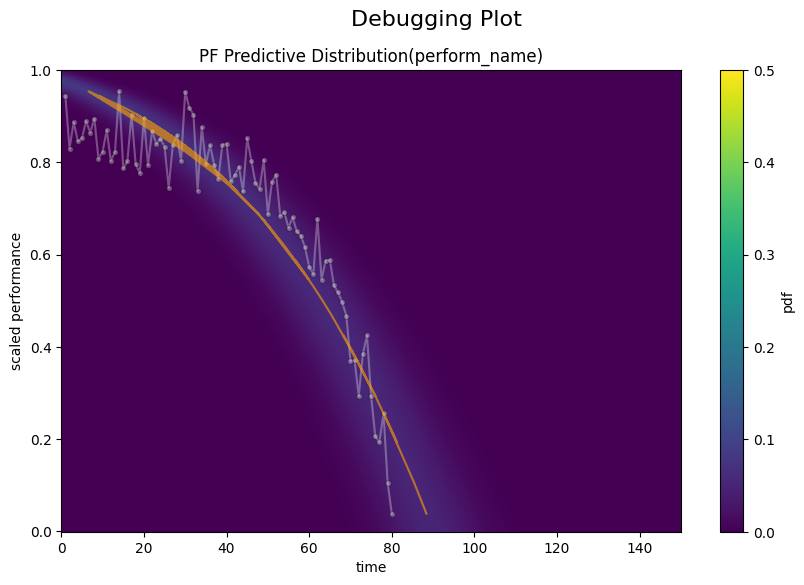

Epoch 21000, Best Loss: 0.5968154668807983
Epoch 22000, Best Loss: 0.5966953635215759
Epoch 23000, Best Loss: 0.5965712070465088
Epoch 24000, Best Loss: 0.5964457988739014
Epoch 25000, Best Loss: 0.5963206887245178
Epoch 26000, Best Loss: 0.5961986184120178
Epoch 27000, Best Loss: 0.5960801243782043
Epoch 28000, Best Loss: 0.5959658026695251
Epoch 29000, Best Loss: 0.5958552956581116
Epoch 30000, Best Loss: 0.5957486629486084
Epoch 31000, Best Loss: 0.5956438779830933
Epoch 32000, Best Loss: 0.5955439805984497
Epoch 33000, Best Loss: 0.5954472422599792
Epoch 34000, Best Loss: 0.5953529477119446
Epoch 35000, Best Loss: 0.5952612161636353
Epoch 36000, Best Loss: 0.5951730608940125
Epoch 37000, Best Loss: 0.5950872898101807
Epoch 38000, Best Loss: 0.5950036644935608
Epoch 39000, Best Loss: 0.5949230790138245
Epoch 40000, Best Loss: 0.594845712184906


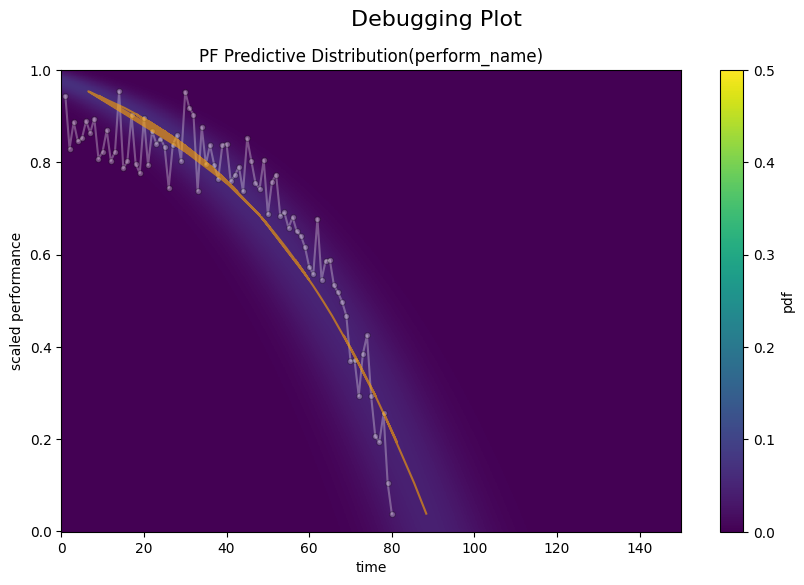

Epoch 41000, Best Loss: 0.5947684645652771
Epoch 42000, Best Loss: 0.5946947336196899
Epoch 43000, Best Loss: 0.5946241617202759
Epoch 44000, Best Loss: 0.5945538282394409
Epoch 45000, Best Loss: 0.5944864749908447
Epoch 46000, Best Loss: 0.5944214463233948
Epoch 47000, Best Loss: 0.5943569540977478
Epoch 48000, Best Loss: 0.5942948460578918
Epoch 49000, Best Loss: 0.5942341089248657
Epoch 50000, Best Loss: 0.5941758751869202
Epoch 51000, Best Loss: 0.594119131565094
Epoch 52000, Best Loss: 0.5940631031990051
Epoch 53000, Best Loss: 0.5940093994140625
Epoch 54000, Best Loss: 0.5939571261405945
Epoch 55000, Best Loss: 0.5939061045646667
Epoch 56000, Best Loss: 0.5938563346862793
Epoch 57000, Best Loss: 0.5938078761100769
Epoch 58000, Best Loss: 0.5937607884407043
Epoch 59000, Best Loss: 0.5937145948410034
Epoch 60000, Best Loss: 0.5936700105667114


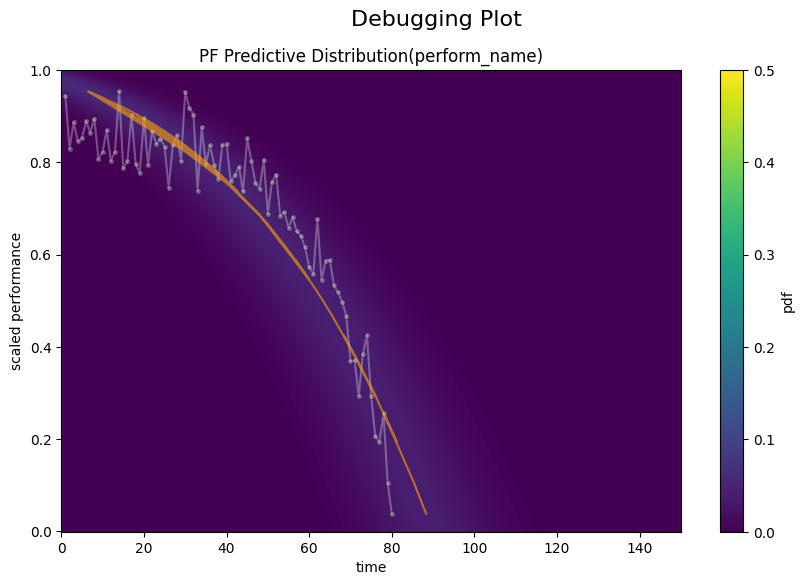

Epoch 61000, Best Loss: 0.5936258435249329
Epoch 62000, Best Loss: 0.5935832858085632
Epoch 63000, Best Loss: 0.5935419201850891
Epoch 64000, Best Loss: 0.5935013890266418
Epoch 65000, Best Loss: 0.5934622287750244
Epoch 66000, Best Loss: 0.5934234857559204
Epoch 67000, Best Loss: 0.5933864116668701
Epoch 68000, Best Loss: 0.593349814414978
Epoch 69000, Best Loss: 0.5933138132095337
Epoch 70000, Best Loss: 0.5932790040969849
Epoch 71000, Best Loss: 0.5932453274726868
Epoch 72000, Best Loss: 0.5932120680809021
Epoch 73000, Best Loss: 0.5931798815727234
Epoch 74000, Best Loss: 0.5931482911109924
Epoch 75000, Best Loss: 0.5931176543235779
Epoch 76000, Best Loss: 0.593087911605835
Epoch 77000, Best Loss: 0.5930584669113159
Epoch 78000, Best Loss: 0.5930301547050476
Epoch 79000, Best Loss: 0.5930021405220032
Epoch 80000, Best Loss: 0.5929749608039856


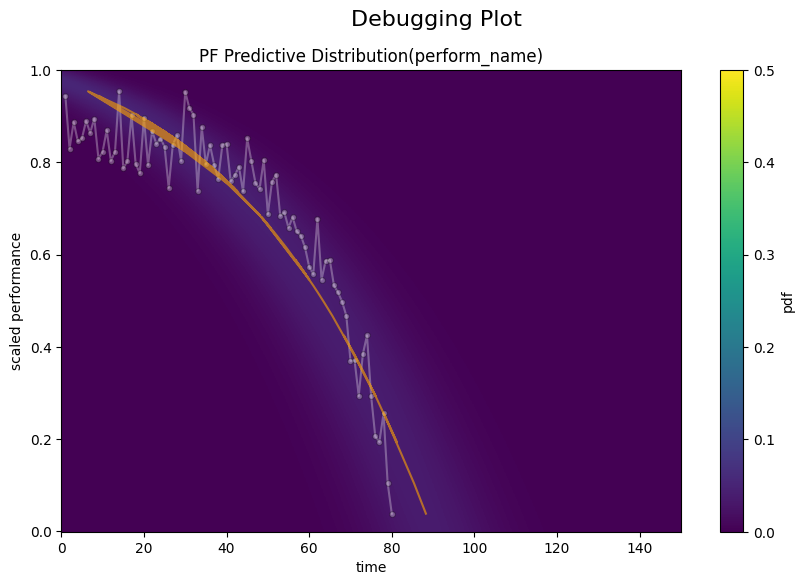

Epoch 81000, Best Loss: 0.5929484367370605
Epoch 82000, Best Loss: 0.5929225087165833
Epoch 83000, Best Loss: 0.5928975343704224
Epoch 84000, Best Loss: 0.5928723216056824
Epoch 85000, Best Loss: 0.5928484201431274
Epoch 86000, Best Loss: 0.5928248763084412
Epoch 87000, Best Loss: 0.5928018689155579
Epoch 88000, Best Loss: 0.5927796363830566
Epoch 89000, Best Loss: 0.5927572250366211
Epoch 90000, Best Loss: 0.5927358269691467
Epoch 91000, Best Loss: 0.5927150249481201
Epoch 92000, Best Loss: 0.5926944017410278
Epoch 93000, Best Loss: 0.5926745533943176
Epoch 94000, Best Loss: 0.5926548838615417
Epoch 95000, Best Loss: 0.5926355719566345
Epoch 96000, Best Loss: 0.5926172137260437
Epoch 97000, Best Loss: 0.5925989747047424
Epoch 98000, Best Loss: 0.592581033706665
Epoch 99000, Best Loss: 0.5925636291503906
Best value: 0.5925465822219849
Best parameters: {'p': 7.0260701179504395, 'mu': 219.1493377685547, 'a': 1.0711917710001724, 'mean': 305.9794616699219, 'var': 137.7244415283203}


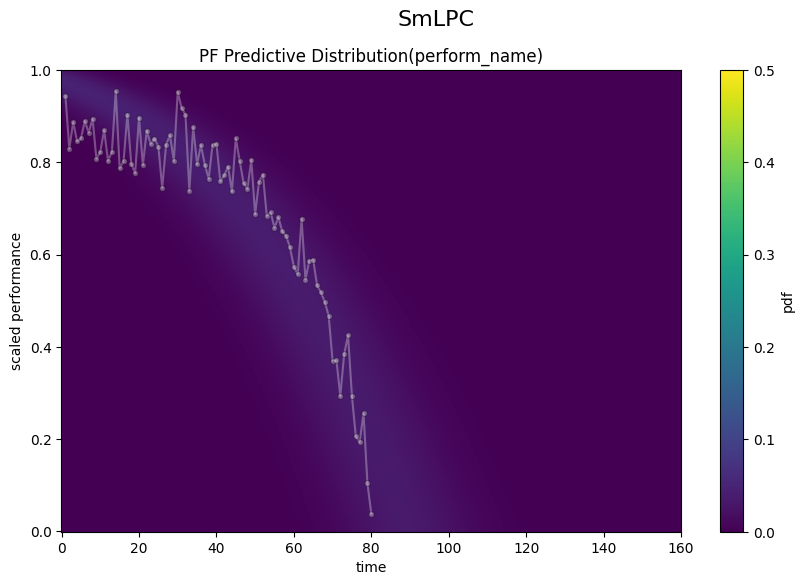

Epoch 1000, Best Loss: 1.8733174800872803
Epoch 2000, Best Loss: 1.6134471893310547
Epoch 3000, Best Loss: 1.5090028047561646
Epoch 4000, Best Loss: 1.4135324954986572
Epoch 5000, Best Loss: 1.3315742015838623
Epoch 6000, Best Loss: 1.2570850849151611
Epoch 7000, Best Loss: 1.1894023418426514
Epoch 8000, Best Loss: 1.1290055513381958
Epoch 9000, Best Loss: 1.0756564140319824
Epoch 10000, Best Loss: 1.0283119678497314
Epoch 11000, Best Loss: 0.9845607876777649
Epoch 12000, Best Loss: 0.9395565986633301
Epoch 13000, Best Loss: 0.8916735649108887
Epoch 14000, Best Loss: 0.8523004055023193
Epoch 15000, Best Loss: 0.825192391872406
Epoch 16000, Best Loss: 0.804345428943634
Epoch 17000, Best Loss: 0.7859637141227722
Epoch 18000, Best Loss: 0.767620861530304
Epoch 19000, Best Loss: 0.7411684989929199
Epoch 20000, Best Loss: 0.6865866780281067


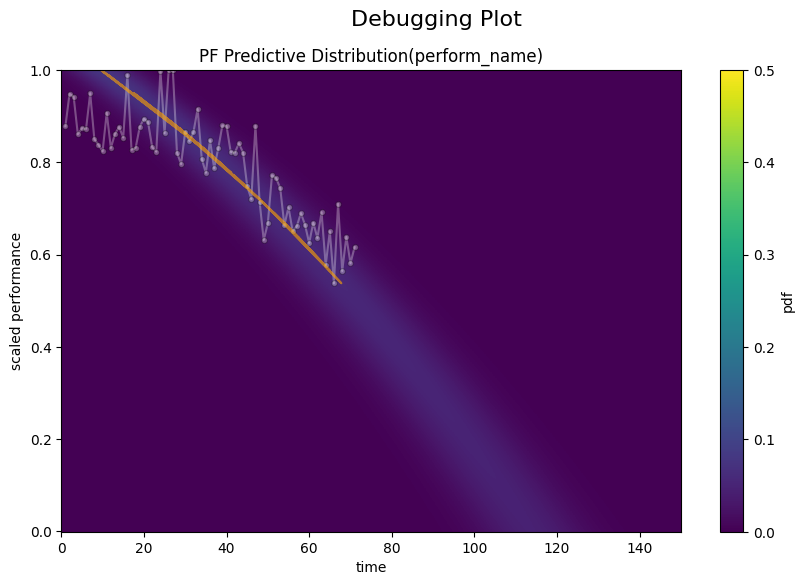

Epoch 21000, Best Loss: 0.6674931645393372
Epoch 22000, Best Loss: 0.6672287583351135
Epoch 23000, Best Loss: 0.6669131517410278
Epoch 24000, Best Loss: 0.6665182709693909
Epoch 25000, Best Loss: 0.6660488843917847
Epoch 26000, Best Loss: 0.6655306816101074
Epoch 27000, Best Loss: 0.6650005578994751
Epoch 28000, Best Loss: 0.6644832491874695
Epoch 29000, Best Loss: 0.6639949679374695
Epoch 30000, Best Loss: 0.6635360717773438
Epoch 31000, Best Loss: 0.6631080508232117
Epoch 32000, Best Loss: 0.6627064943313599
Epoch 33000, Best Loss: 0.662333071231842
Epoch 34000, Best Loss: 0.6619837284088135
Epoch 35000, Best Loss: 0.6616567969322205
Epoch 36000, Best Loss: 0.6613513231277466
Epoch 37000, Best Loss: 0.6610656976699829
Epoch 38000, Best Loss: 0.6607962250709534
Epoch 39000, Best Loss: 0.6605446338653564
Epoch 40000, Best Loss: 0.6603072881698608


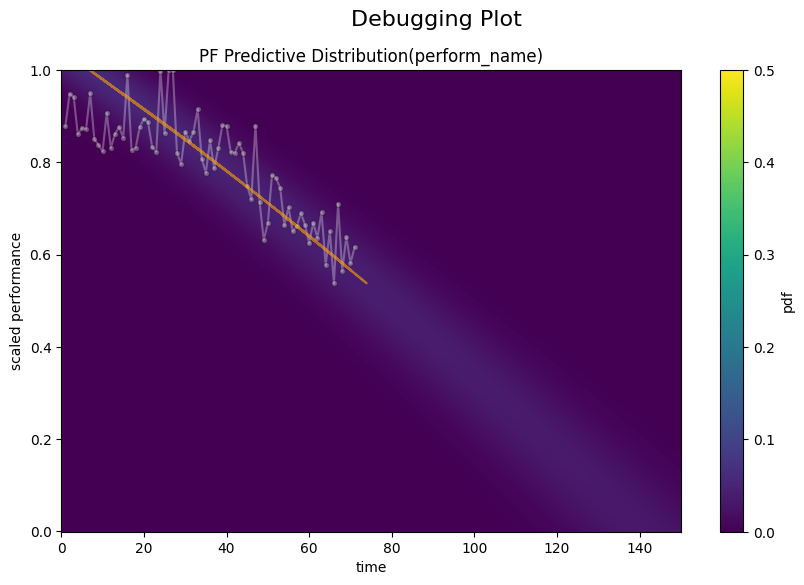

Epoch 41000, Best Loss: 0.6600853800773621
Epoch 42000, Best Loss: 0.6598768830299377
Epoch 43000, Best Loss: 0.6596807837486267
Epoch 44000, Best Loss: 0.6594974994659424
Epoch 45000, Best Loss: 0.6593256592750549
Epoch 46000, Best Loss: 0.6591641902923584
Epoch 47000, Best Loss: 0.6590135097503662
Epoch 48000, Best Loss: 0.6588718295097351
Epoch 49000, Best Loss: 0.6587400436401367
Epoch 50000, Best Loss: 0.6586166024208069
Epoch 51000, Best Loss: 0.6585013270378113
Epoch 52000, Best Loss: 0.6583939790725708
Epoch 53000, Best Loss: 0.6582940220832825
Epoch 54000, Best Loss: 0.6582008600234985
Epoch 55000, Best Loss: 0.6581143736839294
Epoch 56000, Best Loss: 0.6580344438552856
Epoch 57000, Best Loss: 0.657960832118988
Epoch 58000, Best Loss: 0.657892644405365
Epoch 59000, Best Loss: 0.6578301787376404
Epoch 60000, Best Loss: 0.6577726006507874


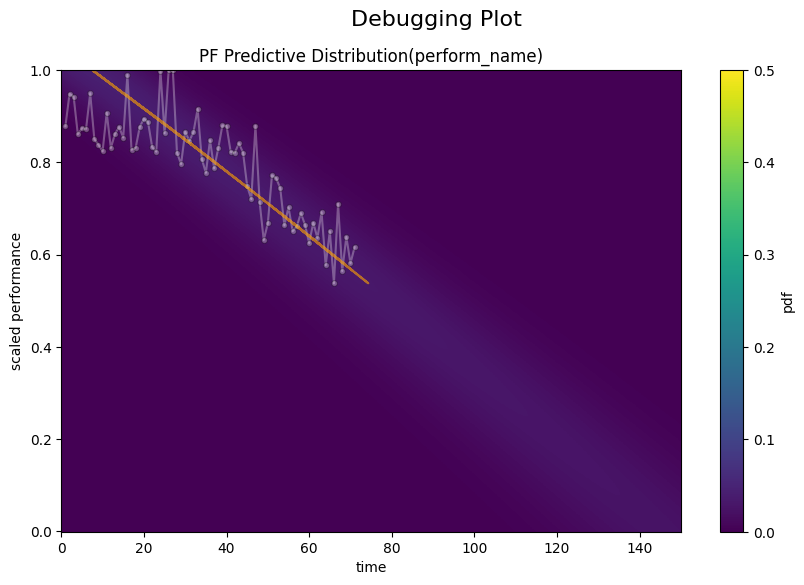

Epoch 61000, Best Loss: 0.6577196717262268
Epoch 62000, Best Loss: 0.6576709151268005
Epoch 63000, Best Loss: 0.6576256155967712
Epoch 64000, Best Loss: 0.6575824022293091
Epoch 65000, Best Loss: 0.6575411558151245
Epoch 66000, Best Loss: 0.6575016975402832
Epoch 67000, Best Loss: 0.6574633121490479
Epoch 68000, Best Loss: 0.6574271321296692
Epoch 69000, Best Loss: 0.6573920249938965
Epoch 70000, Best Loss: 0.6573585271835327
Epoch 71000, Best Loss: 0.6573261618614197
Epoch 72000, Best Loss: 0.657295286655426
Epoch 73000, Best Loss: 0.6572655439376831
Epoch 74000, Best Loss: 0.6572364568710327
Epoch 75000, Best Loss: 0.6572086215019226
Epoch 76000, Best Loss: 0.6571822166442871
Epoch 77000, Best Loss: 0.6571564674377441
Epoch 78000, Best Loss: 0.657131552696228
Epoch 79000, Best Loss: 0.6571075916290283
Epoch 80000, Best Loss: 0.6570843458175659


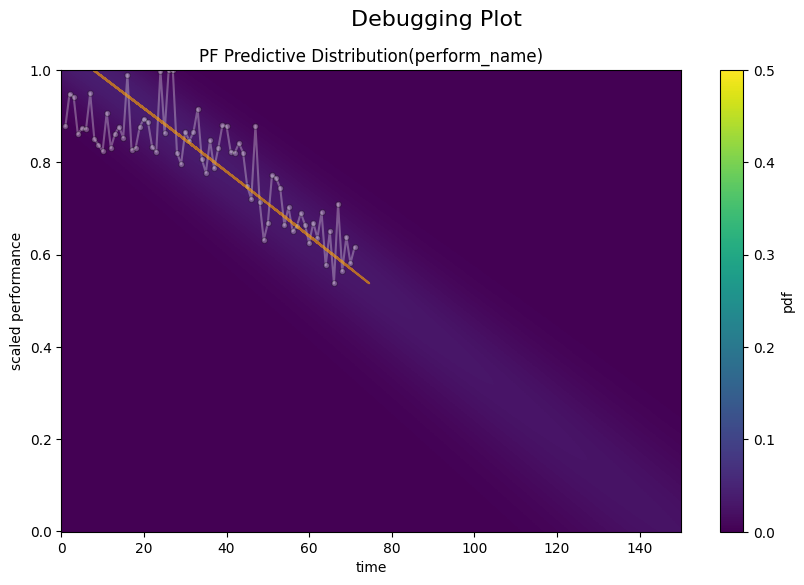

Epoch 81000, Best Loss: 0.657061755657196
Epoch 82000, Best Loss: 0.6570396423339844
Epoch 83000, Best Loss: 0.6570183038711548
Epoch 84000, Best Loss: 0.6569976210594177
Epoch 85000, Best Loss: 0.6569774150848389
Epoch 86000, Best Loss: 0.6569578051567078
Epoch 87000, Best Loss: 0.6569392085075378
Epoch 88000, Best Loss: 0.6569206714630127
Epoch 89000, Best Loss: 0.656902551651001
Epoch 90000, Best Loss: 0.6568854451179504
Epoch 91000, Best Loss: 0.656868577003479
Epoch 92000, Best Loss: 0.6568518280982971
Epoch 93000, Best Loss: 0.6568360328674316
Epoch 94000, Best Loss: 0.6568198204040527
Epoch 95000, Best Loss: 0.6568050384521484
Epoch 96000, Best Loss: 0.6567898988723755
Epoch 97000, Best Loss: 0.6567755341529846
Epoch 98000, Best Loss: 0.6567615270614624
Epoch 99000, Best Loss: 0.6567476987838745
Best value: 0.6567342281341553
Best parameters: {'p': 1.1131494045257568, 'mu': 194.17164611816406, 'a': 2.2360002127913536, 'mean': 167.05203247070312, 'var': 63.11947250366211}


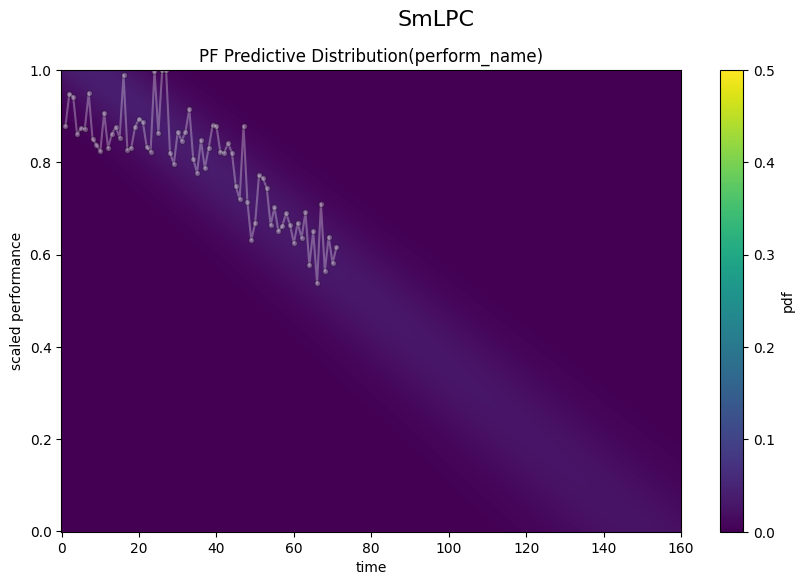

Epoch 1000, Best Loss: 0.939582109451294
Epoch 2000, Best Loss: 0.9323578476905823
Epoch 3000, Best Loss: 0.927070677280426
Epoch 4000, Best Loss: 0.923182487487793
Epoch 5000, Best Loss: 0.9205135703086853
Epoch 6000, Best Loss: 0.918632984161377
Epoch 7000, Best Loss: 0.9170201420783997
Epoch 8000, Best Loss: 0.9153335094451904
Epoch 9000, Best Loss: 0.913540244102478
Epoch 10000, Best Loss: 0.9116958379745483
Epoch 11000, Best Loss: 0.9098413586616516
Epoch 12000, Best Loss: 0.9079873561859131
Epoch 13000, Best Loss: 0.9061387777328491
Epoch 14000, Best Loss: 0.904300332069397
Epoch 15000, Best Loss: 0.9024671912193298
Epoch 16000, Best Loss: 0.9006372094154358
Epoch 17000, Best Loss: 0.8988108038902283
Epoch 18000, Best Loss: 0.8969890475273132
Epoch 19000, Best Loss: 0.8951762914657593
Epoch 20000, Best Loss: 0.893363893032074


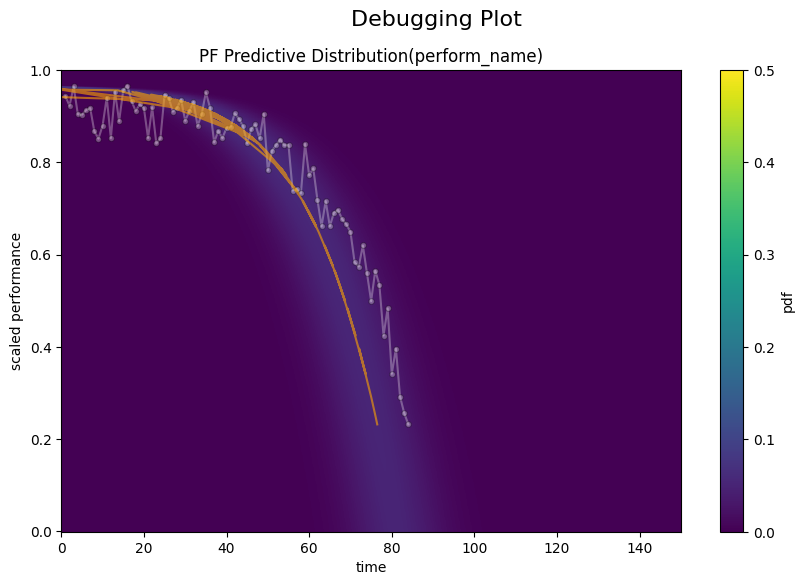

Epoch 21000, Best Loss: 0.8915536403656006
Epoch 22000, Best Loss: 0.8897469639778137
Epoch 23000, Best Loss: 0.8879405856132507
Epoch 24000, Best Loss: 0.8861329555511475
Epoch 25000, Best Loss: 0.8843306303024292
Epoch 26000, Best Loss: 0.8825281858444214
Epoch 27000, Best Loss: 0.8807255029678345
Epoch 28000, Best Loss: 0.8789294958114624
Epoch 29000, Best Loss: 0.8771304488182068
Epoch 30000, Best Loss: 0.8753284215927124
Epoch 31000, Best Loss: 0.8735244870185852
Epoch 32000, Best Loss: 0.8717196583747864
Epoch 33000, Best Loss: 0.8699173331260681
Epoch 34000, Best Loss: 0.8681145310401917
Epoch 35000, Best Loss: 0.8663074374198914
Epoch 36000, Best Loss: 0.8644984364509583
Epoch 37000, Best Loss: 0.8626861572265625
Epoch 38000, Best Loss: 0.8608794212341309
Epoch 39000, Best Loss: 0.8590683937072754
Epoch 40000, Best Loss: 0.8572500348091125


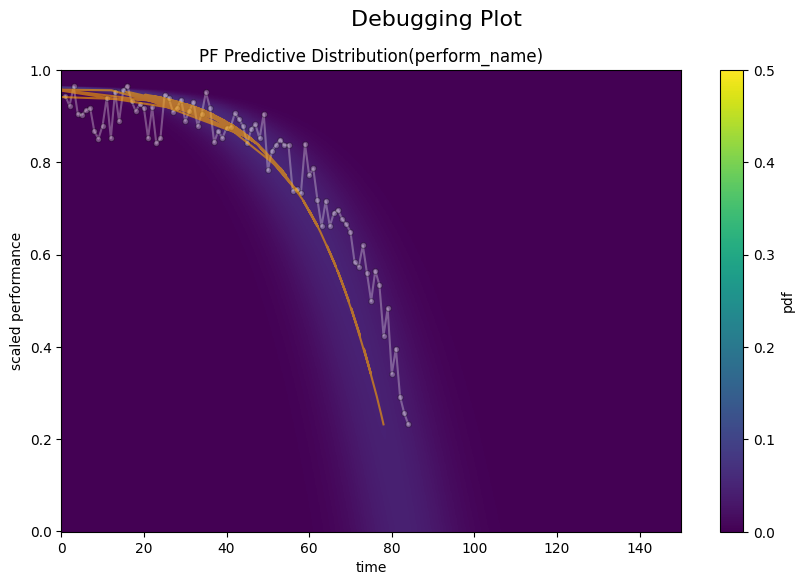

Epoch 41000, Best Loss: 0.8554284572601318
Epoch 42000, Best Loss: 0.8536041975021362
Epoch 43000, Best Loss: 0.8517774939537048
Epoch 44000, Best Loss: 0.8499463200569153
Epoch 45000, Best Loss: 0.8481121063232422
Epoch 46000, Best Loss: 0.846280038356781
Epoch 47000, Best Loss: 0.8444507122039795
Epoch 48000, Best Loss: 0.8426176905632019
Epoch 49000, Best Loss: 0.8407827615737915
Epoch 50000, Best Loss: 0.8389449119567871
Epoch 51000, Best Loss: 0.8371058106422424
Epoch 52000, Best Loss: 0.8352634906768799
Epoch 53000, Best Loss: 0.8334202766418457
Epoch 54000, Best Loss: 0.8315752744674683
Epoch 55000, Best Loss: 0.8297297954559326
Epoch 56000, Best Loss: 0.8278824687004089
Epoch 57000, Best Loss: 0.8260349035263062
Epoch 58000, Best Loss: 0.8241877555847168
Epoch 59000, Best Loss: 0.8223435878753662
Epoch 60000, Best Loss: 0.8205076456069946


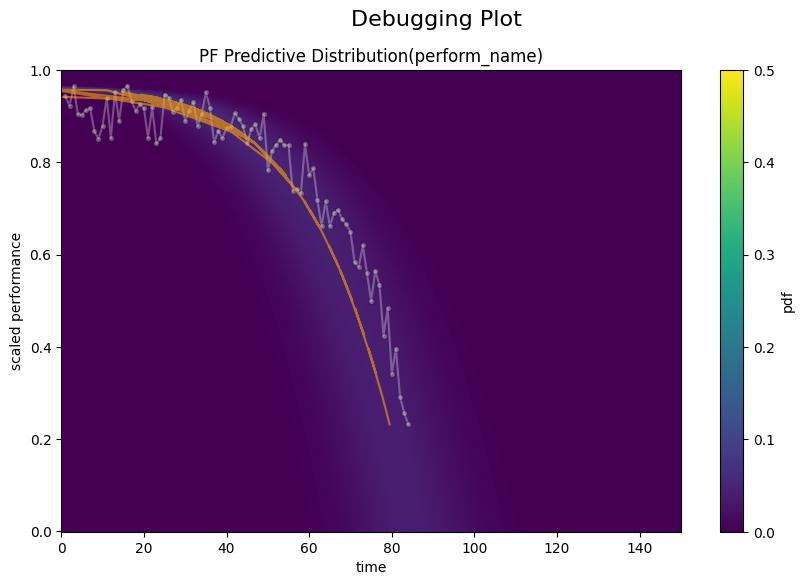

Epoch 61000, Best Loss: 0.818672239780426
Epoch 62000, Best Loss: 0.8168376088142395
Epoch 63000, Best Loss: 0.8150054812431335
Epoch 64000, Best Loss: 0.8131757378578186
Epoch 65000, Best Loss: 0.8113479614257812
Epoch 66000, Best Loss: 0.8095238208770752
Epoch 67000, Best Loss: 0.8077001571655273
Epoch 68000, Best Loss: 0.8058808445930481
Epoch 69000, Best Loss: 0.8040663003921509
Epoch 70000, Best Loss: 0.8022571206092834
Epoch 71000, Best Loss: 0.8004538416862488
Epoch 72000, Best Loss: 0.7986574769020081
Epoch 73000, Best Loss: 0.7968676686286926
Epoch 74000, Best Loss: 0.795090913772583
Epoch 75000, Best Loss: 0.7933285236358643
Epoch 76000, Best Loss: 0.7915754318237305
Epoch 77000, Best Loss: 0.789832353591919
Epoch 78000, Best Loss: 0.7881002426147461
Epoch 79000, Best Loss: 0.7863796949386597
Epoch 80000, Best Loss: 0.7846711874008179


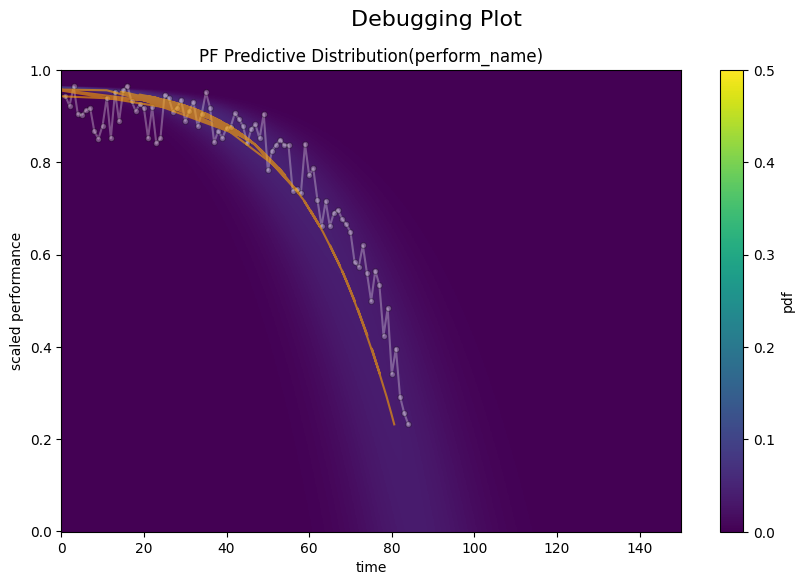

Epoch 81000, Best Loss: 0.7829762101173401
Epoch 82000, Best Loss: 0.7812952995300293
Epoch 83000, Best Loss: 0.7796289920806885
Epoch 84000, Best Loss: 0.7779807448387146
Epoch 85000, Best Loss: 0.7763571739196777
Epoch 86000, Best Loss: 0.7747535705566406
Epoch 87000, Best Loss: 0.7731689214706421
Epoch 88000, Best Loss: 0.7716035842895508
Epoch 89000, Best Loss: 0.7700590491294861
Epoch 90000, Best Loss: 0.7685403823852539
Epoch 91000, Best Loss: 0.7670442461967468
Epoch 92000, Best Loss: 0.7655729651451111
Epoch 93000, Best Loss: 0.7641293406486511
Epoch 94000, Best Loss: 0.7627115845680237
Epoch 95000, Best Loss: 0.7613207697868347
Epoch 96000, Best Loss: 0.7599563002586365
Epoch 97000, Best Loss: 0.7586238980293274
Epoch 98000, Best Loss: 0.7573238015174866
Epoch 99000, Best Loss: 0.7560569047927856
Best value: 0.7548270225524902
Best parameters: {'p': 5.7567572593688965, 'mu': 50.548831939697266, 'a': 0.9661767865239954, 'mean': 138.9530029296875, 'var': 143.11260986328125}


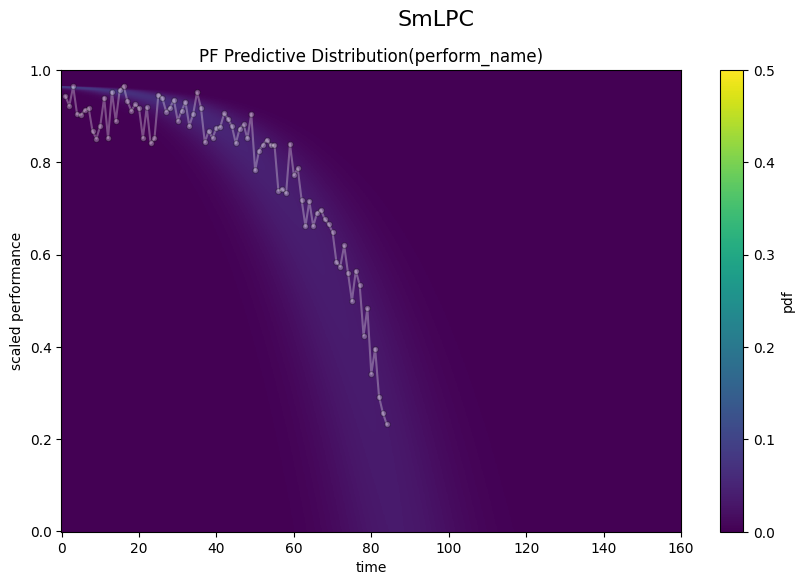

Epoch 1000, Best Loss: 1.0002135038375854
Epoch 2000, Best Loss: 0.8857481479644775
Epoch 3000, Best Loss: 0.834150493144989
Epoch 4000, Best Loss: 0.7931662797927856
Epoch 5000, Best Loss: 0.7591705322265625
Epoch 6000, Best Loss: 0.730315089225769
Epoch 7000, Best Loss: 0.7053176164627075
Epoch 8000, Best Loss: 0.6816729307174683
Epoch 9000, Best Loss: 0.6542589664459229
Epoch 10000, Best Loss: 0.6194347739219666
Epoch 11000, Best Loss: 0.580025315284729
Epoch 12000, Best Loss: 0.5466741323471069
Epoch 13000, Best Loss: 0.5299878716468811
Epoch 14000, Best Loss: 0.525836706161499
Epoch 15000, Best Loss: 0.525330662727356
Epoch 16000, Best Loss: 0.5252479910850525
Epoch 17000, Best Loss: 0.5251778364181519
Epoch 18000, Best Loss: 0.5251075029373169
Epoch 19000, Best Loss: 0.5250356197357178
Epoch 20000, Best Loss: 0.5249602198600769


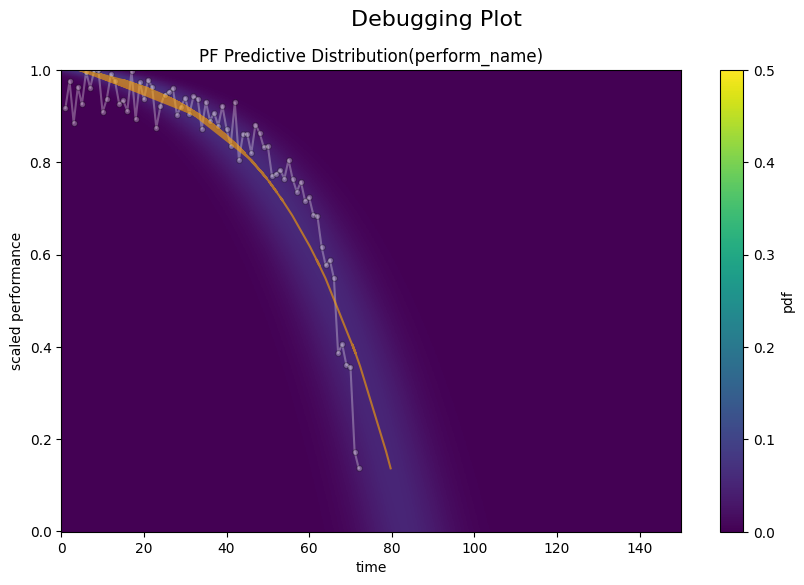

Epoch 21000, Best Loss: 0.5248783826828003
Epoch 22000, Best Loss: 0.5247915983200073
Epoch 23000, Best Loss: 0.5247008800506592
Epoch 24000, Best Loss: 0.5246090292930603
Epoch 25000, Best Loss: 0.5245194435119629
Epoch 26000, Best Loss: 0.5244309306144714
Epoch 27000, Best Loss: 0.5243461728096008
Epoch 28000, Best Loss: 0.5242642164230347
Epoch 29000, Best Loss: 0.5241844058036804
Epoch 30000, Best Loss: 0.5241064429283142
Epoch 31000, Best Loss: 0.524032473564148
Epoch 32000, Best Loss: 0.5239601135253906
Epoch 33000, Best Loss: 0.5238894820213318
Epoch 34000, Best Loss: 0.5238217711448669
Epoch 35000, Best Loss: 0.5237561464309692
Epoch 36000, Best Loss: 0.5236915349960327
Epoch 37000, Best Loss: 0.5236300826072693
Epoch 38000, Best Loss: 0.5235700607299805
Epoch 39000, Best Loss: 0.5235111713409424
Epoch 40000, Best Loss: 0.5234543681144714


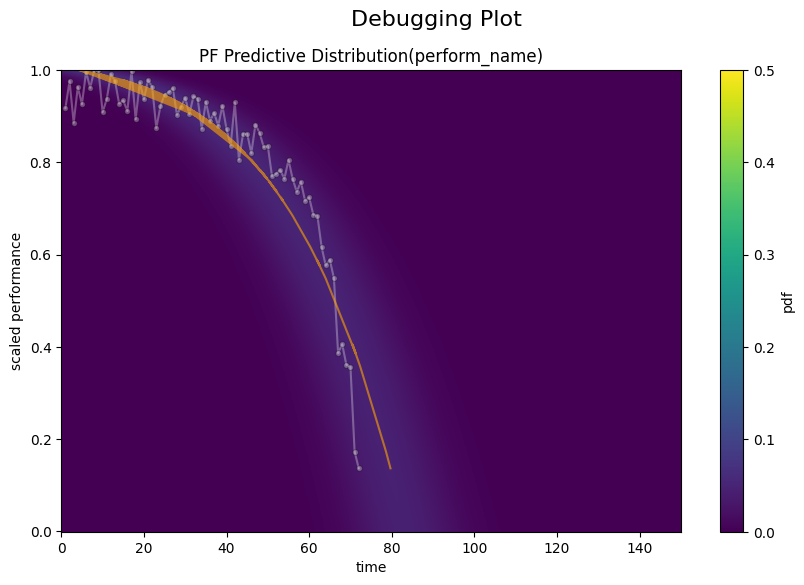

Epoch 41000, Best Loss: 0.5233994126319885
Epoch 42000, Best Loss: 0.5233467221260071
Epoch 43000, Best Loss: 0.5232946276664734
Epoch 44000, Best Loss: 0.5232436656951904
Epoch 45000, Best Loss: 0.5231946706771851
Epoch 46000, Best Loss: 0.5231464505195618
Epoch 47000, Best Loss: 0.5231004953384399
Epoch 48000, Best Loss: 0.5230551362037659
Epoch 49000, Best Loss: 0.5230114459991455
Epoch 50000, Best Loss: 0.5229686498641968
Epoch 51000, Best Loss: 0.5229275226593018
Epoch 52000, Best Loss: 0.5228866338729858
Epoch 53000, Best Loss: 0.522847592830658
Epoch 54000, Best Loss: 0.5228089690208435
Epoch 55000, Best Loss: 0.5227717161178589
Epoch 56000, Best Loss: 0.5227354764938354
Epoch 57000, Best Loss: 0.5226994156837463
Epoch 58000, Best Loss: 0.5226655006408691
Epoch 59000, Best Loss: 0.5226322412490845
Epoch 60000, Best Loss: 0.5225993990898132


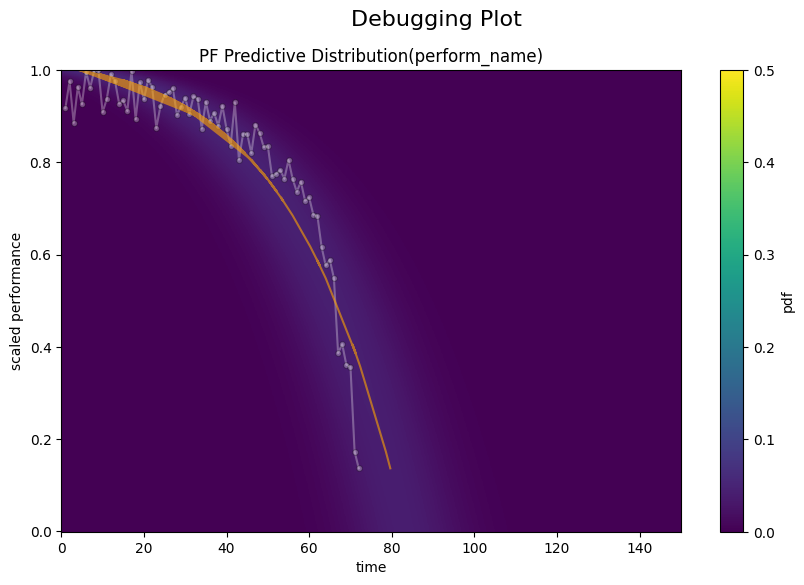

Epoch 61000, Best Loss: 0.5225672721862793
Epoch 62000, Best Loss: 0.5225362181663513
Epoch 63000, Best Loss: 0.5225054621696472
Epoch 64000, Best Loss: 0.5224756598472595
Epoch 65000, Best Loss: 0.5224467515945435
Epoch 66000, Best Loss: 0.5224185585975647
Epoch 67000, Best Loss: 0.5223905444145203
Epoch 68000, Best Loss: 0.5223634839057922
Epoch 69000, Best Loss: 0.522337019443512
Epoch 70000, Best Loss: 0.5223111510276794
Epoch 71000, Best Loss: 0.5222858786582947
Epoch 72000, Best Loss: 0.522260844707489
Epoch 73000, Best Loss: 0.5222364068031311
Epoch 74000, Best Loss: 0.5222121477127075
Epoch 75000, Best Loss: 0.5221872925758362
Epoch 76000, Best Loss: 0.5221635699272156
Epoch 77000, Best Loss: 0.5221400260925293
Epoch 78000, Best Loss: 0.522117018699646
Epoch 79000, Best Loss: 0.5220935344696045
Epoch 80000, Best Loss: 0.5220708250999451


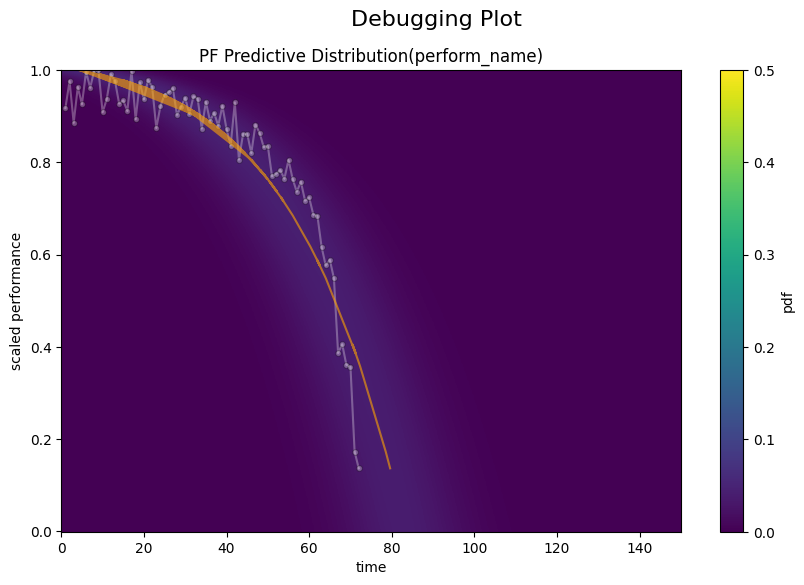

Epoch 81000, Best Loss: 0.5220482349395752
Epoch 82000, Best Loss: 0.5220252871513367
Epoch 83000, Best Loss: 0.522002637386322
Epoch 84000, Best Loss: 0.5219805836677551
Epoch 85000, Best Loss: 0.5219585299491882
Epoch 86000, Best Loss: 0.5219371914863586
Epoch 87000, Best Loss: 0.521915078163147
Epoch 88000, Best Loss: 0.5218935608863831
Epoch 89000, Best Loss: 0.5218722224235535
Epoch 90000, Best Loss: 0.521851122379303
Epoch 91000, Best Loss: 0.5218302607536316
Epoch 92000, Best Loss: 0.5218093395233154
Epoch 93000, Best Loss: 0.5217889547348022
Epoch 94000, Best Loss: 0.5217679738998413
Epoch 95000, Best Loss: 0.5217477679252625
Epoch 96000, Best Loss: 0.5217276811599731
Epoch 97000, Best Loss: 0.5217074751853943
Epoch 98000, Best Loss: 0.5216877460479736
Epoch 99000, Best Loss: 0.5216681957244873
Best value: 0.5216484665870667
Best parameters: {'p': 11.756864547729492, 'mu': 224.00439453125, 'a': 1.0312299841915755, 'mean': 306.4663391113281, 'var': 104.08364868164062}


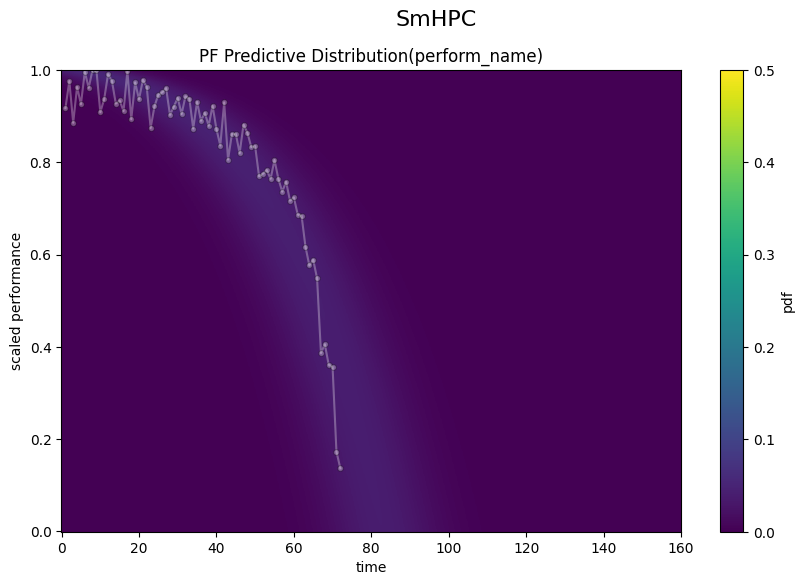

Epoch 1000, Best Loss: 0.9884217977523804
Epoch 2000, Best Loss: 0.9548850059509277
Epoch 3000, Best Loss: 0.9244237542152405
Epoch 4000, Best Loss: 0.8980859518051147
Epoch 5000, Best Loss: 0.8760111331939697
Epoch 6000, Best Loss: 0.8580985069274902
Epoch 7000, Best Loss: 0.8440947532653809
Epoch 8000, Best Loss: 0.8337246775627136
Epoch 9000, Best Loss: 0.8265936374664307
Epoch 10000, Best Loss: 0.8221847414970398
Epoch 11000, Best Loss: 0.8197914361953735
Epoch 12000, Best Loss: 0.8184989094734192
Epoch 13000, Best Loss: 0.8174649477005005
Epoch 14000, Best Loss: 0.816265881061554
Epoch 15000, Best Loss: 0.8148515224456787
Epoch 16000, Best Loss: 0.8132768869400024
Epoch 17000, Best Loss: 0.8116121888160706
Epoch 18000, Best Loss: 0.8099035024642944
Epoch 19000, Best Loss: 0.8081806898117065
Epoch 20000, Best Loss: 0.8064440488815308


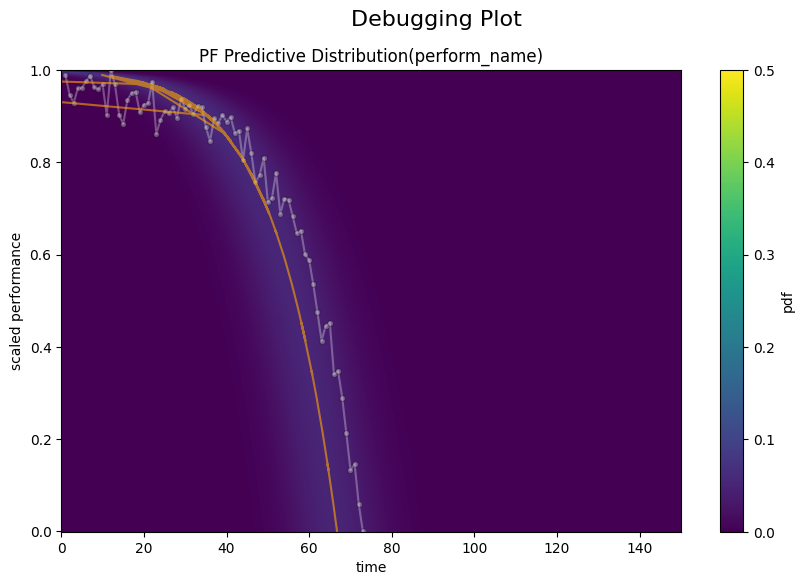

Epoch 21000, Best Loss: 0.8047005534172058
Epoch 22000, Best Loss: 0.8029476404190063
Epoch 23000, Best Loss: 0.801183819770813
Epoch 24000, Best Loss: 0.7994088530540466
Epoch 25000, Best Loss: 0.7976319193840027
Epoch 26000, Best Loss: 0.7958460450172424
Epoch 27000, Best Loss: 0.7940493226051331
Epoch 28000, Best Loss: 0.7922454476356506
Epoch 29000, Best Loss: 0.7904322147369385
Epoch 30000, Best Loss: 0.788607120513916
Epoch 31000, Best Loss: 0.7867689728736877
Epoch 32000, Best Loss: 0.784918487071991
Epoch 33000, Best Loss: 0.7830554246902466
Epoch 34000, Best Loss: 0.7811779379844666
Epoch 35000, Best Loss: 0.7792932391166687
Epoch 36000, Best Loss: 0.7774012088775635
Epoch 37000, Best Loss: 0.7754971385002136
Epoch 38000, Best Loss: 0.773583710193634
Epoch 39000, Best Loss: 0.7716437578201294
Epoch 40000, Best Loss: 0.7696988582611084


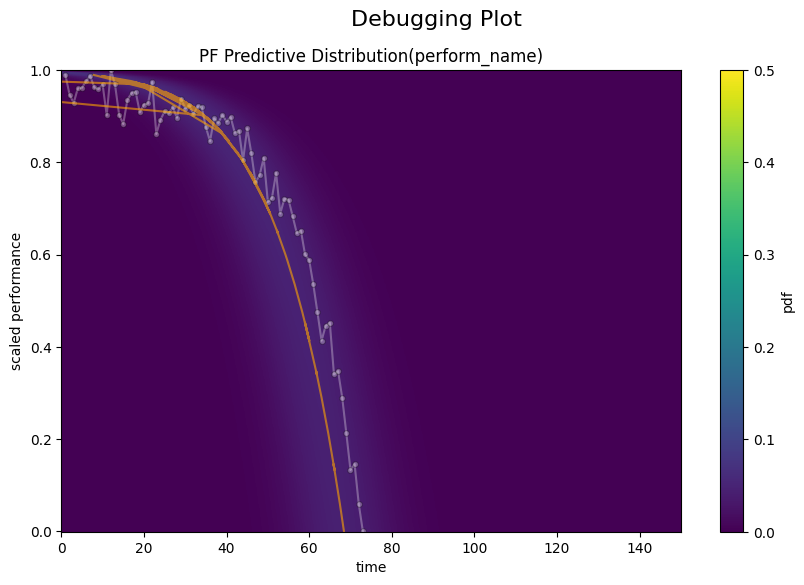

Epoch 41000, Best Loss: 0.7677409052848816
Epoch 42000, Best Loss: 0.7657666802406311
Epoch 43000, Best Loss: 0.7637789249420166
Epoch 44000, Best Loss: 0.7617754936218262
Epoch 45000, Best Loss: 0.7597557306289673
Epoch 46000, Best Loss: 0.7577217817306519
Epoch 47000, Best Loss: 0.7556788325309753
Epoch 48000, Best Loss: 0.7536250948905945
Epoch 49000, Best Loss: 0.7515571713447571
Epoch 50000, Best Loss: 0.7494738698005676
Epoch 51000, Best Loss: 0.7473754286766052
Epoch 52000, Best Loss: 0.7452616095542908
Epoch 53000, Best Loss: 0.7431328892707825
Epoch 54000, Best Loss: 0.740988552570343
Epoch 55000, Best Loss: 0.7388287782669067
Epoch 56000, Best Loss: 0.7366548180580139
Epoch 57000, Best Loss: 0.734464704990387
Epoch 58000, Best Loss: 0.732260525226593
Epoch 59000, Best Loss: 0.7300415635108948
Epoch 60000, Best Loss: 0.7278084754943848


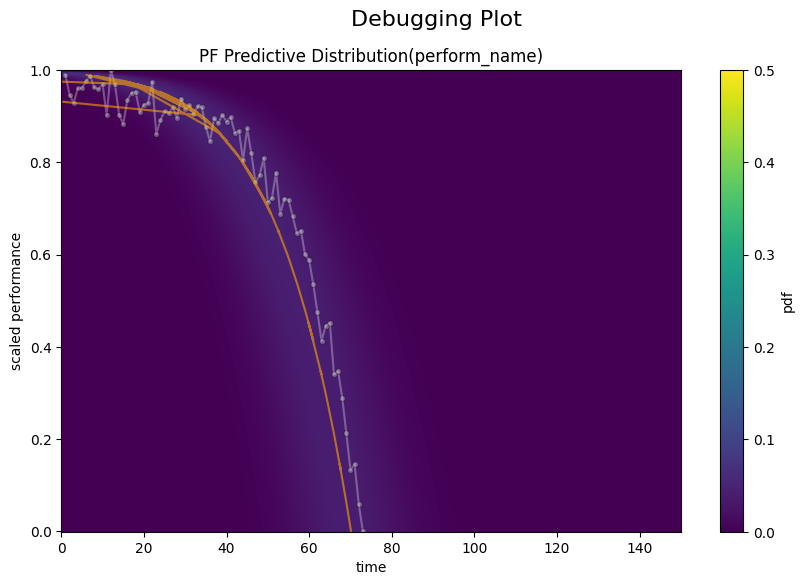

Epoch 61000, Best Loss: 0.7255736589431763
Epoch 62000, Best Loss: 0.7233250141143799
Epoch 63000, Best Loss: 0.7210612893104553
Epoch 64000, Best Loss: 0.7187850475311279
Epoch 65000, Best Loss: 0.7164952754974365
Epoch 66000, Best Loss: 0.7141932249069214
Epoch 67000, Best Loss: 0.7118780612945557
Epoch 68000, Best Loss: 0.7095508575439453
Epoch 69000, Best Loss: 0.7072120308876038
Epoch 70000, Best Loss: 0.7048617005348206
Epoch 71000, Best Loss: 0.7025004625320435
Epoch 72000, Best Loss: 0.7001281976699829
Epoch 73000, Best Loss: 0.6977469325065613
Epoch 74000, Best Loss: 0.6953553557395935
Epoch 75000, Best Loss: 0.6929548978805542
Epoch 76000, Best Loss: 0.690545916557312
Epoch 77000, Best Loss: 0.6881288886070251
Epoch 78000, Best Loss: 0.6857045888900757
Epoch 79000, Best Loss: 0.6832736134529114
Epoch 80000, Best Loss: 0.6808363199234009


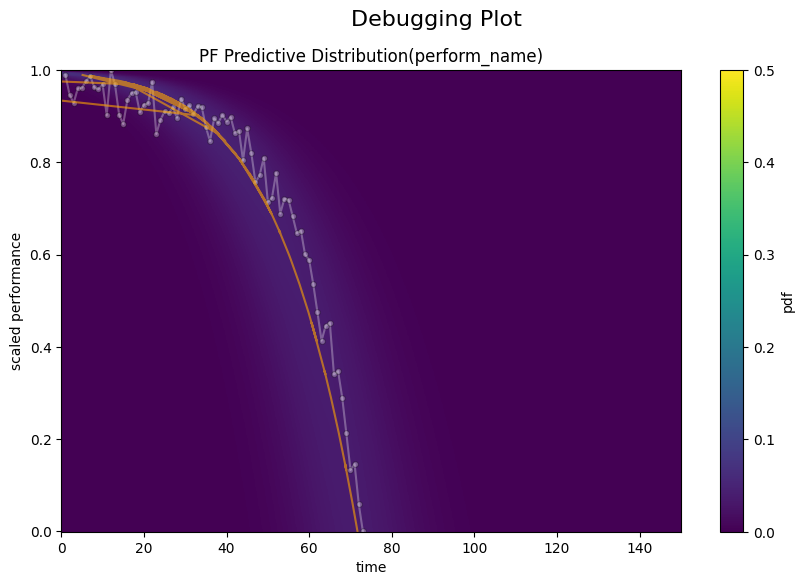

Epoch 81000, Best Loss: 0.6784050464630127
Epoch 82000, Best Loss: 0.6759741306304932
Epoch 83000, Best Loss: 0.6735388040542603
Epoch 84000, Best Loss: 0.6711007952690125
Epoch 85000, Best Loss: 0.6686604022979736
Epoch 86000, Best Loss: 0.6662169694900513
Epoch 87000, Best Loss: 0.6637717485427856
Epoch 88000, Best Loss: 0.6613267064094543
Epoch 89000, Best Loss: 0.6588827967643738
Epoch 90000, Best Loss: 0.6564412117004395
Epoch 91000, Best Loss: 0.6540026664733887
Epoch 92000, Best Loss: 0.6515681743621826
Epoch 93000, Best Loss: 0.6491384506225586
Epoch 94000, Best Loss: 0.6467157006263733
Epoch 95000, Best Loss: 0.644300103187561
Epoch 96000, Best Loss: 0.6418935656547546
Epoch 97000, Best Loss: 0.6395100355148315
Epoch 98000, Best Loss: 0.6371400356292725
Epoch 99000, Best Loss: 0.6347829103469849
Best value: 0.6324416995048523
Best parameters: {'p': 6.733151912689209, 'mu': 65.45357513427734, 'a': 1.0000000000387528, 'mean': 138.2960968017578, 'var': 142.56192016601562}


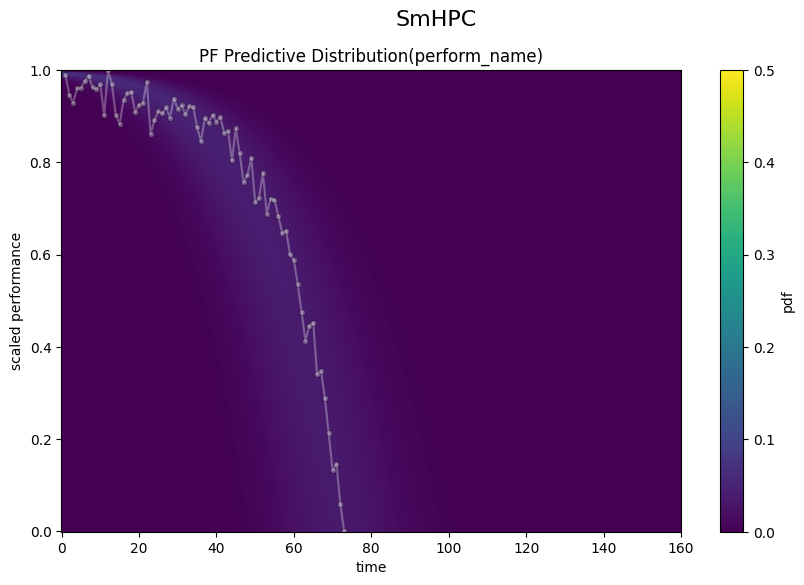

Epoch 1000, Best Loss: 1.6571612358093262
Epoch 2000, Best Loss: 1.5654089450836182
Epoch 3000, Best Loss: 1.4879313707351685
Epoch 4000, Best Loss: 1.4194623231887817
Epoch 5000, Best Loss: 1.3575643301010132
Epoch 6000, Best Loss: 1.3011265993118286
Epoch 7000, Best Loss: 1.2495588064193726
Epoch 8000, Best Loss: 1.20271897315979
Epoch 9000, Best Loss: 1.1606345176696777
Epoch 10000, Best Loss: 1.1233649253845215
Epoch 11000, Best Loss: 1.0910274982452393
Epoch 12000, Best Loss: 1.063591480255127
Epoch 13000, Best Loss: 1.0408098697662354
Epoch 14000, Best Loss: 1.022166132926941
Epoch 15000, Best Loss: 1.0068491697311401
Epoch 16000, Best Loss: 0.994005560874939
Epoch 17000, Best Loss: 0.9829857349395752
Epoch 18000, Best Loss: 0.9734058380126953
Epoch 19000, Best Loss: 0.9650601744651794
Epoch 20000, Best Loss: 0.9578254222869873


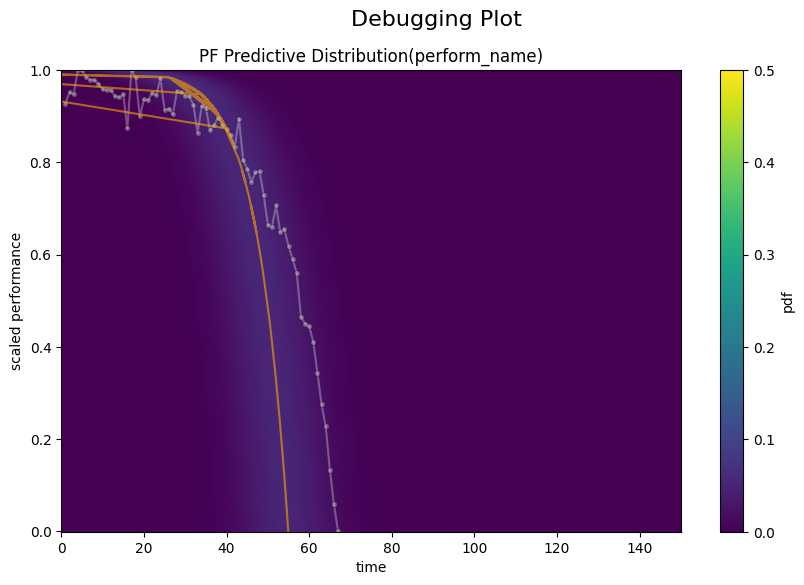

Epoch 21000, Best Loss: 0.9515964984893799
Epoch 22000, Best Loss: 0.9462886452674866
Epoch 23000, Best Loss: 0.9417985081672668
Epoch 24000, Best Loss: 0.9380334615707397
Epoch 25000, Best Loss: 0.9349170923233032
Epoch 26000, Best Loss: 0.9323848485946655
Epoch 27000, Best Loss: 0.9303561449050903
Epoch 28000, Best Loss: 0.9287715554237366
Epoch 29000, Best Loss: 0.9275648593902588
Epoch 30000, Best Loss: 0.9266661405563354
Epoch 31000, Best Loss: 0.9260037541389465
Epoch 32000, Best Loss: 0.9254897236824036
Epoch 33000, Best Loss: 0.925022304058075
Epoch 34000, Best Loss: 0.9245368242263794
Epoch 35000, Best Loss: 0.9240294694900513
Epoch 36000, Best Loss: 0.923509418964386
Epoch 37000, Best Loss: 0.9229840040206909
Epoch 38000, Best Loss: 0.9224538803100586
Epoch 39000, Best Loss: 0.9219207167625427
Epoch 40000, Best Loss: 0.9213829636573792


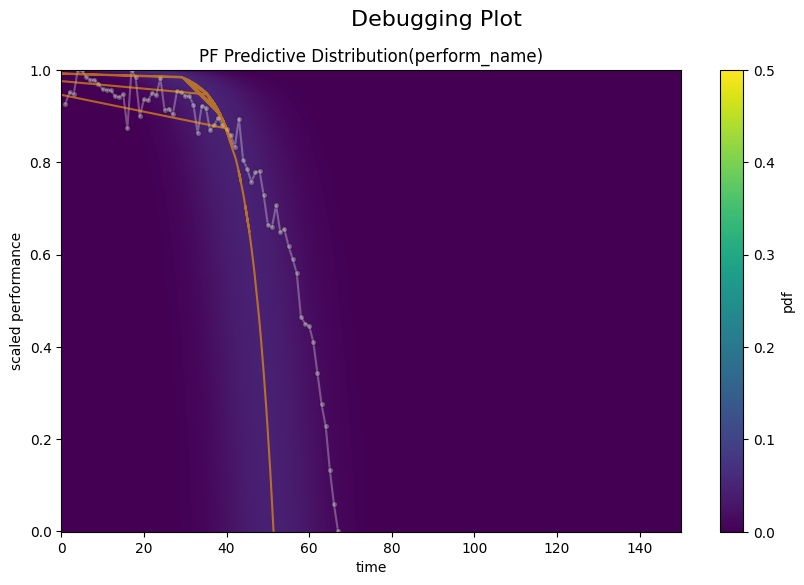

Epoch 41000, Best Loss: 0.9208390712738037
Epoch 42000, Best Loss: 0.9202897548675537
Epoch 43000, Best Loss: 0.9197353720664978
Epoch 44000, Best Loss: 0.919174313545227
Epoch 45000, Best Loss: 0.9186068177223206
Epoch 46000, Best Loss: 0.9180311560630798
Epoch 47000, Best Loss: 0.9174489974975586
Epoch 48000, Best Loss: 0.9168580174446106
Epoch 49000, Best Loss: 0.9162583947181702
Epoch 50000, Best Loss: 0.9156497120857239
Epoch 51000, Best Loss: 0.9150319695472717
Epoch 52000, Best Loss: 0.9144032597541809
Epoch 53000, Best Loss: 0.9137657880783081
Epoch 54000, Best Loss: 0.9131165146827698
Epoch 55000, Best Loss: 0.9124560356140137
Epoch 56000, Best Loss: 0.9117840528488159
Epoch 57000, Best Loss: 0.9110991954803467
Epoch 58000, Best Loss: 0.9104018211364746
Epoch 59000, Best Loss: 0.9096903800964355
Epoch 60000, Best Loss: 0.9089643359184265


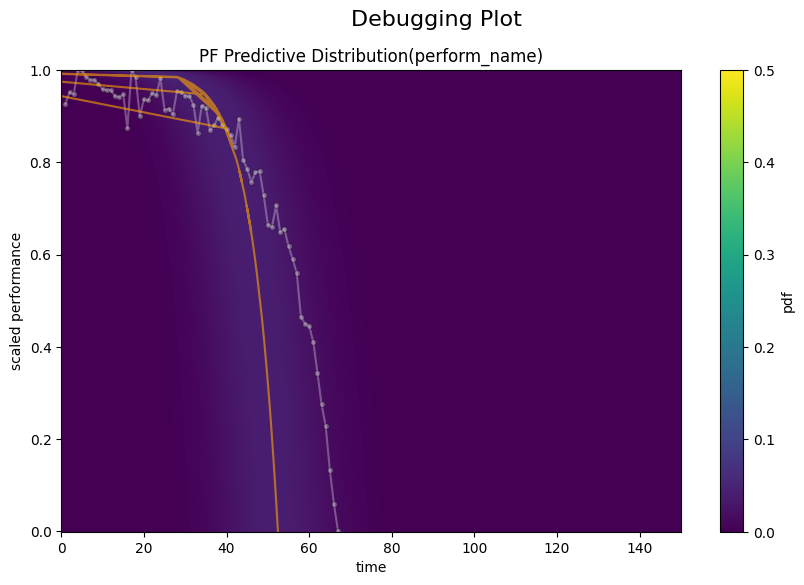

Epoch 61000, Best Loss: 0.9082231521606445
Epoch 62000, Best Loss: 0.9074659943580627
Epoch 63000, Best Loss: 0.9066919088363647
Epoch 64000, Best Loss: 0.9059001207351685
Epoch 65000, Best Loss: 0.9050889611244202
Epoch 66000, Best Loss: 0.9042600989341736
Epoch 67000, Best Loss: 0.9034098386764526
Epoch 68000, Best Loss: 0.9025387763977051
Epoch 69000, Best Loss: 0.9016444683074951
Epoch 70000, Best Loss: 0.9007270932197571
Epoch 71000, Best Loss: 0.8997852802276611
Epoch 72000, Best Loss: 0.8988158106803894
Epoch 73000, Best Loss: 0.8978189826011658
Epoch 74000, Best Loss: 0.8967946171760559
Epoch 75000, Best Loss: 0.8957470059394836
Epoch 76000, Best Loss: 0.8946728706359863
Epoch 77000, Best Loss: 0.8935655355453491
Epoch 78000, Best Loss: 0.8924233317375183
Epoch 79000, Best Loss: 0.8912436962127686
Epoch 80000, Best Loss: 0.8900254964828491


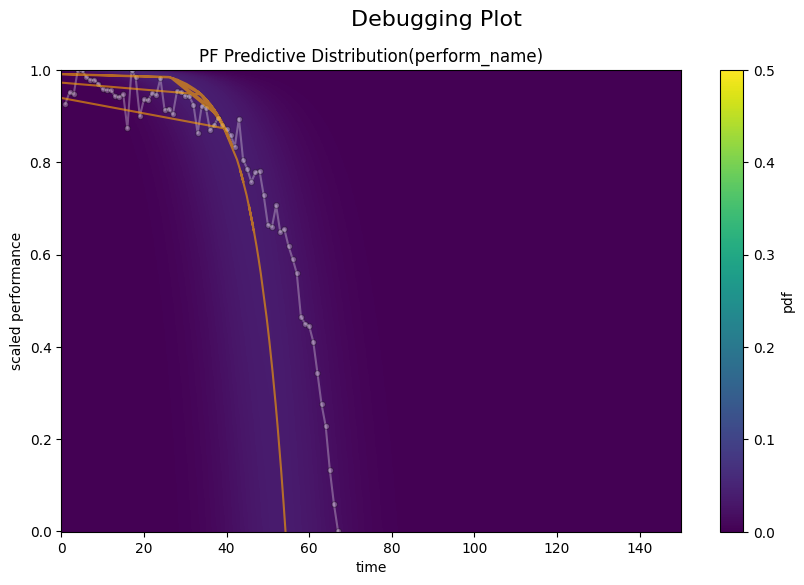

Epoch 81000, Best Loss: 0.8887698650360107
Epoch 82000, Best Loss: 0.8874834775924683
Epoch 83000, Best Loss: 0.8861544132232666
Epoch 84000, Best Loss: 0.8847789764404297
Epoch 85000, Best Loss: 0.8833590149879456
Epoch 86000, Best Loss: 0.8819021582603455
Epoch 87000, Best Loss: 0.8803949356079102
Epoch 88000, Best Loss: 0.8788368105888367
Epoch 89000, Best Loss: 0.8772361874580383
Epoch 90000, Best Loss: 0.8755833506584167
Epoch 91000, Best Loss: 0.8738768696784973
Epoch 92000, Best Loss: 0.8721198439598083
Epoch 93000, Best Loss: 0.8703018426895142
Epoch 94000, Best Loss: 0.8684295415878296
Epoch 95000, Best Loss: 0.866493284702301
Epoch 96000, Best Loss: 0.8644979596138
Epoch 97000, Best Loss: 0.8624374270439148
Epoch 98000, Best Loss: 0.8603116273880005
Epoch 99000, Best Loss: 0.8581190705299377
Best value: 0.8558534979820251
Best parameters: {'p': 14.133501052856445, 'mu': 76.70287322998047, 'a': 1.0000000000360845, 'mean': 133.7532196044922, 'var': 140.17916870117188}


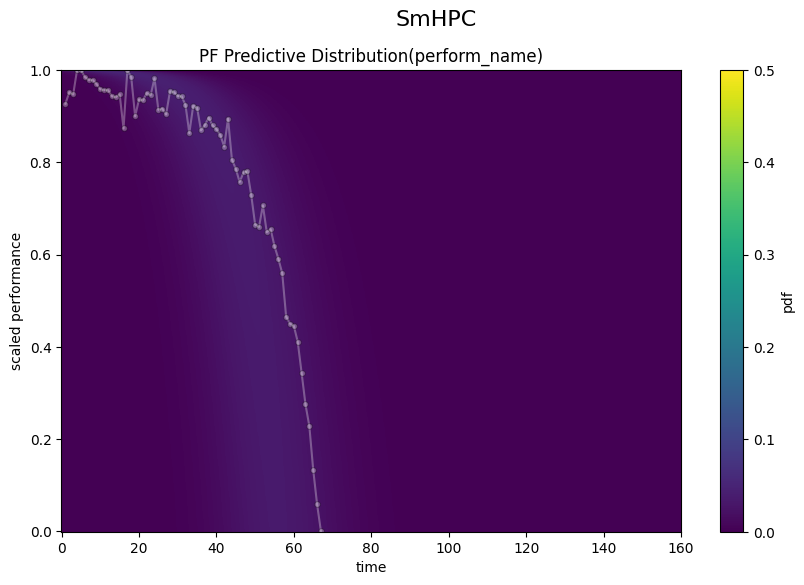

Epoch 1000, Best Loss: 1.129312515258789
Epoch 2000, Best Loss: 1.0218043327331543
Epoch 3000, Best Loss: 0.9379065632820129
Epoch 4000, Best Loss: 0.8531222343444824
Epoch 5000, Best Loss: 0.7722381353378296
Epoch 6000, Best Loss: 0.6944071054458618
Epoch 7000, Best Loss: 0.6202635169029236
Epoch 8000, Best Loss: 0.5508366227149963
Epoch 9000, Best Loss: 0.48858731985092163
Epoch 10000, Best Loss: 0.43650540709495544
Epoch 11000, Best Loss: 0.3966786563396454
Epoch 12000, Best Loss: 0.3682374656200409
Epoch 13000, Best Loss: 0.349172979593277
Epoch 14000, Best Loss: 0.34051430225372314
Epoch 15000, Best Loss: 0.33893686532974243
Epoch 16000, Best Loss: 0.3388534486293793
Epoch 17000, Best Loss: 0.3388335406780243
Epoch 18000, Best Loss: 0.3388131856918335
Epoch 19000, Best Loss: 0.3387902081012726
Epoch 20000, Best Loss: 0.33876514434814453


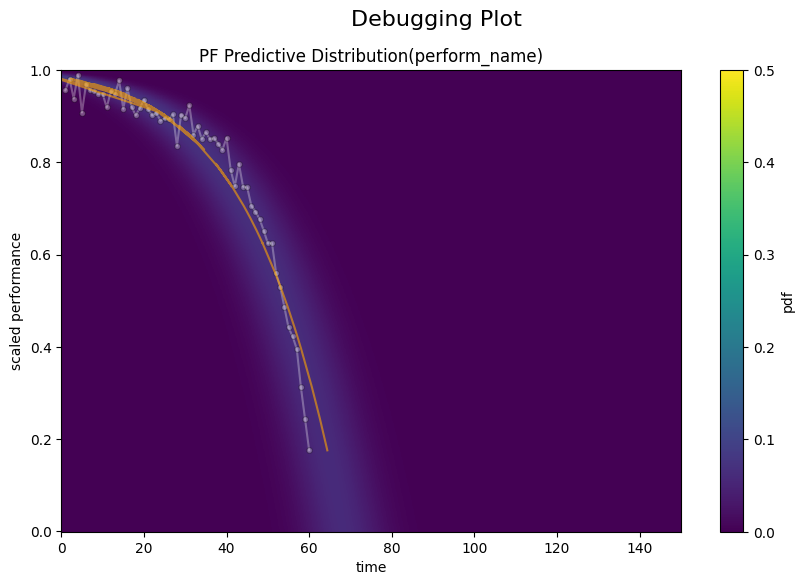

Epoch 21000, Best Loss: 0.33873650431632996
Epoch 22000, Best Loss: 0.33869966864585876
Epoch 23000, Best Loss: 0.33865660429000854
Epoch 24000, Best Loss: 0.33860769867897034
Epoch 25000, Best Loss: 0.3385559916496277
Epoch 26000, Best Loss: 0.338504821062088
Epoch 27000, Best Loss: 0.33845391869544983
Epoch 28000, Best Loss: 0.33840304613113403
Epoch 29000, Best Loss: 0.3383561372756958
Epoch 30000, Best Loss: 0.33830970525741577
Epoch 31000, Best Loss: 0.3382658362388611
Epoch 32000, Best Loss: 0.33822107315063477
Epoch 33000, Best Loss: 0.33817803859710693
Epoch 34000, Best Loss: 0.33813485503196716
Epoch 35000, Best Loss: 0.3380928039550781
Epoch 36000, Best Loss: 0.3380502164363861
Epoch 37000, Best Loss: 0.33800917863845825
Epoch 38000, Best Loss: 0.3379676938056946
Epoch 39000, Best Loss: 0.33792710304260254
Epoch 40000, Best Loss: 0.3378869593143463


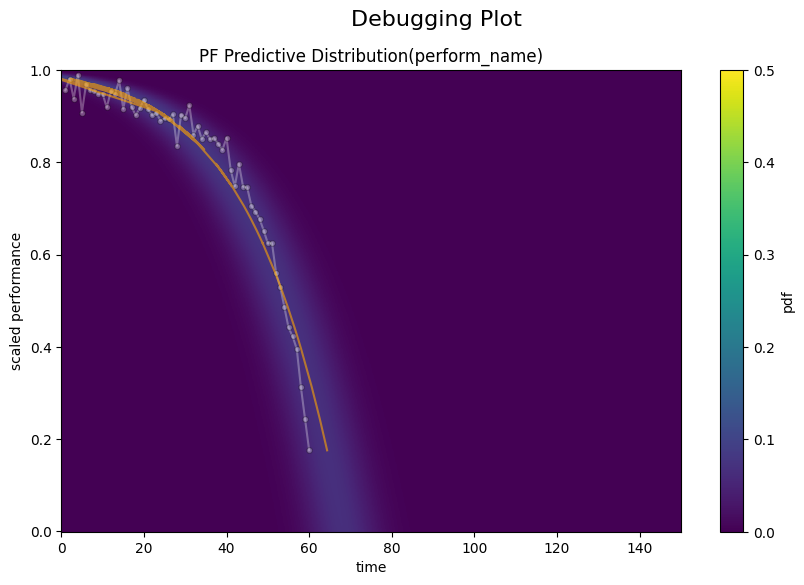

Epoch 41000, Best Loss: 0.3378482162952423
Epoch 42000, Best Loss: 0.3378085494041443
Epoch 43000, Best Loss: 0.3377695083618164
Epoch 44000, Best Loss: 0.33772915601730347
Epoch 45000, Best Loss: 0.3376920819282532
Epoch 46000, Best Loss: 0.33765408396720886
Epoch 47000, Best Loss: 0.33761683106422424
Epoch 48000, Best Loss: 0.3375793993473053
Epoch 49000, Best Loss: 0.3375416696071625
Epoch 50000, Best Loss: 0.33750560879707336
Epoch 51000, Best Loss: 0.33746954798698425
Epoch 52000, Best Loss: 0.3374343812465668
Epoch 53000, Best Loss: 0.3373987078666687
Epoch 54000, Best Loss: 0.33736276626586914
Epoch 55000, Best Loss: 0.3373291790485382
Epoch 56000, Best Loss: 0.3372949957847595
Epoch 57000, Best Loss: 0.33726072311401367
Epoch 58000, Best Loss: 0.3372271656990051
Epoch 59000, Best Loss: 0.3371930420398712
Epoch 60000, Best Loss: 0.33716076612472534


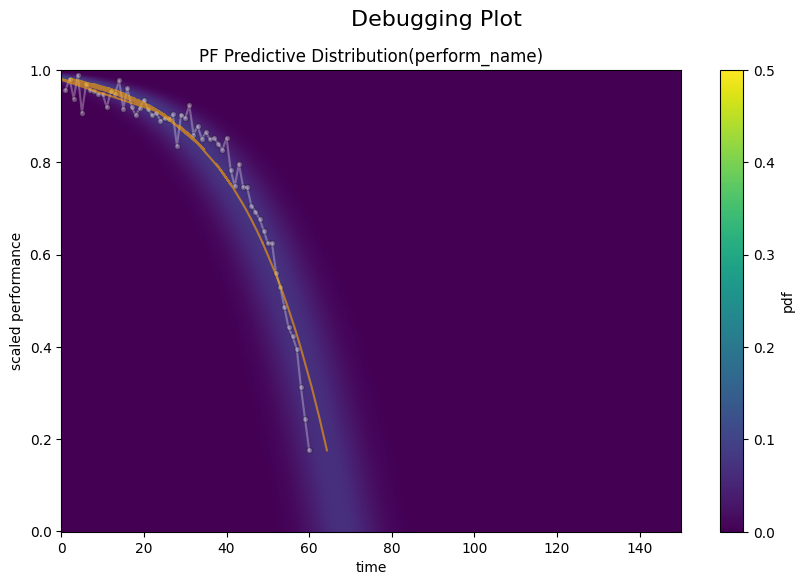

Epoch 61000, Best Loss: 0.3371274471282959
Epoch 62000, Best Loss: 0.3370947539806366
Epoch 63000, Best Loss: 0.33706268668174744
Epoch 64000, Best Loss: 0.33703142404556274
Epoch 65000, Best Loss: 0.3369995951652527
Epoch 66000, Best Loss: 0.33696839213371277
Epoch 67000, Best Loss: 0.33693772554397583
Epoch 68000, Best Loss: 0.3369070887565613
Epoch 69000, Best Loss: 0.33687624335289
Epoch 70000, Best Loss: 0.33684593439102173
Epoch 71000, Best Loss: 0.3368166387081146
Epoch 72000, Best Loss: 0.33678677678108215
Epoch 73000, Best Loss: 0.3367573022842407
Epoch 74000, Best Loss: 0.3367280662059784
Epoch 75000, Best Loss: 0.3366988003253937
Epoch 76000, Best Loss: 0.3366706967353821
Epoch 77000, Best Loss: 0.33664289116859436
Epoch 78000, Best Loss: 0.33661431074142456
Epoch 79000, Best Loss: 0.3365865647792816
Epoch 80000, Best Loss: 0.3365589678287506


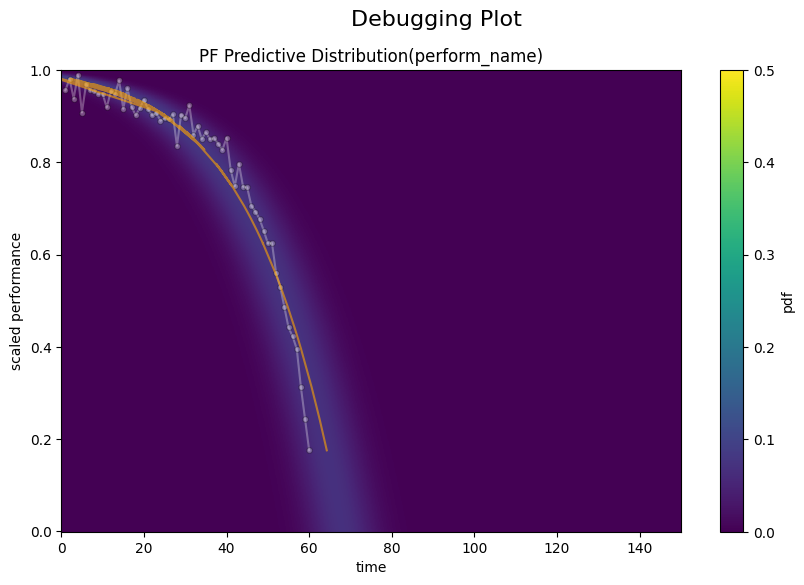

Epoch 81000, Best Loss: 0.33653098344802856
Epoch 82000, Best Loss: 0.33650436997413635
Epoch 83000, Best Loss: 0.33647778630256653
Epoch 84000, Best Loss: 0.3364506959915161
Epoch 85000, Best Loss: 0.33642080426216125
Epoch 86000, Best Loss: 0.33639419078826904
Epoch 87000, Best Loss: 0.3363680839538574
Epoch 88000, Best Loss: 0.3363426923751831
Epoch 89000, Best Loss: 0.3363160490989685
Epoch 90000, Best Loss: 0.33629071712493896
Epoch 91000, Best Loss: 0.3362668454647064
Epoch 92000, Best Loss: 0.33624011278152466
Epoch 93000, Best Loss: 0.33621591329574585
Epoch 94000, Best Loss: 0.3361915647983551
Epoch 95000, Best Loss: 0.3361673355102539
Epoch 96000, Best Loss: 0.3361424207687378
Epoch 97000, Best Loss: 0.33611875772476196
Epoch 98000, Best Loss: 0.33609357476234436
Epoch 99000, Best Loss: 0.33607017993927
Best value: 0.3360467851161957
Best parameters: {'p': 14.400911331176758, 'mu': 230.42584228515625, 'a': 1.008444249462781, 'mean': 298.4316711425781, 'var': 32.48428344726562

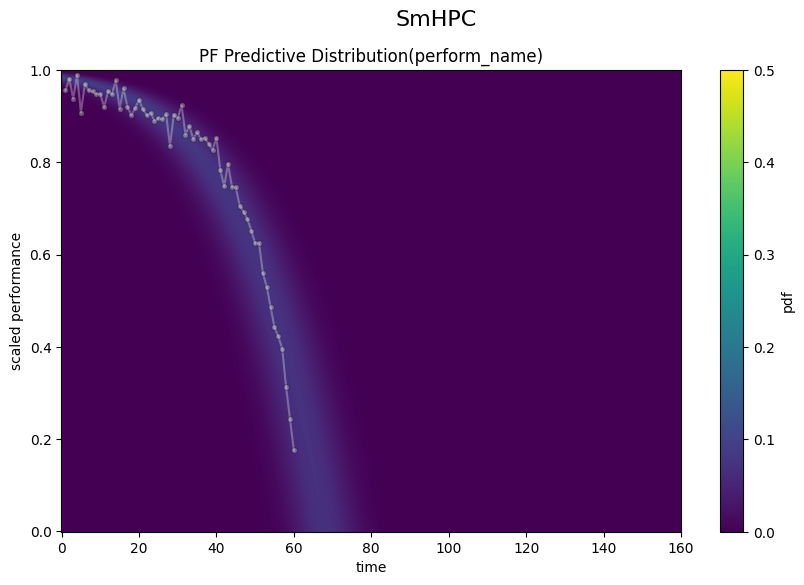

Epoch 1000, Best Loss: 0.7519464492797852
Epoch 2000, Best Loss: 0.6895774006843567
Epoch 3000, Best Loss: 0.6672970652580261
Epoch 4000, Best Loss: 0.6484172940254211
Epoch 5000, Best Loss: 0.6285821199417114
Epoch 6000, Best Loss: 0.6096904873847961
Epoch 7000, Best Loss: 0.5910775661468506
Epoch 8000, Best Loss: 0.5717491507530212
Epoch 9000, Best Loss: 0.5491435527801514
Epoch 10000, Best Loss: 0.5198459625244141
Epoch 11000, Best Loss: 0.488686740398407
Epoch 12000, Best Loss: 0.47031891345977783
Epoch 13000, Best Loss: 0.4662132263183594
Epoch 14000, Best Loss: 0.46594592928886414
Epoch 15000, Best Loss: 0.4658561050891876
Epoch 16000, Best Loss: 0.46575742959976196
Epoch 17000, Best Loss: 0.465652734041214
Epoch 18000, Best Loss: 0.4655446708202362
Epoch 19000, Best Loss: 0.4654379189014435
Epoch 20000, Best Loss: 0.4653337001800537


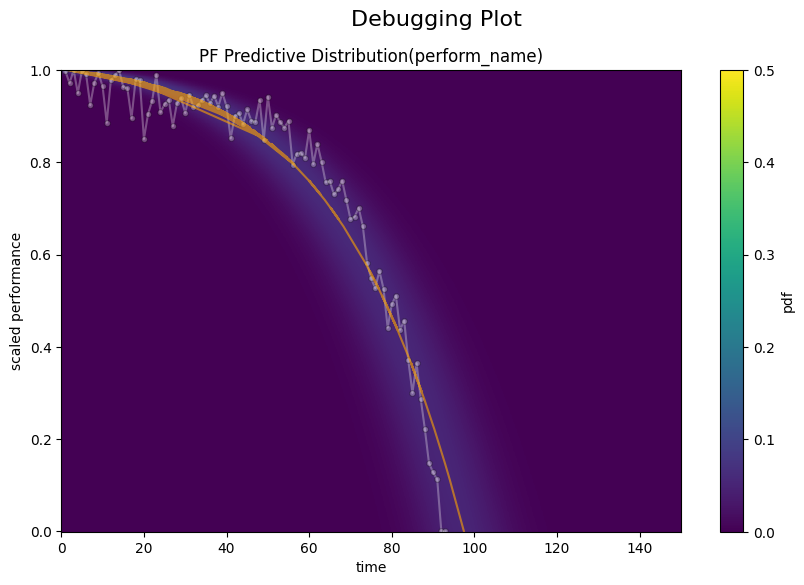

Epoch 21000, Best Loss: 0.4652329385280609
Epoch 22000, Best Loss: 0.4651334881782532
Epoch 23000, Best Loss: 0.46503835916519165
Epoch 24000, Best Loss: 0.46494588255882263
Epoch 25000, Best Loss: 0.4648565948009491
Epoch 26000, Best Loss: 0.4647700786590576
Epoch 27000, Best Loss: 0.46468585729599
Epoch 28000, Best Loss: 0.4646044075489044
Epoch 29000, Best Loss: 0.46452435851097107
Epoch 30000, Best Loss: 0.464447557926178
Epoch 31000, Best Loss: 0.46437305212020874
Epoch 32000, Best Loss: 0.4643000662326813
Epoch 33000, Best Loss: 0.46422919631004333
Epoch 34000, Best Loss: 0.46416032314300537
Epoch 35000, Best Loss: 0.4640933573246002
Epoch 36000, Best Loss: 0.46402865648269653
Epoch 37000, Best Loss: 0.46396496891975403
Epoch 38000, Best Loss: 0.4639037549495697
Epoch 39000, Best Loss: 0.46384337544441223
Epoch 40000, Best Loss: 0.463784784078598


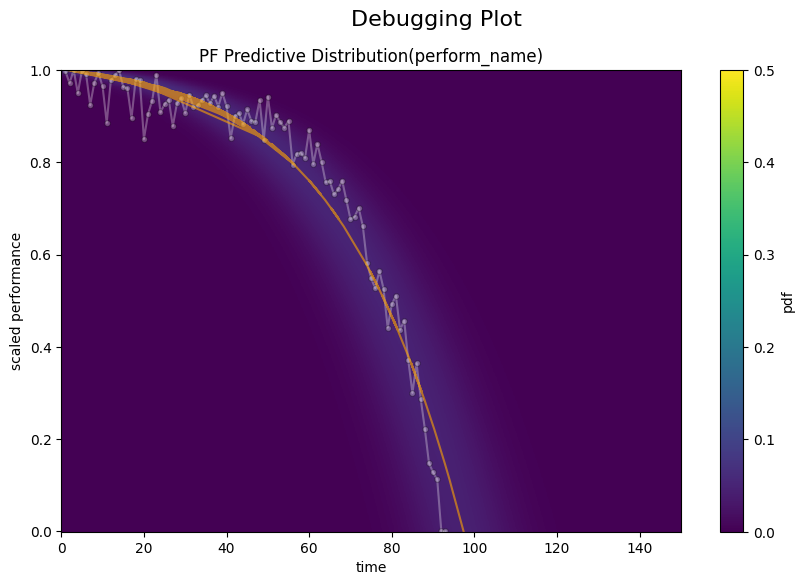

Epoch 41000, Best Loss: 0.46372783184051514
Epoch 42000, Best Loss: 0.4636725187301636
Epoch 43000, Best Loss: 0.4636182487010956
Epoch 44000, Best Loss: 0.46356528997421265
Epoch 45000, Best Loss: 0.4635140299797058
Epoch 46000, Best Loss: 0.46346381306648254
Epoch 47000, Best Loss: 0.4634147882461548
Epoch 48000, Best Loss: 0.4633673131465912
Epoch 49000, Best Loss: 0.46332043409347534
Epoch 50000, Best Loss: 0.4632750451564789
Epoch 51000, Best Loss: 0.4632304608821869
Epoch 52000, Best Loss: 0.4631868302822113
Epoch 53000, Best Loss: 0.4631439447402954
Epoch 54000, Best Loss: 0.4631022810935974
Epoch 55000, Best Loss: 0.4630624055862427
Epoch 56000, Best Loss: 0.46302247047424316
Epoch 57000, Best Loss: 0.46298345923423767
Epoch 58000, Best Loss: 0.46294522285461426
Epoch 59000, Best Loss: 0.46290823817253113
Epoch 60000, Best Loss: 0.46287286281585693


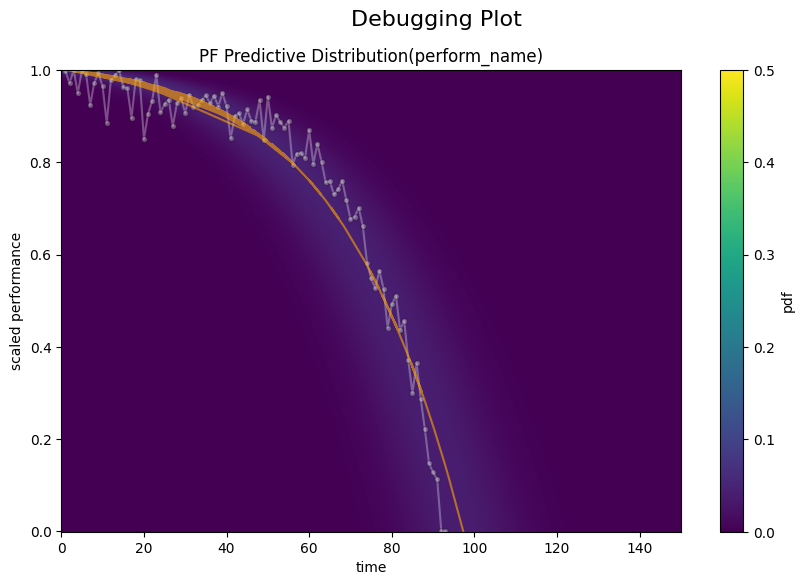

Epoch 61000, Best Loss: 0.46283653378486633
Epoch 62000, Best Loss: 0.4628017544746399
Epoch 63000, Best Loss: 0.46276798844337463
Epoch 64000, Best Loss: 0.46273428201675415
Epoch 65000, Best Loss: 0.4627014398574829
Epoch 66000, Best Loss: 0.4626699686050415
Epoch 67000, Best Loss: 0.4626384973526001
Epoch 68000, Best Loss: 0.4626075029373169
Epoch 69000, Best Loss: 0.4625778794288635
Epoch 70000, Best Loss: 0.46254807710647583
Epoch 71000, Best Loss: 0.4625193178653717
Epoch 72000, Best Loss: 0.4624910354614258
Epoch 73000, Best Loss: 0.4624629318714142
Epoch 74000, Best Loss: 0.4624357223510742
Epoch 75000, Best Loss: 0.46240895986557007
Epoch 76000, Best Loss: 0.46238309144973755
Epoch 77000, Best Loss: 0.46235695481300354
Epoch 78000, Best Loss: 0.4623314142227173
Epoch 79000, Best Loss: 0.4623062312602997
Epoch 80000, Best Loss: 0.46228164434432983


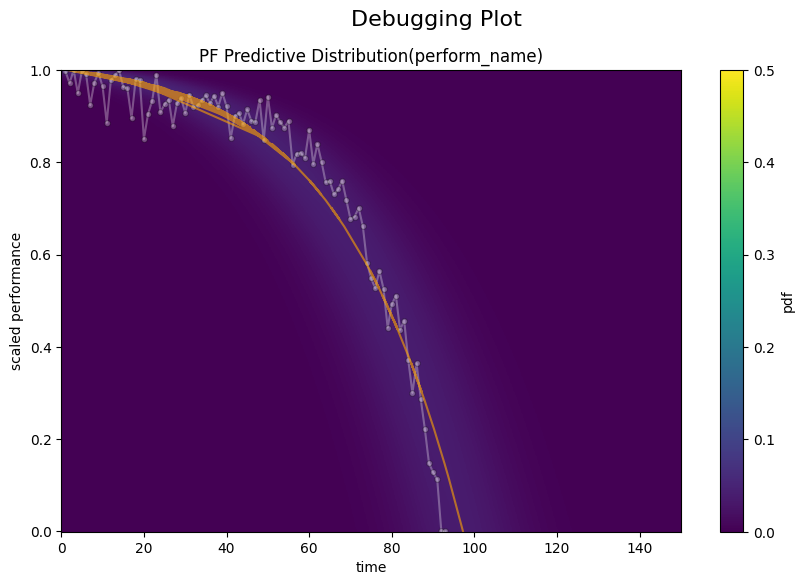

Epoch 81000, Best Loss: 0.4622572660446167
Epoch 82000, Best Loss: 0.4622330367565155
Epoch 83000, Best Loss: 0.4622090458869934
Epoch 84000, Best Loss: 0.4621848464012146
Epoch 85000, Best Loss: 0.4621616005897522
Epoch 86000, Best Loss: 0.4621380865573883
Epoch 87000, Best Loss: 0.46211469173431396
Epoch 88000, Best Loss: 0.46209171414375305
Epoch 89000, Best Loss: 0.4620688557624817
Epoch 90000, Best Loss: 0.46204638481140137
Epoch 91000, Best Loss: 0.4620235562324524
Epoch 92000, Best Loss: 0.46200159192085266
Epoch 93000, Best Loss: 0.4619792401790619
Epoch 94000, Best Loss: 0.46195727586746216
Epoch 95000, Best Loss: 0.46193522214889526
Epoch 96000, Best Loss: 0.4619138538837433
Epoch 97000, Best Loss: 0.46189233660697937
Epoch 98000, Best Loss: 0.46187132596969604
Epoch 99000, Best Loss: 0.4618498980998993
Best value: 0.4618290662765503
Best parameters: {'p': 11.100443840026855, 'mu': 221.92575073242188, 'a': 1.0194970304120547, 'mean': 318.556884765625, 'var': 111.6089706420898

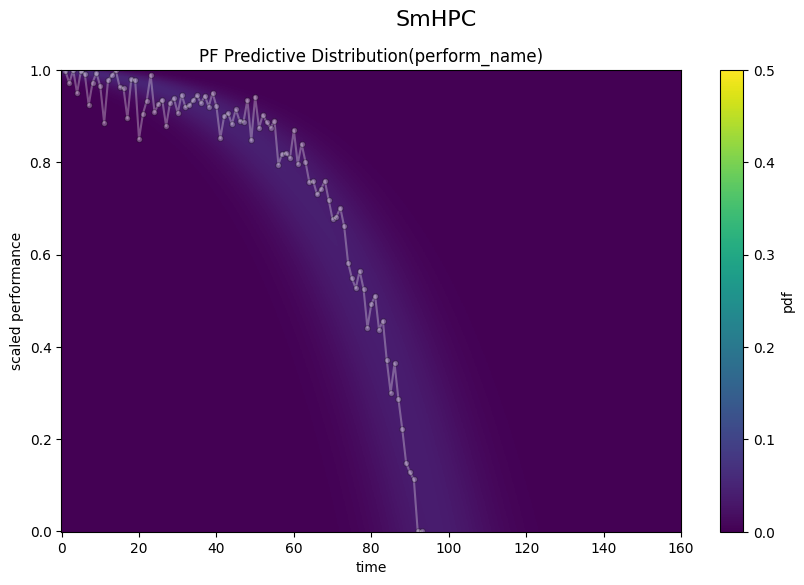

Epoch 1000, Best Loss: 1.3622654676437378
Epoch 2000, Best Loss: 1.2889924049377441
Epoch 3000, Best Loss: 1.2299553155899048
Epoch 4000, Best Loss: 1.1729850769042969
Epoch 5000, Best Loss: 1.1195812225341797
Epoch 6000, Best Loss: 1.0703550577163696
Epoch 7000, Best Loss: 1.0255017280578613
Epoch 8000, Best Loss: 0.985062301158905
Epoch 9000, Best Loss: 0.9491210579872131
Epoch 10000, Best Loss: 0.9176231622695923
Epoch 11000, Best Loss: 0.8905724287033081
Epoch 12000, Best Loss: 0.867941677570343
Epoch 13000, Best Loss: 0.8496923446655273
Epoch 14000, Best Loss: 0.83567875623703
Epoch 15000, Best Loss: 0.8256785273551941
Epoch 16000, Best Loss: 0.8192501068115234
Epoch 17000, Best Loss: 0.8157063722610474
Epoch 18000, Best Loss: 0.8140900135040283
Epoch 19000, Best Loss: 0.8133594393730164
Epoch 20000, Best Loss: 0.812774658203125


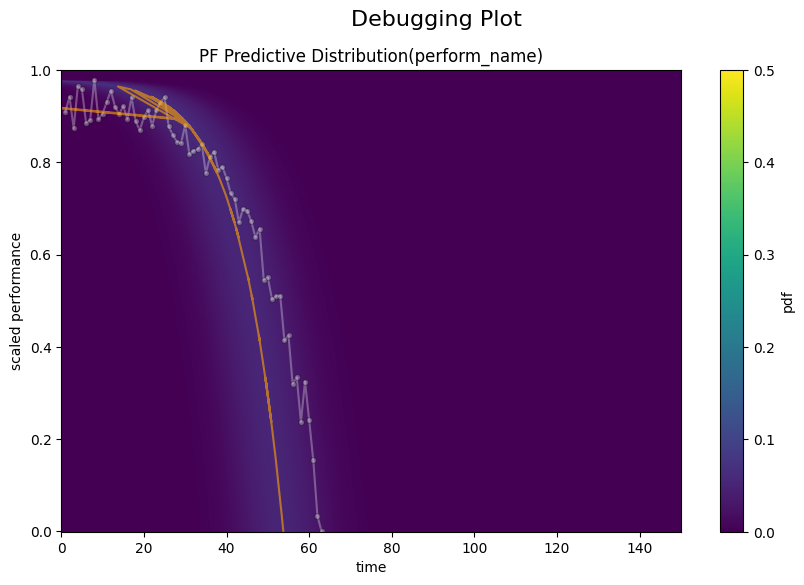

Epoch 21000, Best Loss: 0.8120614886283875
Epoch 22000, Best Loss: 0.811179518699646
Epoch 23000, Best Loss: 0.8101488947868347
Epoch 24000, Best Loss: 0.8090250492095947
Epoch 25000, Best Loss: 0.8078515529632568
Epoch 26000, Best Loss: 0.8066485524177551
Epoch 27000, Best Loss: 0.805431067943573
Epoch 28000, Best Loss: 0.8041982054710388
Epoch 29000, Best Loss: 0.8029523491859436
Epoch 30000, Best Loss: 0.8016926646232605
Epoch 31000, Best Loss: 0.8004180192947388
Epoch 32000, Best Loss: 0.7991282343864441
Epoch 33000, Best Loss: 0.7978233098983765
Epoch 34000, Best Loss: 0.7965008616447449
Epoch 35000, Best Loss: 0.7951698303222656
Epoch 36000, Best Loss: 0.793830394744873
Epoch 37000, Best Loss: 0.7924734354019165
Epoch 38000, Best Loss: 0.7910991311073303
Epoch 39000, Best Loss: 0.7897078990936279
Epoch 40000, Best Loss: 0.7882975935935974


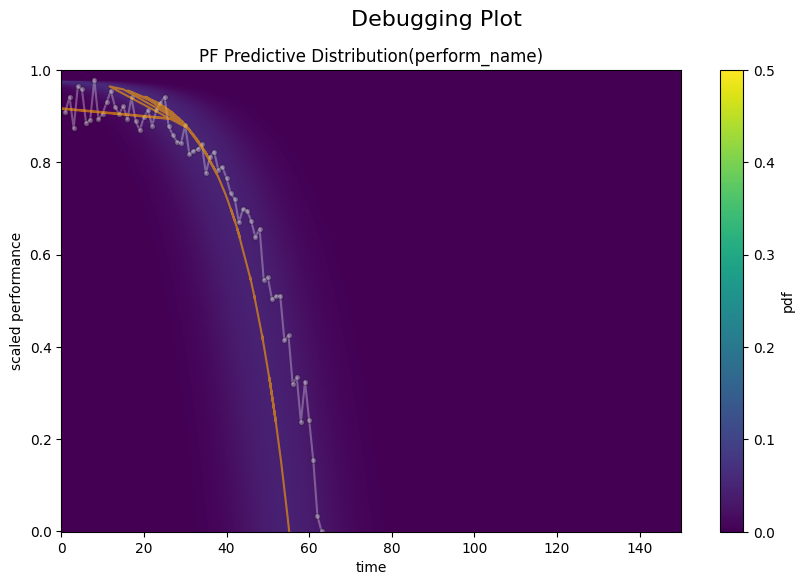

Epoch 41000, Best Loss: 0.7868673205375671
Epoch 42000, Best Loss: 0.7854181528091431
Epoch 43000, Best Loss: 0.7839473485946655
Epoch 44000, Best Loss: 0.7824580669403076
Epoch 45000, Best Loss: 0.780945360660553
Epoch 46000, Best Loss: 0.7794130444526672
Epoch 47000, Best Loss: 0.777859091758728
Epoch 48000, Best Loss: 0.7762861251831055
Epoch 49000, Best Loss: 0.7746905088424683
Epoch 50000, Best Loss: 0.7730838060379028
Epoch 51000, Best Loss: 0.7714588046073914
Epoch 52000, Best Loss: 0.7697998285293579
Epoch 53000, Best Loss: 0.7681193351745605
Epoch 54000, Best Loss: 0.7664211392402649
Epoch 55000, Best Loss: 0.7646988034248352
Epoch 56000, Best Loss: 0.7629503607749939
Epoch 57000, Best Loss: 0.7611758708953857
Epoch 58000, Best Loss: 0.7593745589256287
Epoch 59000, Best Loss: 0.7575480937957764
Epoch 60000, Best Loss: 0.7556952238082886


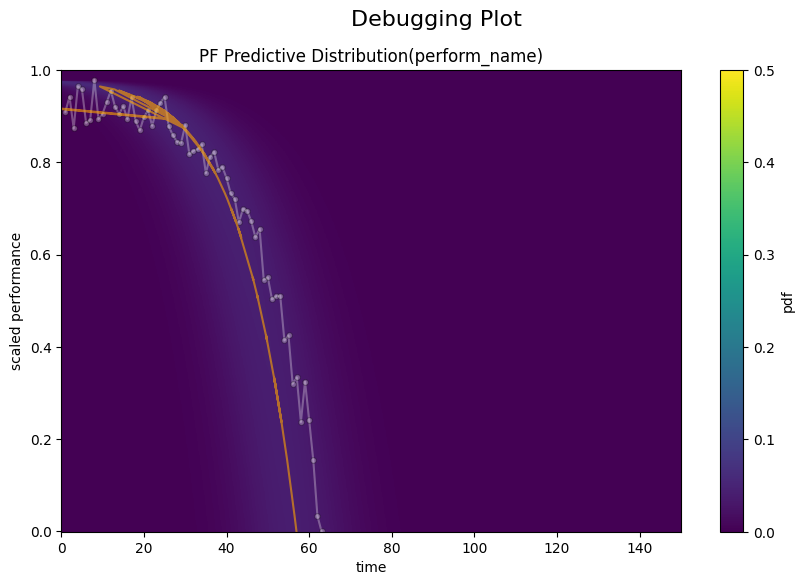

Epoch 61000, Best Loss: 0.7538149952888489
Epoch 62000, Best Loss: 0.7519073486328125
Epoch 63000, Best Loss: 0.7499728202819824
Epoch 64000, Best Loss: 0.748009979724884
Epoch 65000, Best Loss: 0.7460200190544128
Epoch 66000, Best Loss: 0.7440099716186523
Epoch 67000, Best Loss: 0.741977334022522
Epoch 68000, Best Loss: 0.7399160861968994
Epoch 69000, Best Loss: 0.7378272414207458
Epoch 70000, Best Loss: 0.7357093095779419
Epoch 71000, Best Loss: 0.7335635423660278
Epoch 72000, Best Loss: 0.7313893437385559
Epoch 73000, Best Loss: 0.72918701171875
Epoch 74000, Best Loss: 0.726955235004425
Epoch 75000, Best Loss: 0.7246953248977661
Epoch 76000, Best Loss: 0.7224066853523254
Epoch 77000, Best Loss: 0.7200897932052612
Epoch 78000, Best Loss: 0.7177445888519287
Epoch 79000, Best Loss: 0.7153693437576294
Epoch 80000, Best Loss: 0.7129662036895752


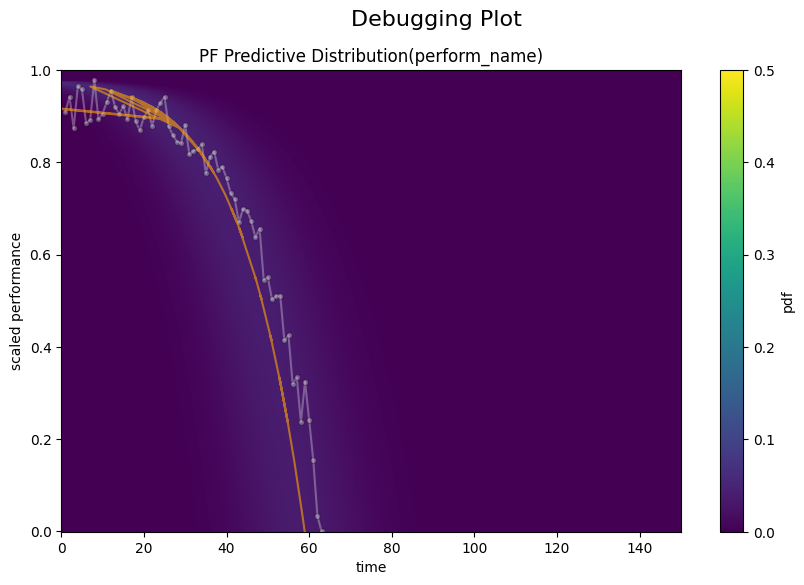

Epoch 81000, Best Loss: 0.7105355262756348
Epoch 82000, Best Loss: 0.7080770134925842
Epoch 83000, Best Loss: 0.7055909037590027
Epoch 84000, Best Loss: 0.7030782699584961
Epoch 85000, Best Loss: 0.700538694858551
Epoch 86000, Best Loss: 0.6979727745056152
Epoch 87000, Best Loss: 0.6953908205032349
Epoch 88000, Best Loss: 0.6927914619445801
Epoch 89000, Best Loss: 0.6901676654815674
Epoch 90000, Best Loss: 0.6875193119049072
Epoch 91000, Best Loss: 0.6848474740982056
Epoch 92000, Best Loss: 0.6821523904800415
Epoch 93000, Best Loss: 0.6794348359107971
Epoch 94000, Best Loss: 0.6766951084136963
Epoch 95000, Best Loss: 0.6739348769187927
Epoch 96000, Best Loss: 0.6711536049842834
Epoch 97000, Best Loss: 0.6683528423309326
Epoch 98000, Best Loss: 0.6655333638191223
Epoch 99000, Best Loss: 0.6626959443092346
Best value: 0.659844160079956
Best parameters: {'p': 8.288695335388184, 'mu': 78.39969635009766, 'a': 0.9789537525391705, 'mean': 139.46275329589844, 'var': 141.61277770996094}


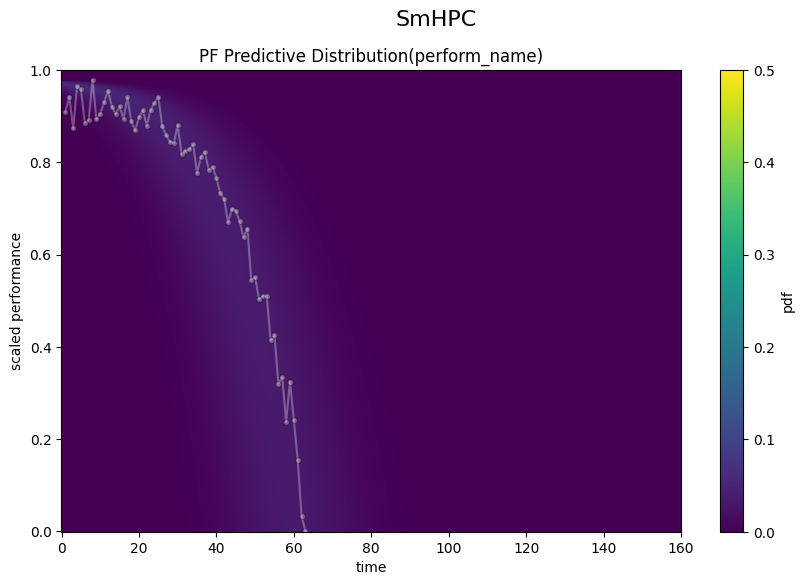

Epoch 1000, Best Loss: 0.7535545825958252
Epoch 2000, Best Loss: 0.7134105563163757
Epoch 3000, Best Loss: 0.6810018420219421
Epoch 4000, Best Loss: 0.6528348326683044
Epoch 5000, Best Loss: 0.6255927681922913
Epoch 6000, Best Loss: 0.5988258719444275
Epoch 7000, Best Loss: 0.5711678266525269
Epoch 8000, Best Loss: 0.5432383418083191
Epoch 9000, Best Loss: 0.5153741836547852
Epoch 10000, Best Loss: 0.48789680004119873
Epoch 11000, Best Loss: 0.4611532390117645
Epoch 12000, Best Loss: 0.43699052929878235
Epoch 13000, Best Loss: 0.4206359088420868
Epoch 14000, Best Loss: 0.4147559106349945
Epoch 15000, Best Loss: 0.41402605175971985
Epoch 16000, Best Loss: 0.4139464199542999
Epoch 17000, Best Loss: 0.4138716757297516
Epoch 18000, Best Loss: 0.41379690170288086
Epoch 19000, Best Loss: 0.4137204587459564
Epoch 20000, Best Loss: 0.4136469066143036


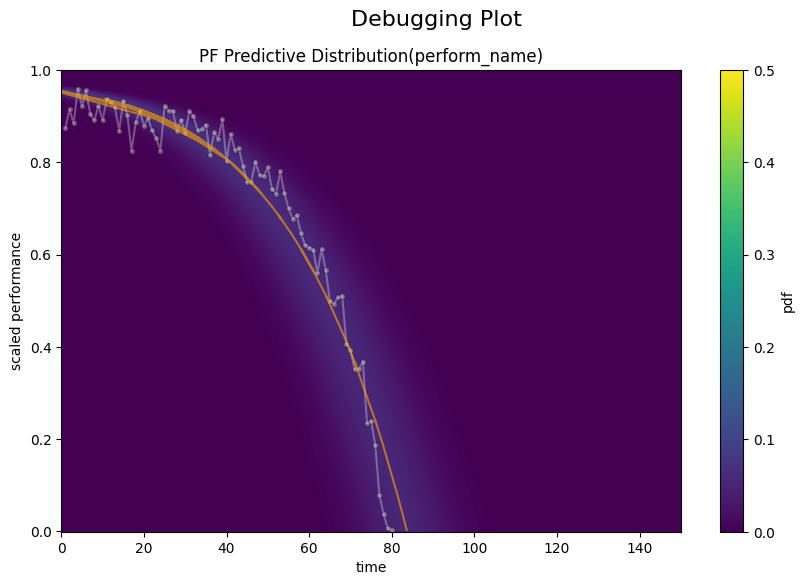

Epoch 21000, Best Loss: 0.41357502341270447
Epoch 22000, Best Loss: 0.41350582242012024
Epoch 23000, Best Loss: 0.4134388864040375
Epoch 24000, Best Loss: 0.41337379813194275
Epoch 25000, Best Loss: 0.4133108854293823
Epoch 26000, Best Loss: 0.41325029730796814
Epoch 27000, Best Loss: 0.4131909906864166
Epoch 28000, Best Loss: 0.4131337106227875
Epoch 29000, Best Loss: 0.4130789041519165
Epoch 30000, Best Loss: 0.4130241274833679
Epoch 31000, Best Loss: 0.41297250986099243
Epoch 32000, Best Loss: 0.4129212498664856
Epoch 33000, Best Loss: 0.4128720462322235
Epoch 34000, Best Loss: 0.41282451152801514
Epoch 35000, Best Loss: 0.41277754306793213
Epoch 36000, Best Loss: 0.4127323031425476
Epoch 37000, Best Loss: 0.41268831491470337
Epoch 38000, Best Loss: 0.41264545917510986
Epoch 39000, Best Loss: 0.4126034677028656
Epoch 40000, Best Loss: 0.4125624895095825


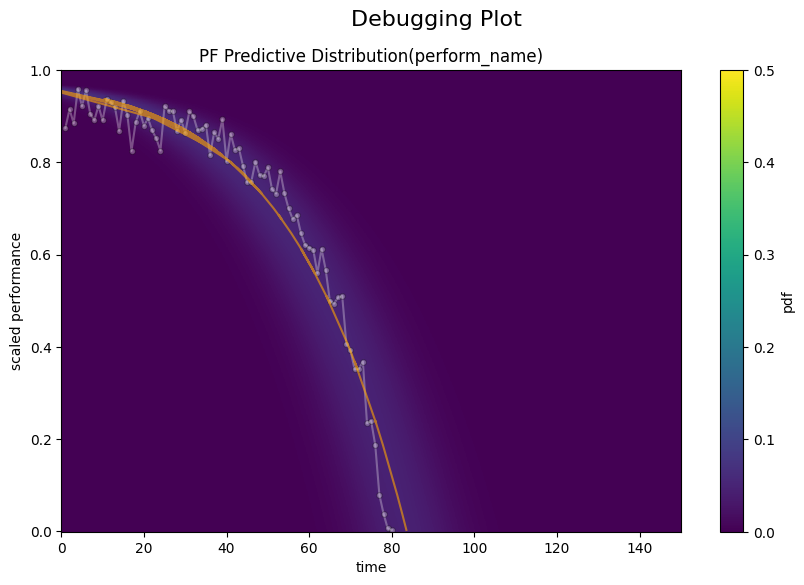

Epoch 41000, Best Loss: 0.412523090839386
Epoch 42000, Best Loss: 0.4124845564365387
Epoch 43000, Best Loss: 0.4124467670917511
Epoch 44000, Best Loss: 0.4124099016189575
Epoch 45000, Best Loss: 0.41237324476242065
Epoch 46000, Best Loss: 0.41233712434768677
Epoch 47000, Best Loss: 0.4123014211654663
Epoch 48000, Best Loss: 0.41226616501808167
Epoch 49000, Best Loss: 0.4122314751148224
Epoch 50000, Best Loss: 0.4121968448162079
Epoch 51000, Best Loss: 0.4121623933315277
Epoch 52000, Best Loss: 0.4121288061141968
Epoch 53000, Best Loss: 0.41209545731544495
Epoch 54000, Best Loss: 0.41206178069114685
Epoch 55000, Best Loss: 0.41202887892723083
Epoch 56000, Best Loss: 0.41199633479118347
Epoch 57000, Best Loss: 0.4119642972946167
Epoch 58000, Best Loss: 0.41193199157714844
Epoch 59000, Best Loss: 0.4119006395339966
Epoch 60000, Best Loss: 0.41186946630477905


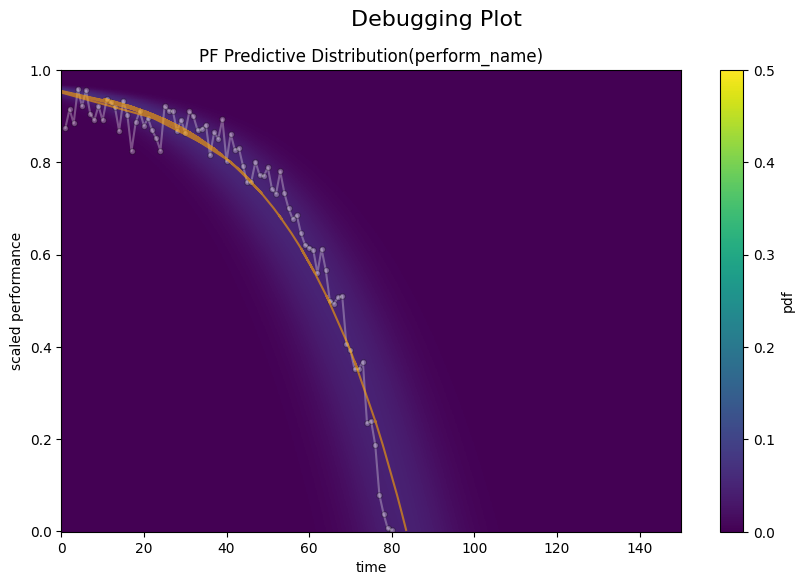

Epoch 61000, Best Loss: 0.411838173866272
Epoch 62000, Best Loss: 0.4118075370788574
Epoch 63000, Best Loss: 0.4117767810821533
Epoch 64000, Best Loss: 0.411747008562088
Epoch 65000, Best Loss: 0.41171661019325256
Epoch 66000, Best Loss: 0.41168704628944397
Epoch 67000, Best Loss: 0.41165775060653687
Epoch 68000, Best Loss: 0.41162800788879395
Epoch 69000, Best Loss: 0.4115995168685913
Epoch 70000, Best Loss: 0.4115706980228424
Epoch 71000, Best Loss: 0.4115425646305084
Epoch 72000, Best Loss: 0.4115142226219177
Epoch 73000, Best Loss: 0.4114864468574524
Epoch 74000, Best Loss: 0.41145893931388855
Epoch 75000, Best Loss: 0.4114316701889038
Epoch 76000, Best Loss: 0.4114041030406952
Epoch 77000, Best Loss: 0.4113771319389343
Epoch 78000, Best Loss: 0.4113503098487854
Epoch 79000, Best Loss: 0.4113244116306305
Epoch 80000, Best Loss: 0.41129809617996216


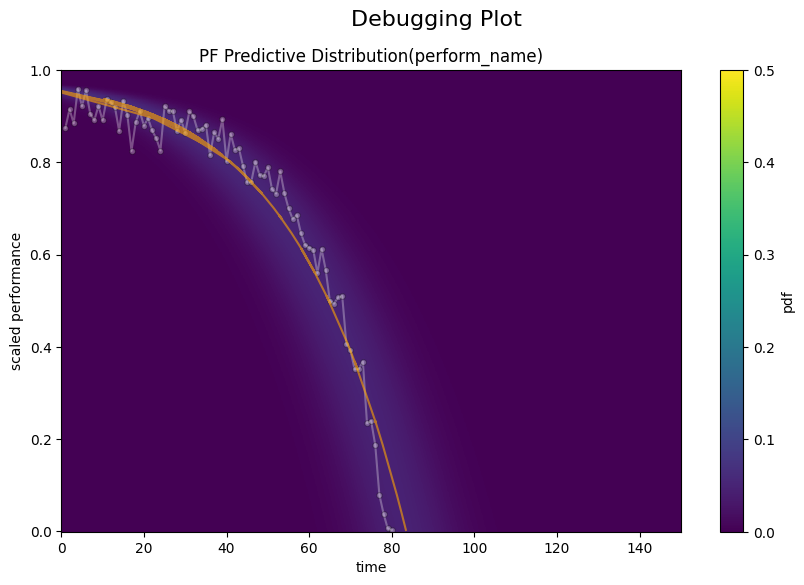

Epoch 81000, Best Loss: 0.41127192974090576
Epoch 82000, Best Loss: 0.4112464189529419
Epoch 83000, Best Loss: 0.41122114658355713
Epoch 84000, Best Loss: 0.41119545698165894
Epoch 85000, Best Loss: 0.4111701250076294
Epoch 86000, Best Loss: 0.4111453890800476
Epoch 87000, Best Loss: 0.4111204743385315
Epoch 88000, Best Loss: 0.41109588742256165
Epoch 89000, Best Loss: 0.41107168793678284
Epoch 90000, Best Loss: 0.41104745864868164
Epoch 91000, Best Loss: 0.4110242426395416
Epoch 92000, Best Loss: 0.4110002815723419
Epoch 93000, Best Loss: 0.41097643971443176
Epoch 94000, Best Loss: 0.41095325350761414
Epoch 95000, Best Loss: 0.41093021631240845
Epoch 96000, Best Loss: 0.41090747714042664
Epoch 97000, Best Loss: 0.4108846187591553
Epoch 98000, Best Loss: 0.41086167097091675
Epoch 99000, Best Loss: 0.41083982586860657
Best value: 0.4108172357082367
Best parameters: {'p': 11.476766586303711, 'mu': 226.5051727294922, 'a': 0.9817668492678356, 'mean': 310.4617919921875, 'var': 72.9053344726

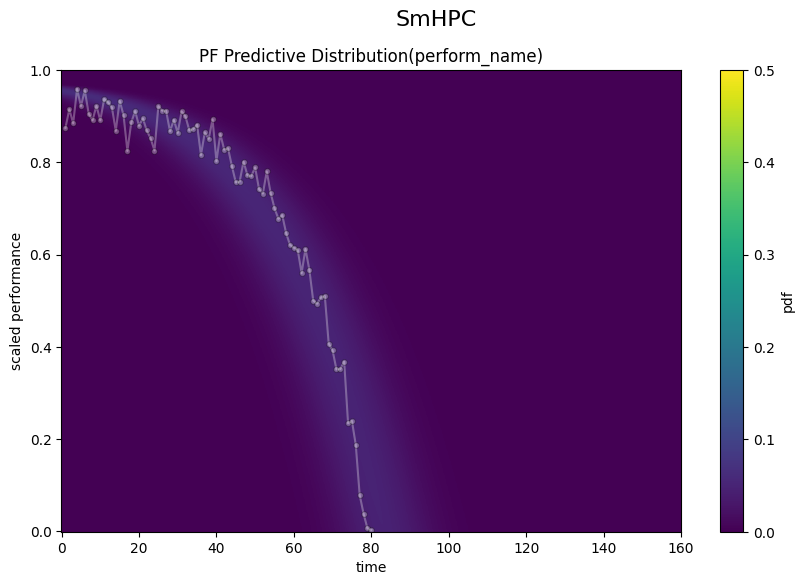

Epoch 1000, Best Loss: 1.1162512302398682
Epoch 2000, Best Loss: 1.0704662799835205
Epoch 3000, Best Loss: 1.0284299850463867
Epoch 4000, Best Loss: 0.9899798631668091
Epoch 5000, Best Loss: 0.9557130336761475
Epoch 6000, Best Loss: 0.9259796142578125
Epoch 7000, Best Loss: 0.9007428288459778
Epoch 8000, Best Loss: 0.8798713684082031
Epoch 9000, Best Loss: 0.8632539510726929
Epoch 10000, Best Loss: 0.8506546020507812
Epoch 11000, Best Loss: 0.8417432308197021
Epoch 12000, Best Loss: 0.8360584378242493
Epoch 13000, Best Loss: 0.8329195380210876
Epoch 14000, Best Loss: 0.8314067721366882
Epoch 15000, Best Loss: 0.8305299878120422
Epoch 16000, Best Loss: 0.829643189907074
Epoch 17000, Best Loss: 0.8285682201385498
Epoch 18000, Best Loss: 0.8273069262504578
Epoch 19000, Best Loss: 0.8259092569351196
Epoch 20000, Best Loss: 0.8244444727897644


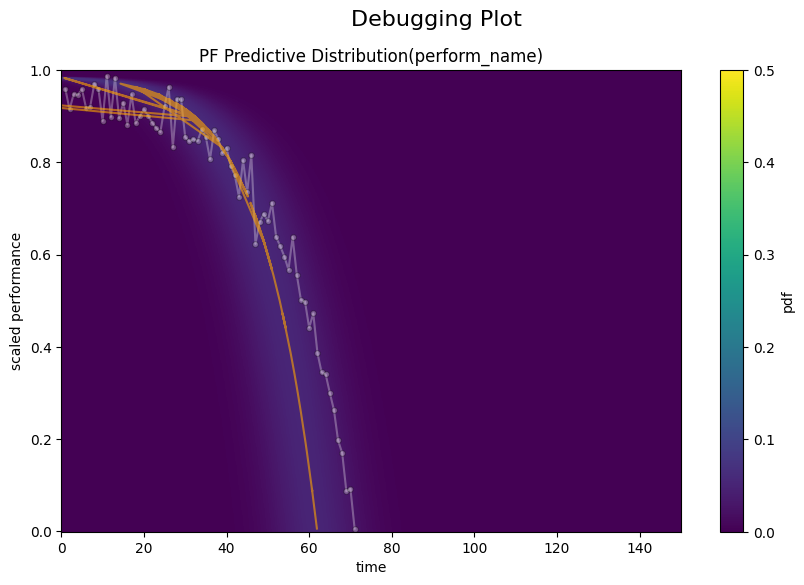

Epoch 21000, Best Loss: 0.8229418992996216
Epoch 22000, Best Loss: 0.8214186429977417
Epoch 23000, Best Loss: 0.8198850750923157
Epoch 24000, Best Loss: 0.8183395266532898
Epoch 25000, Best Loss: 0.8167818188667297
Epoch 26000, Best Loss: 0.81521075963974
Epoch 27000, Best Loss: 0.8136293888092041
Epoch 28000, Best Loss: 0.8120445013046265
Epoch 29000, Best Loss: 0.8104504942893982
Epoch 30000, Best Loss: 0.8088434338569641
Epoch 31000, Best Loss: 0.8072229623794556
Epoch 32000, Best Loss: 0.8055893182754517
Epoch 33000, Best Loss: 0.8039394617080688
Epoch 34000, Best Loss: 0.8022755980491638
Epoch 35000, Best Loss: 0.8005954623222351
Epoch 36000, Best Loss: 0.7989000678062439
Epoch 37000, Best Loss: 0.797187328338623
Epoch 38000, Best Loss: 0.7954577207565308
Epoch 39000, Best Loss: 0.7937197089195251
Epoch 40000, Best Loss: 0.7919659614562988


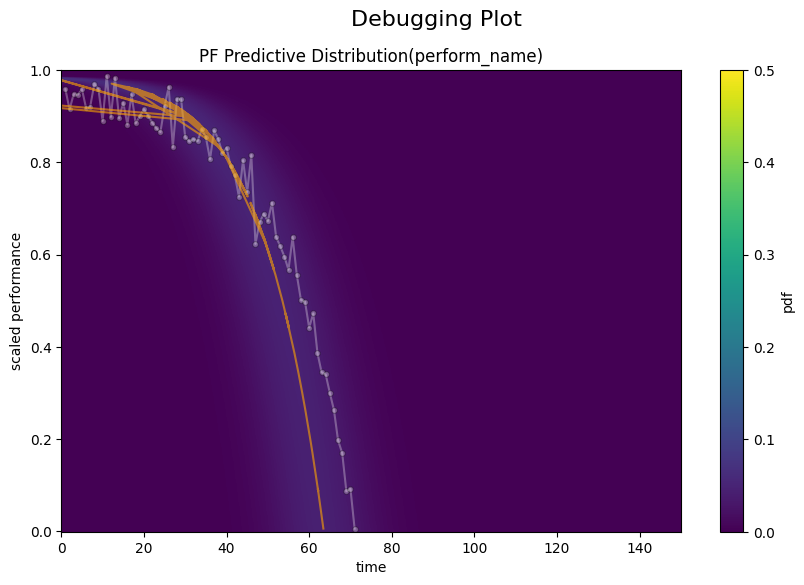

Epoch 41000, Best Loss: 0.7902000546455383
Epoch 42000, Best Loss: 0.7884187698364258
Epoch 43000, Best Loss: 0.7866178750991821
Epoch 44000, Best Loss: 0.784801185131073
Epoch 45000, Best Loss: 0.7829660177230835
Epoch 46000, Best Loss: 0.7811118960380554
Epoch 47000, Best Loss: 0.7792389988899231
Epoch 48000, Best Loss: 0.7773473858833313
Epoch 49000, Best Loss: 0.7754359841346741
Epoch 50000, Best Loss: 0.7735047936439514
Epoch 51000, Best Loss: 0.7715542316436768
Epoch 52000, Best Loss: 0.7695828676223755
Epoch 53000, Best Loss: 0.767596960067749
Epoch 54000, Best Loss: 0.7655940651893616
Epoch 55000, Best Loss: 0.7635748386383057
Epoch 56000, Best Loss: 0.7615365982055664
Epoch 57000, Best Loss: 0.7594776749610901
Epoch 58000, Best Loss: 0.7573968172073364
Epoch 59000, Best Loss: 0.7552945017814636
Epoch 60000, Best Loss: 0.7531725764274597


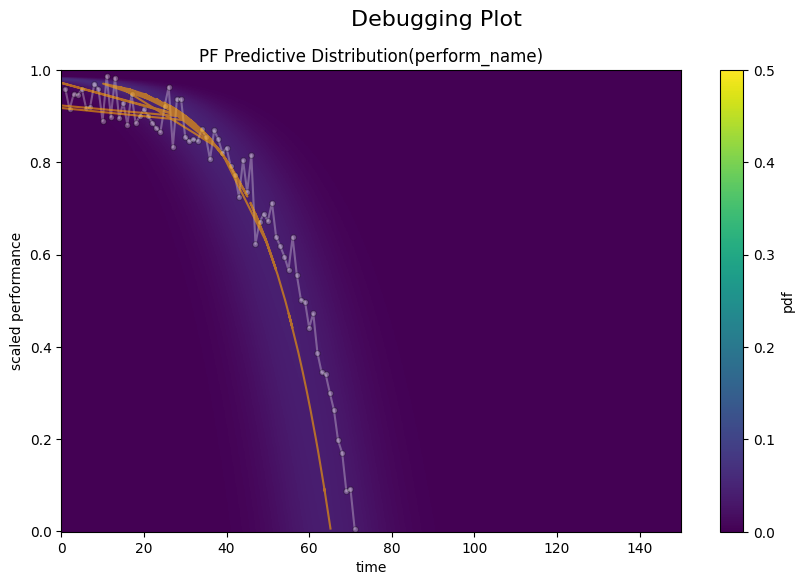

Epoch 61000, Best Loss: 0.7510297298431396
Epoch 62000, Best Loss: 0.7488674521446228
Epoch 63000, Best Loss: 0.7466838955879211
Epoch 64000, Best Loss: 0.7444804906845093
Epoch 65000, Best Loss: 0.742256760597229
Epoch 66000, Best Loss: 0.7400128841400146
Epoch 67000, Best Loss: 0.7377496361732483
Epoch 68000, Best Loss: 0.735465943813324
Epoch 69000, Best Loss: 0.7331634759902954
Epoch 70000, Best Loss: 0.7308434844017029
Epoch 71000, Best Loss: 0.7285169363021851
Epoch 72000, Best Loss: 0.7261720299720764
Epoch 73000, Best Loss: 0.7238081693649292
Epoch 74000, Best Loss: 0.7214272618293762
Epoch 75000, Best Loss: 0.7190276980400085
Epoch 76000, Best Loss: 0.7166107296943665
Epoch 77000, Best Loss: 0.7141768336296082
Epoch 78000, Best Loss: 0.7117259502410889
Epoch 79000, Best Loss: 0.7092587351799011
Epoch 80000, Best Loss: 0.7067755460739136


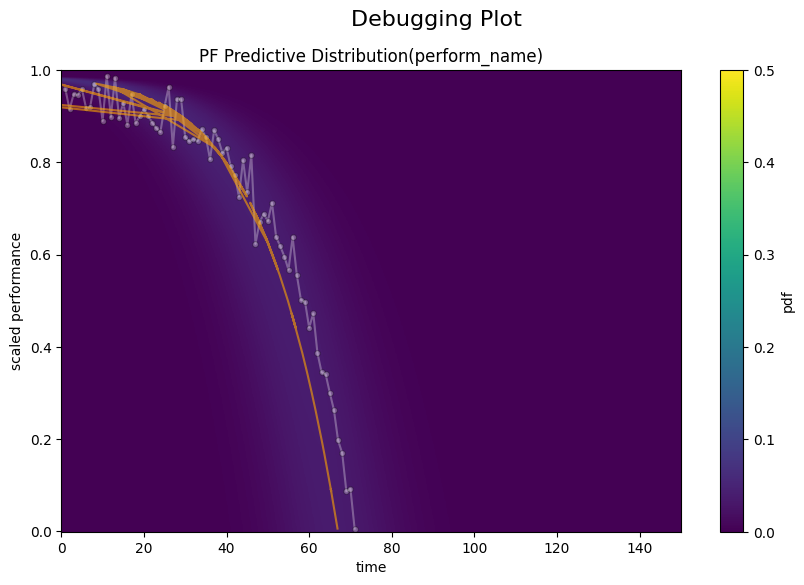

Epoch 81000, Best Loss: 0.7042766213417053
Epoch 82000, Best Loss: 0.7017630934715271
Epoch 83000, Best Loss: 0.6992350220680237
Epoch 84000, Best Loss: 0.6966928839683533
Epoch 85000, Best Loss: 0.6941375136375427
Epoch 86000, Best Loss: 0.691569447517395
Epoch 87000, Best Loss: 0.6889871954917908
Epoch 88000, Best Loss: 0.686393678188324
Epoch 89000, Best Loss: 0.6837893724441528
Epoch 90000, Best Loss: 0.6811755895614624
Epoch 91000, Best Loss: 0.6785523295402527
Epoch 92000, Best Loss: 0.6759209036827087
Epoch 93000, Best Loss: 0.6732984185218811
Epoch 94000, Best Loss: 0.6706711053848267
Epoch 95000, Best Loss: 0.6680384278297424
Epoch 96000, Best Loss: 0.665401041507721
Epoch 97000, Best Loss: 0.662760317325592
Epoch 98000, Best Loss: 0.6601173877716064
Epoch 99000, Best Loss: 0.657473087310791
Best value: 0.6548313498497009
Best parameters: {'p': 7.120035648345947, 'mu': 70.18913269042969, 'a': 0.9866946066880621, 'mean': 138.82098388671875, 'var': 142.2568359375}


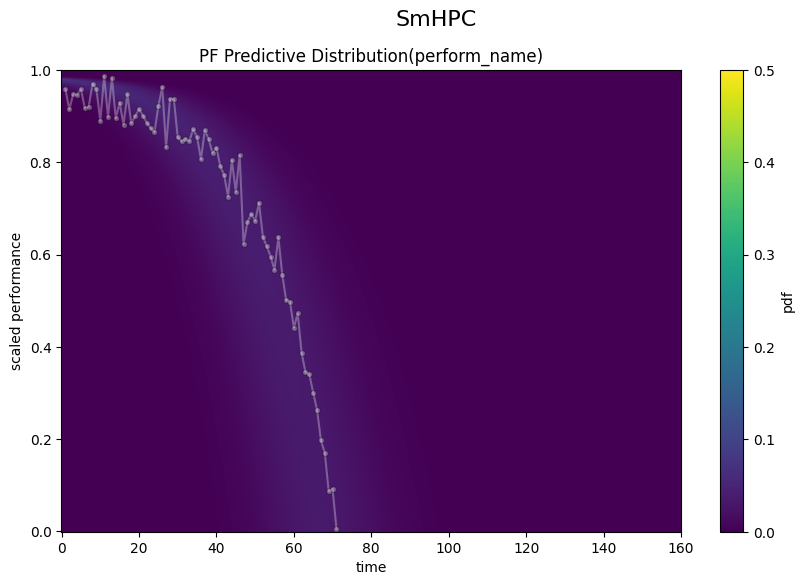

Epoch 1000, Best Loss: 0.7838533520698547
Epoch 2000, Best Loss: 0.7792255878448486
Epoch 3000, Best Loss: 0.776089608669281
Epoch 4000, Best Loss: 0.7740993499755859
Epoch 5000, Best Loss: 0.7724427580833435
Epoch 6000, Best Loss: 0.7706434726715088
Epoch 7000, Best Loss: 0.7686312198638916
Epoch 8000, Best Loss: 0.7664893865585327
Epoch 9000, Best Loss: 0.7642814517021179
Epoch 10000, Best Loss: 0.762056827545166
Epoch 11000, Best Loss: 0.7598385810852051
Epoch 12000, Best Loss: 0.7576202154159546
Epoch 13000, Best Loss: 0.7554230093955994
Epoch 14000, Best Loss: 0.7532387971878052
Epoch 15000, Best Loss: 0.7510659694671631
Epoch 16000, Best Loss: 0.7489013671875
Epoch 17000, Best Loss: 0.7467447519302368
Epoch 18000, Best Loss: 0.7445905804634094
Epoch 19000, Best Loss: 0.7424461841583252
Epoch 20000, Best Loss: 0.7403085231781006


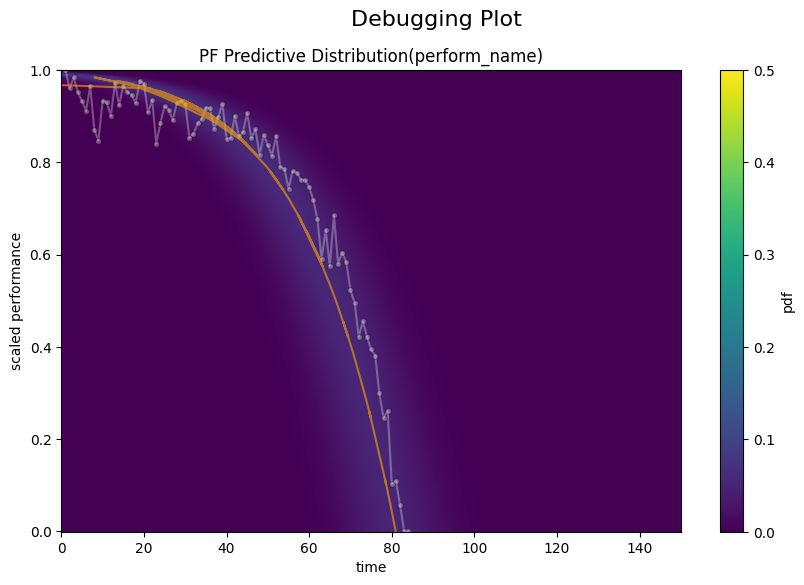

Epoch 21000, Best Loss: 0.738183319568634
Epoch 22000, Best Loss: 0.7360622882843018
Epoch 23000, Best Loss: 0.7339464426040649
Epoch 24000, Best Loss: 0.7318358421325684
Epoch 25000, Best Loss: 0.729730486869812
Epoch 26000, Best Loss: 0.7276366949081421
Epoch 27000, Best Loss: 0.7255474328994751
Epoch 28000, Best Loss: 0.723462700843811
Epoch 29000, Best Loss: 0.7213811874389648
Epoch 30000, Best Loss: 0.7193028926849365
Epoch 31000, Best Loss: 0.7172394394874573
Epoch 32000, Best Loss: 0.7151805758476257
Epoch 33000, Best Loss: 0.7131254076957703
Epoch 34000, Best Loss: 0.7110740542411804
Epoch 35000, Best Loss: 0.7090247869491577
Epoch 36000, Best Loss: 0.706981360912323
Epoch 37000, Best Loss: 0.7049407362937927
Epoch 38000, Best Loss: 0.7029029726982117
Epoch 39000, Best Loss: 0.7008782029151917
Epoch 40000, Best Loss: 0.6988599896430969


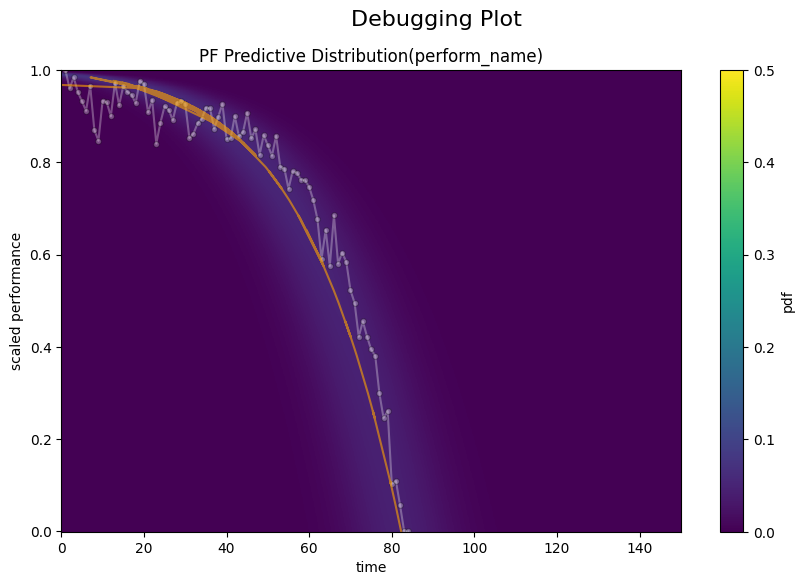

Epoch 41000, Best Loss: 0.6968448162078857
Epoch 42000, Best Loss: 0.6948350071907043
Epoch 43000, Best Loss: 0.6928278803825378
Epoch 44000, Best Loss: 0.6908214092254639
Epoch 45000, Best Loss: 0.6888211369514465
Epoch 46000, Best Loss: 0.6868252754211426
Epoch 47000, Best Loss: 0.6848346590995789
Epoch 48000, Best Loss: 0.6828497052192688
Epoch 49000, Best Loss: 0.6808699369430542
Epoch 50000, Best Loss: 0.6788967847824097
Epoch 51000, Best Loss: 0.6769335865974426
Epoch 52000, Best Loss: 0.6749842762947083
Epoch 53000, Best Loss: 0.6730415225028992
Epoch 54000, Best Loss: 0.6711061596870422
Epoch 55000, Best Loss: 0.6691777110099792
Epoch 56000, Best Loss: 0.6672579646110535
Epoch 57000, Best Loss: 0.6653466820716858
Epoch 58000, Best Loss: 0.6634436845779419
Epoch 59000, Best Loss: 0.6615503430366516
Epoch 60000, Best Loss: 0.6596667170524597


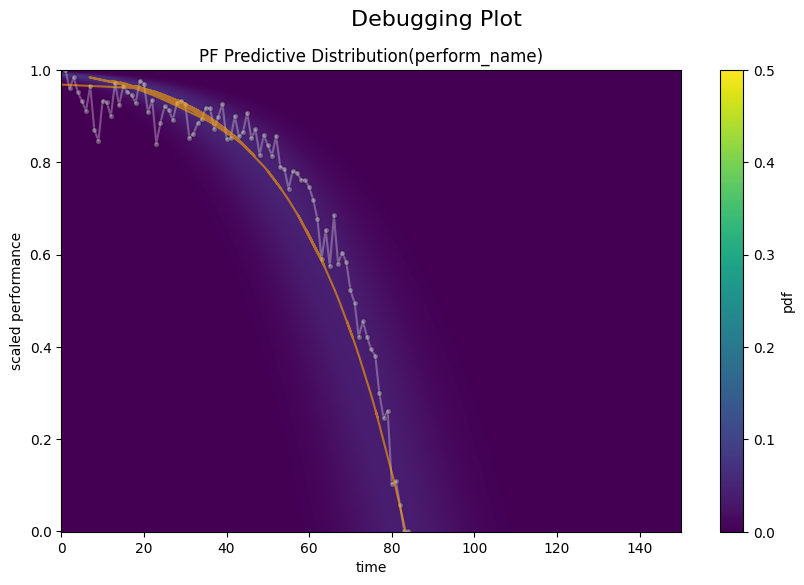

Epoch 61000, Best Loss: 0.6577926874160767
Epoch 62000, Best Loss: 0.6559300422668457
Epoch 63000, Best Loss: 0.6540777683258057
Epoch 64000, Best Loss: 0.6522372364997864
Epoch 65000, Best Loss: 0.6504152417182922
Epoch 66000, Best Loss: 0.6486102342605591
Epoch 67000, Best Loss: 0.6468184590339661
Epoch 68000, Best Loss: 0.6450403928756714
Epoch 69000, Best Loss: 0.6432766914367676
Epoch 70000, Best Loss: 0.641527533531189
Epoch 71000, Best Loss: 0.6397944688796997
Epoch 72000, Best Loss: 0.638077437877655
Epoch 73000, Best Loss: 0.6363775730133057
Epoch 74000, Best Loss: 0.6346952319145203
Epoch 75000, Best Loss: 0.6330313682556152
Epoch 76000, Best Loss: 0.6313949227333069
Epoch 77000, Best Loss: 0.6297786831855774
Epoch 78000, Best Loss: 0.6281831860542297
Epoch 79000, Best Loss: 0.6266082525253296
Epoch 80000, Best Loss: 0.6250556111335754


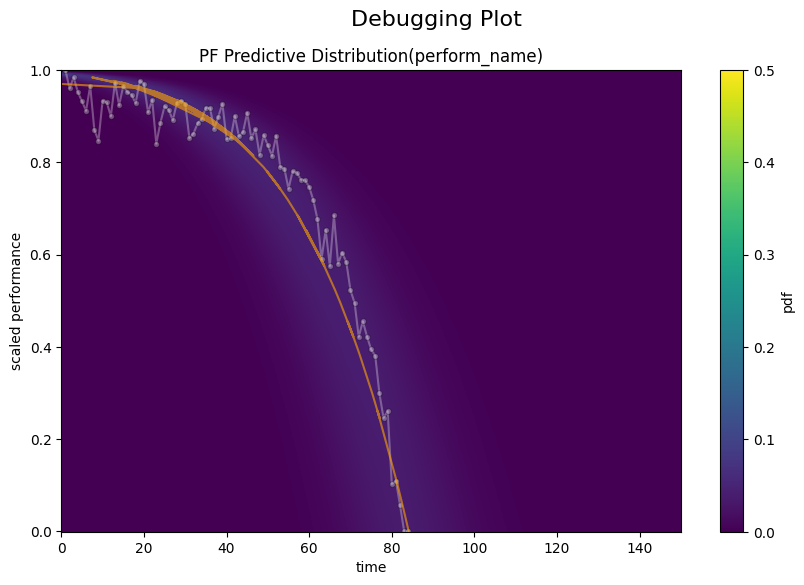

Epoch 81000, Best Loss: 0.6235253810882568
Epoch 82000, Best Loss: 0.6220167875289917
Epoch 83000, Best Loss: 0.6205366849899292
Epoch 84000, Best Loss: 0.619084358215332
Epoch 85000, Best Loss: 0.6176589727401733
Epoch 86000, Best Loss: 0.6162620782852173
Epoch 87000, Best Loss: 0.614892840385437
Epoch 88000, Best Loss: 0.6135542392730713
Epoch 89000, Best Loss: 0.6122481822967529
Epoch 90000, Best Loss: 0.6109732985496521
Epoch 91000, Best Loss: 0.6097314357757568
Epoch 92000, Best Loss: 0.6085227131843567
Epoch 93000, Best Loss: 0.6073488593101501
Epoch 94000, Best Loss: 0.6062100529670715
Epoch 95000, Best Loss: 0.6051072478294373
Epoch 96000, Best Loss: 0.6040414571762085
Epoch 97000, Best Loss: 0.6030139923095703
Epoch 98000, Best Loss: 0.6020249724388123
Epoch 99000, Best Loss: 0.601075291633606
Best value: 0.600166916847229
Best parameters: {'p': 5.1274638175964355, 'mu': 51.837039947509766, 'a': 1.0000000000514946, 'mean': 136.28488159179688, 'var': 143.21054077148438}


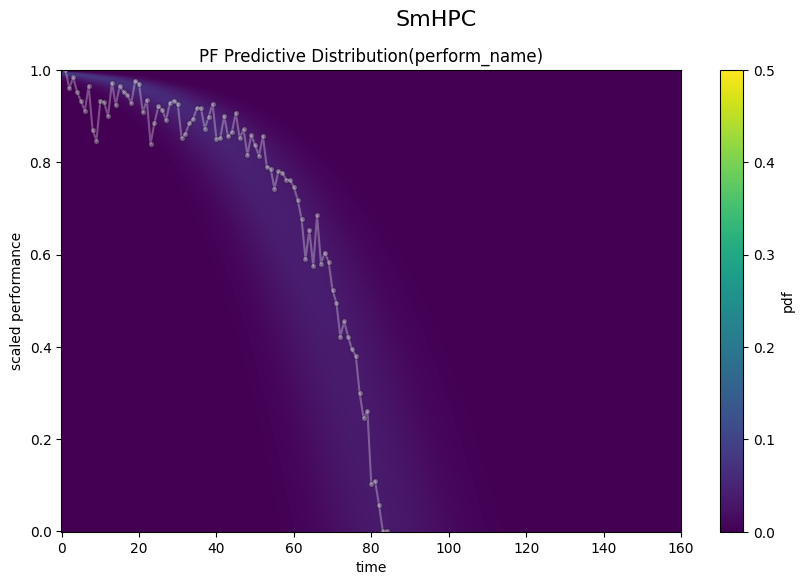

In [8]:
resolution=1024
t_end=160
s = np.linspace(0,1,resolution)
t = np.linspace(0,t_end,resolution)


colors = plt.get_cmap('tab10') 
perform_states={}
perform_train_interp={}
for name,units_perform in performs_train.items():
    states =[]
    perform_interp = []
    for unit,perform in units_perform.items():
        t_train=time_train[unit]
        data=t_train,perform
        model=DistModel(max_s=max(perform))
        criterion=CombinedGammaLoss(seq_len=len(t_train), nll_scale=1,mse_scale=1,mse_alpha=0.50) #scale weighted towards end
        best_model=fit(model,data,criterion,lr=0.001,n_epochs=100000)
        state = np.array(list(best_model.get_parameters(as_float=True))) 
        ParticleFilter.plot_states(
                np.stack(state[np.newaxis,:],axis=0),
                t_end,
                t_train,
                perform,
                multiply_level=None,
                n_particles=None,
                title=name,
                resolution=1024)
        plt.show()
        states.append(state)
        perform_interp.append(data[0])
    perform_states[name]=np.stack(states)
    perform_train_interp[name]=perform_interp

In [9]:
perform_train_interp={}
for j, (name,units_perform) in enumerate(performs_train.items()):
    if j==0: time_train_interp = []
    perform_interp = []
    for unit,perform in enumerate(units_perform):
        t_interp,s_interp=interpolate(time_train[unit],perform,n_points=20,tilt=3)
        data=s_interp,t_interp
        if j==0: time_train_interp.append(data[1])
        perform_interp.append(data[0])
    perform_train_interp[name]=perform_interp

KeyError: 0

## Save

In [ ]:
with open(f'{exp}/states.pkl', 'wb') as f:
    dump(perform_states,f)
    
with open(f'{exp}/states_data_interp.pkl', 'wb') as f:
    dump((time_train_interp,perform_train_interp),f)

## Load already learned states.

In [ ]:
with open(f'data/{dataset_name}/time_train.pkl', 'rb') as file:
    time_train = load(file)
        
with open(f'data/{dataset_name}/performs_train.pkl', 'rb') as file:
    performs_train  = load(file)
    
with open(f'{exp}/states.pkl', 'rb') as f:
    perform_states=load(f)
    
with open(f'{exp}/states_data_interp.pkl', 'rb') as f:
    states_data_interp = load(f)
time_train_interp,perform_train_interp = states_data_interp

## Show States

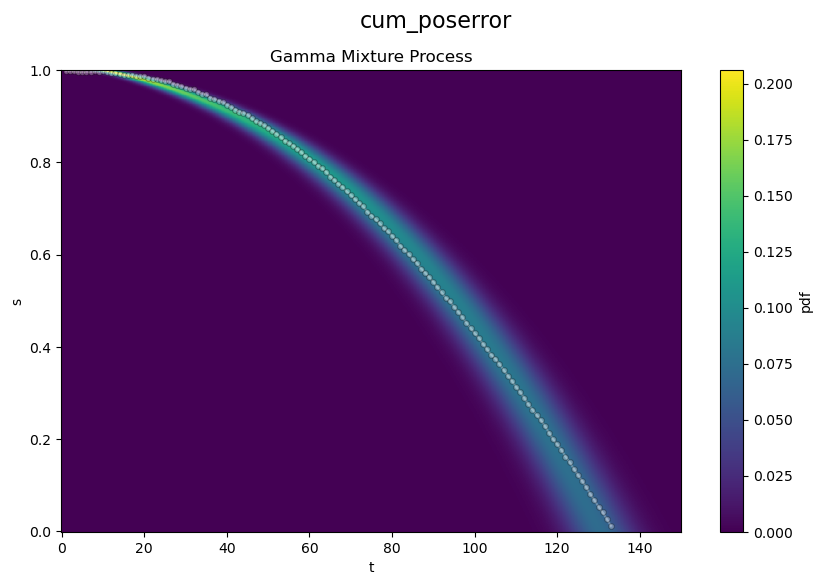

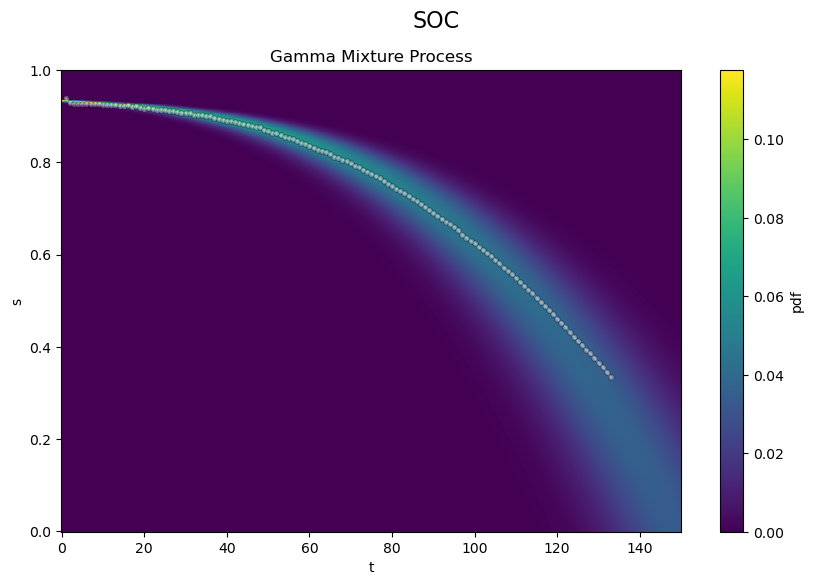

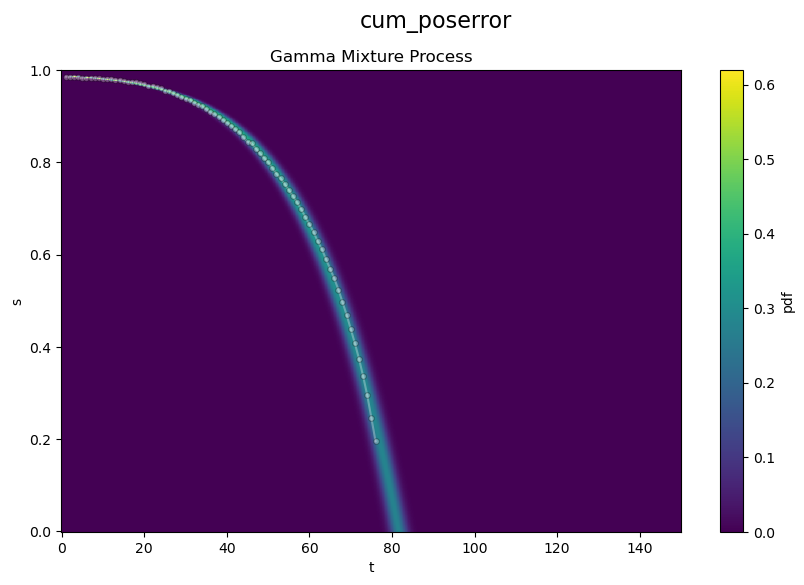

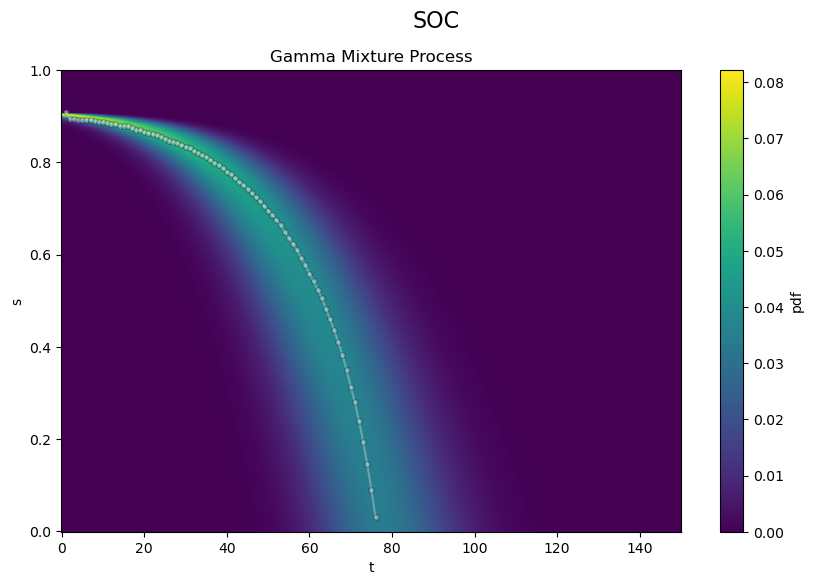

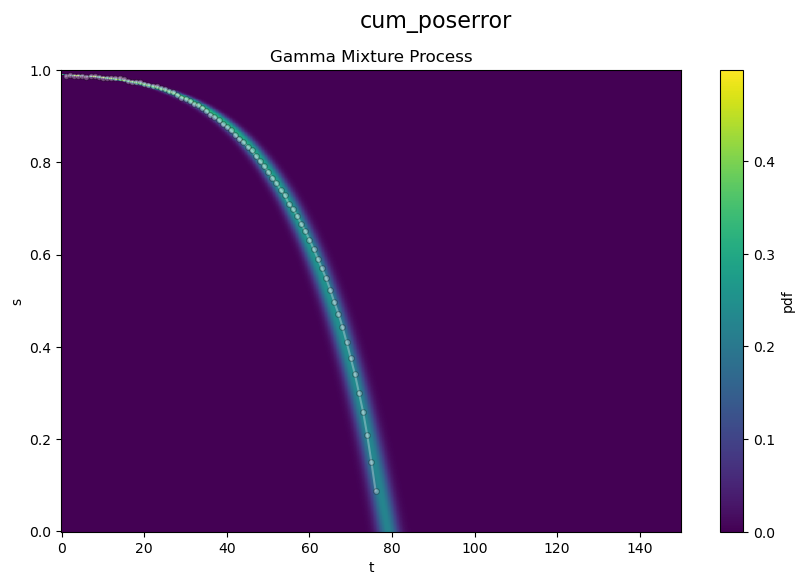

...

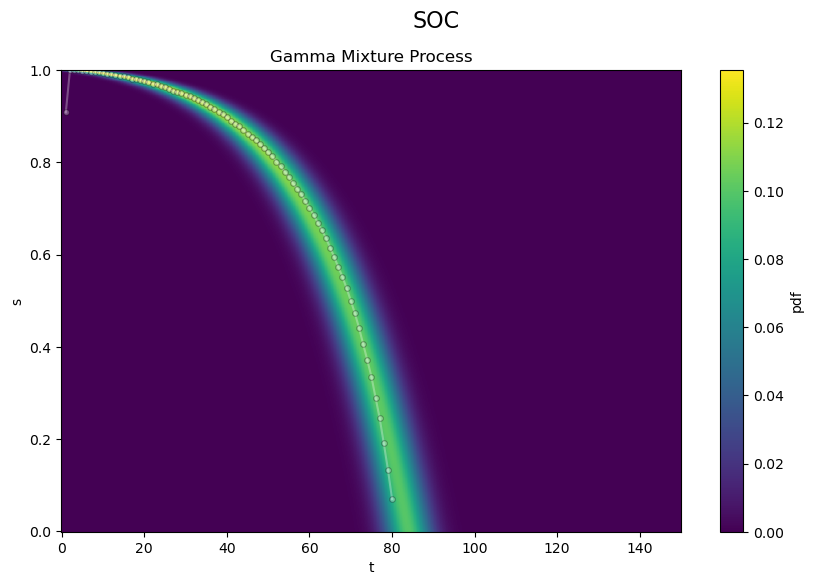

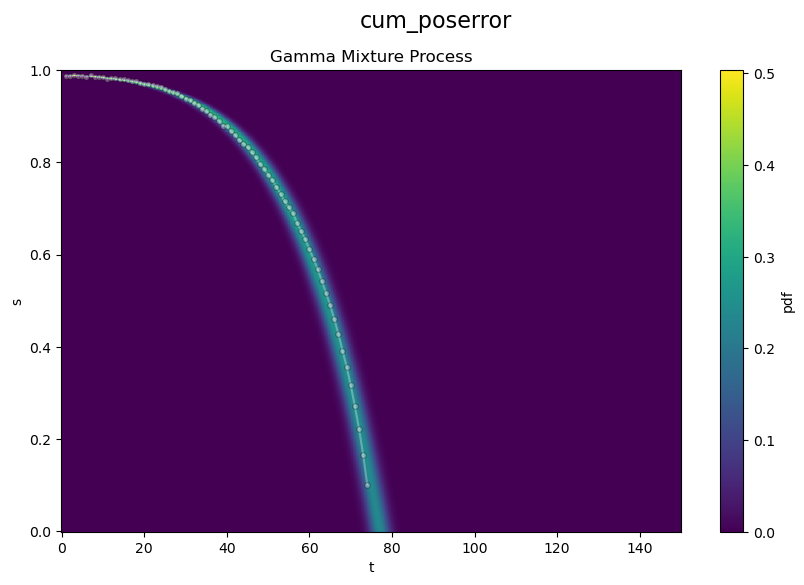

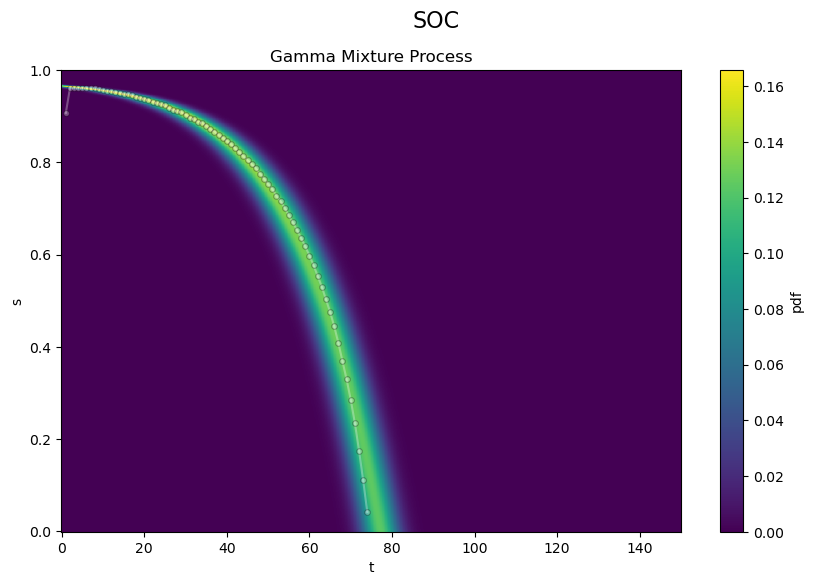

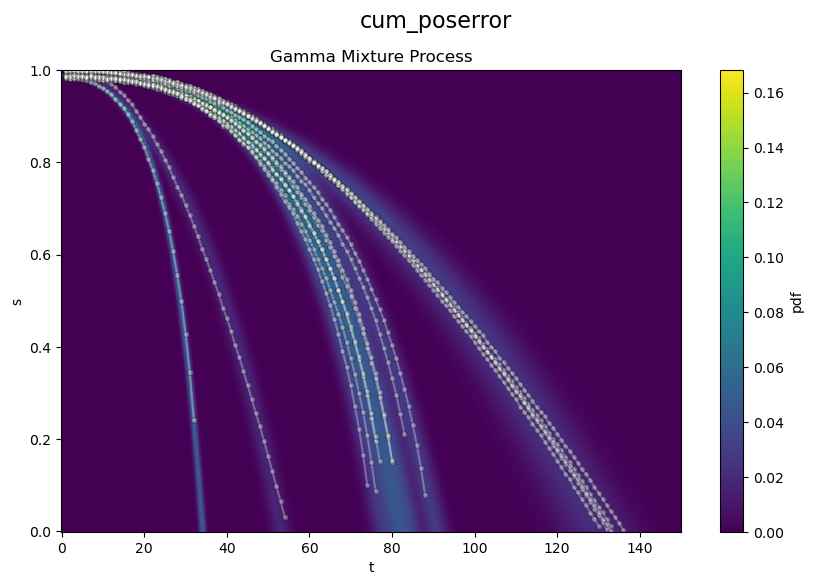

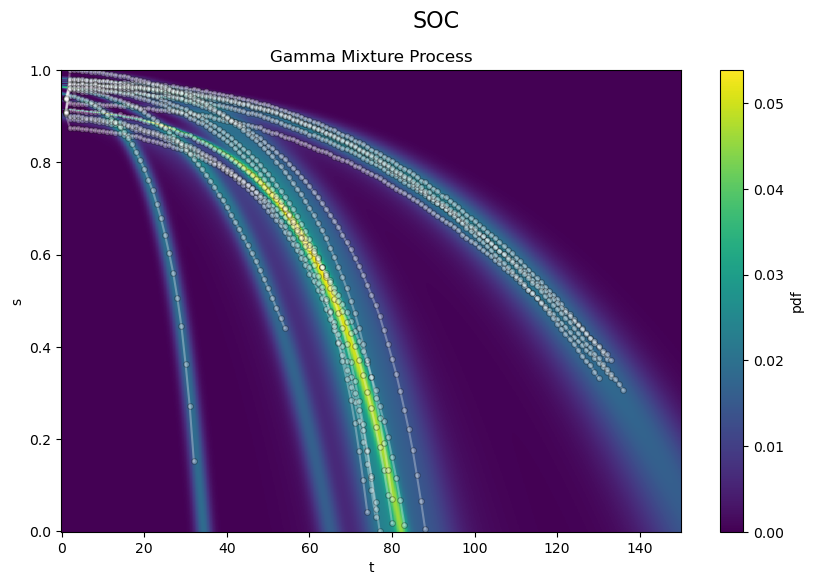

In [ ]:
resolution=1024
t_end=150
s = np.linspace(0,1,resolution)
t = np.linspace(0,t_end,resolution)

for i,t_train in enumerate(time_train):
    for (name,states),perf_train,perf_interp in zip(
        perform_states.items(),
        performs_train.values(),
        perform_train_interp.values()
        ):
        ParticleFilter.plot_states(
                np.stack(states[[i]],axis=0),
                t_end,
                t_train,
                perf_train[i],
                multiply_level=None,
                n_particles=None,
                title=name,
                resolution=1024)
        plt.show()


for (name,states),perf_train,perf_interp in zip(
    perform_states.items(),
    performs_train.values(),
    perform_train_interp.values()
    ):
    ParticleFilter.plot_states(
            np.stack(states,axis=0),
            t_end,
            time_train,
            perf_train,
            multiply_level=None,
            n_particles=None,
            title=name,
            resolution=1024)

## Save States

In [ ]:
with open(f'{exp}/states.pkl', 'wb') as f:
    dump(perform_states, f)
    
states_data_interp=time_train_interp,perform_train_interp
with open(f'{exp}/states_data_interp.pkl', 'wb') as f:
    dump(states_data_interp, f)

## Gamma mixture model 

In [ ]:
gmp_dic={}
for name,states in perform_states.items():
    mean,var,p,pos_mu,a=states.T
    shapes,rates=stats2params(mean,var) 
    N=len(states)
    scales=1/rates
    loc = -pos_mu
    weights=np.ones(N)/N
    gmp_dic[name]=GammaMixtureProcess(shapes,scales,p,loc,a,weights)

## Plots

In [ ]:
resolution=1024
s = np.linspace(0,1,resolution)
t = np.linspace(0,t_end,resolution)

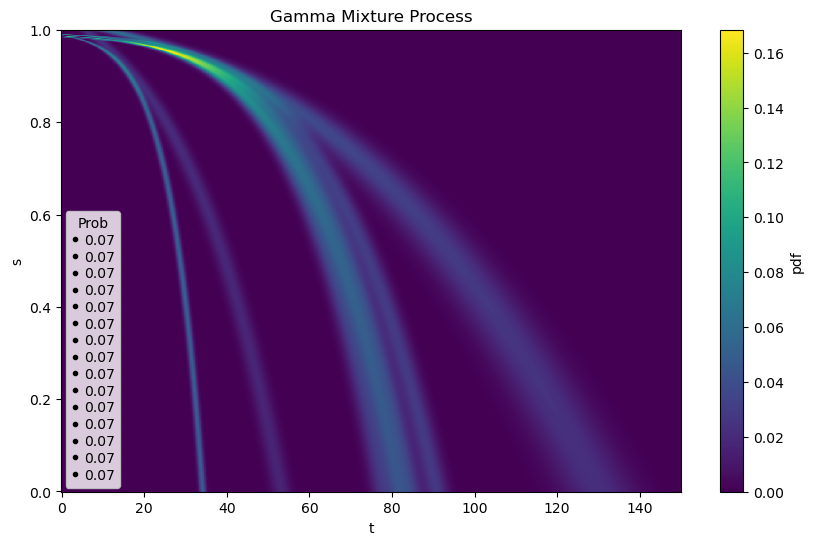

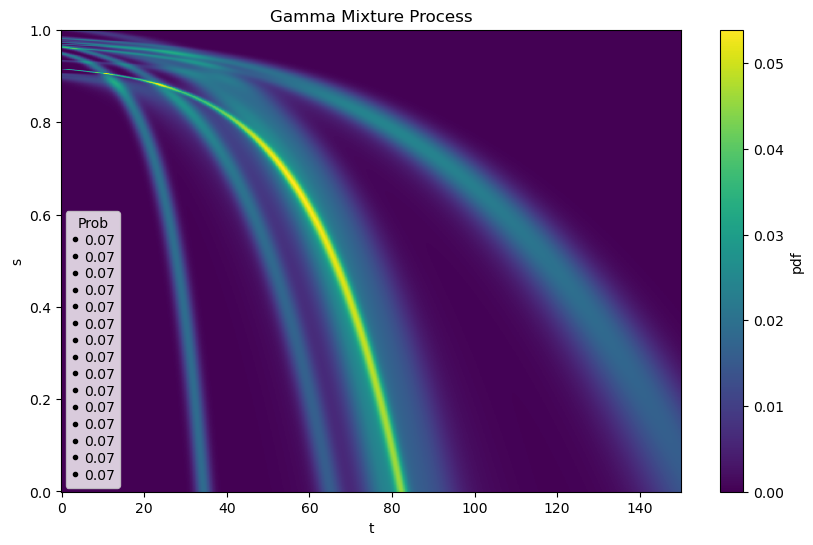

In [ ]:
for model in gmp_dic.values():
    ax=model.plot_dist(t,s,func='pdf',show_prob=True,gamma_prob=1) 
    plt.show()

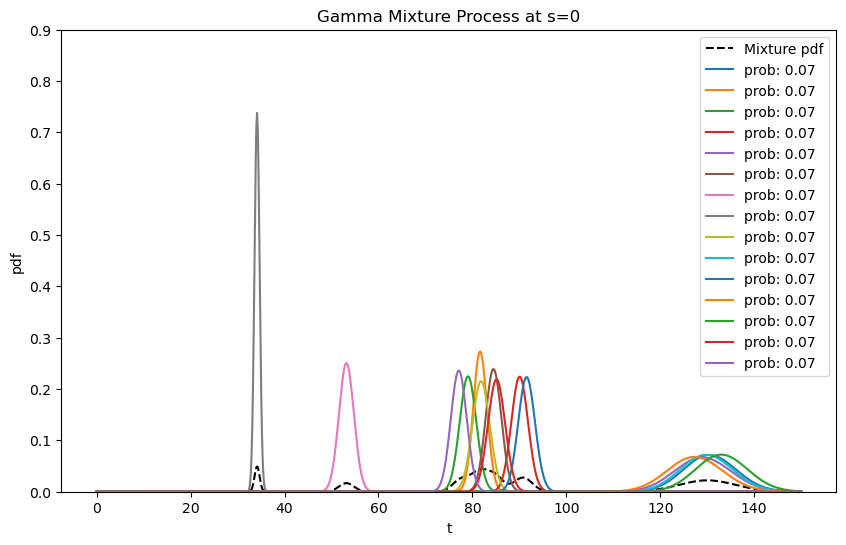

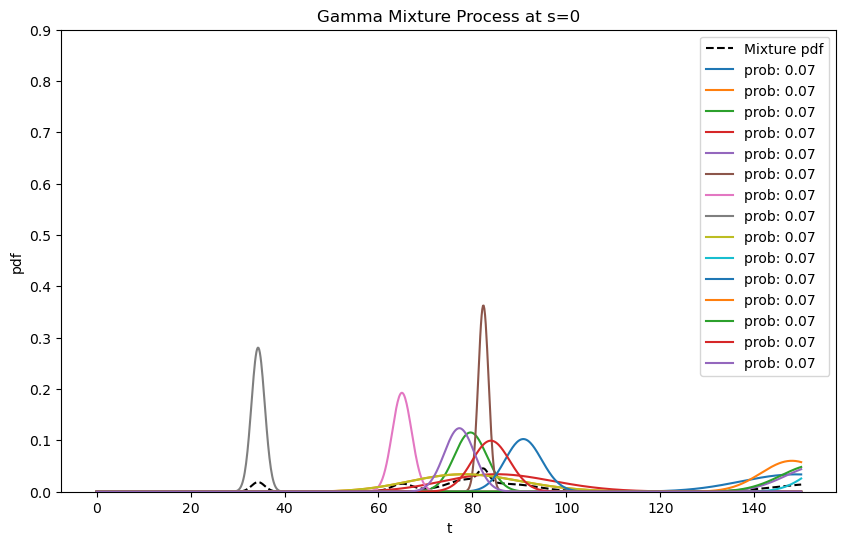

In [ ]:
for model in gmp_dic.values():
    ax=model.plot_rv_dist(t,s=0,func='pdf',show_prob=True,show_comp=True, max_prob=0.9,conf_level=0) 
    plt.show()

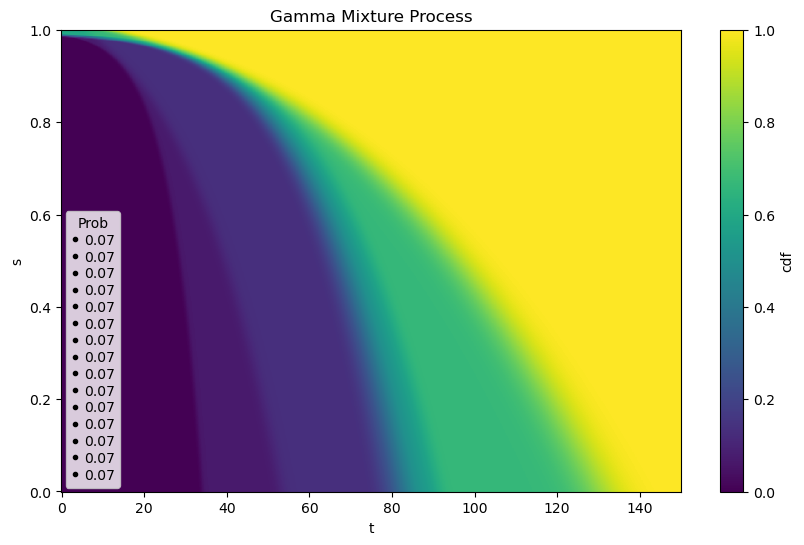

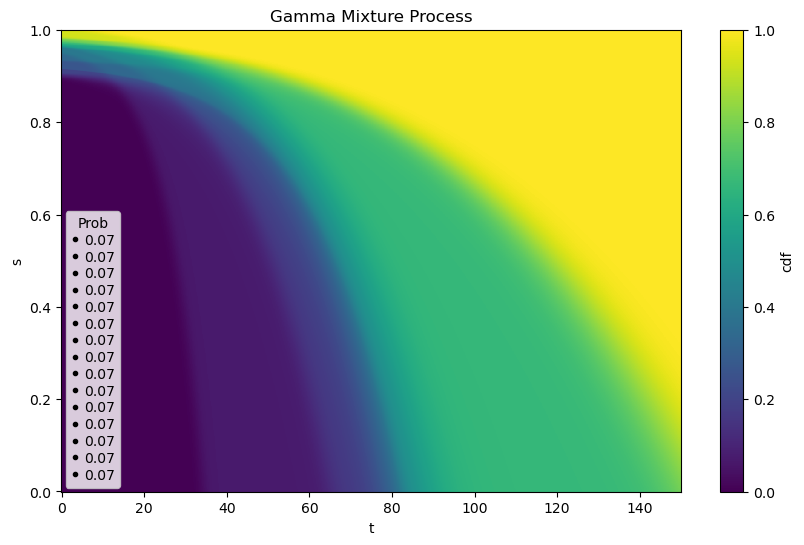

In [ ]:
for model in gmp_dic.values():
    ax=model.plot_dist(t,s,func='cdf',show_prob=True,gamma_prob=1) 
    plt.show()

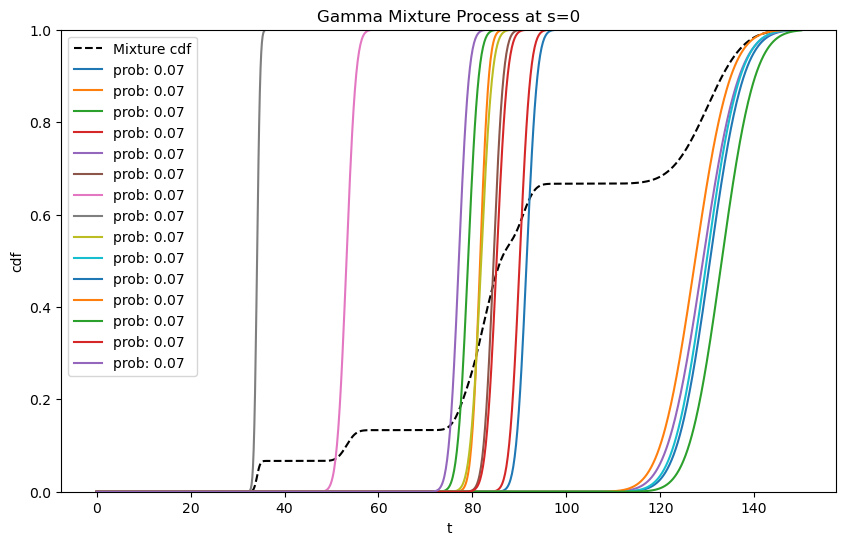

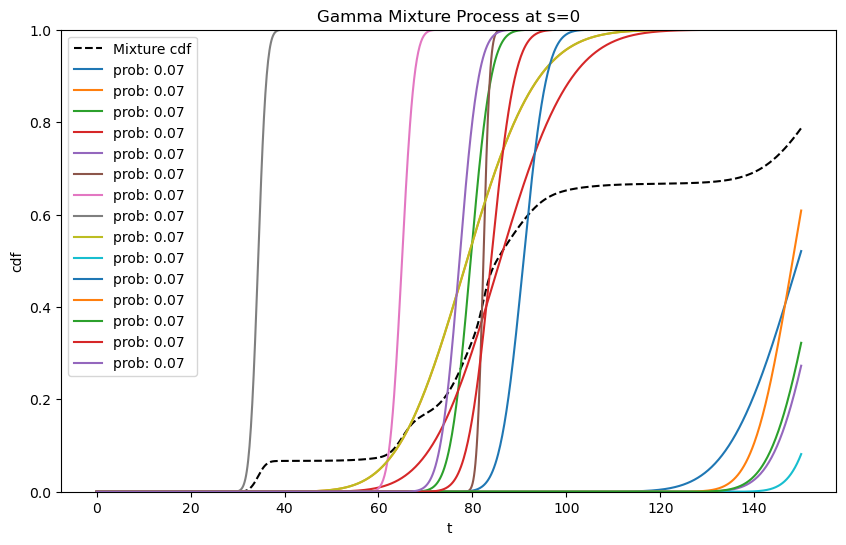

In [ ]:
for model in gmp_dic.values():
    ax=model.plot_rv_dist(t,s=0,func='cdf',show_prob=True,show_comp=True,conf_level=0) 
    plt.show()

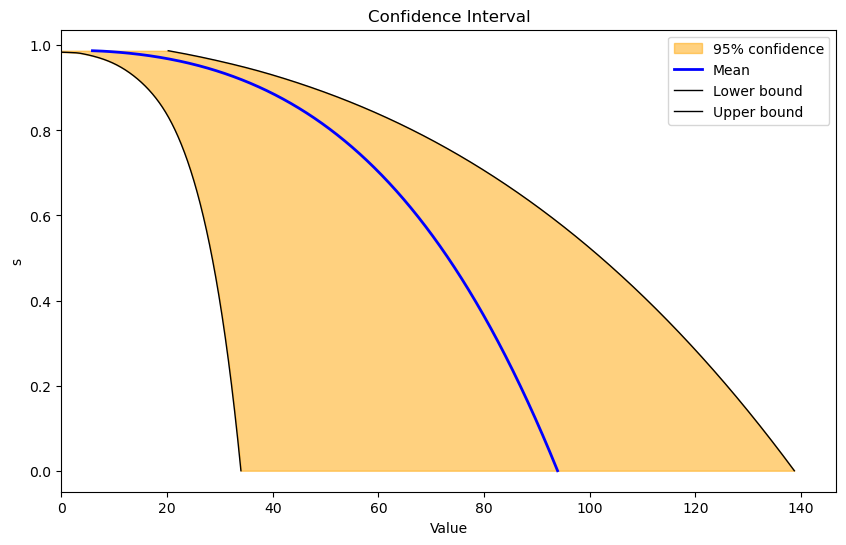

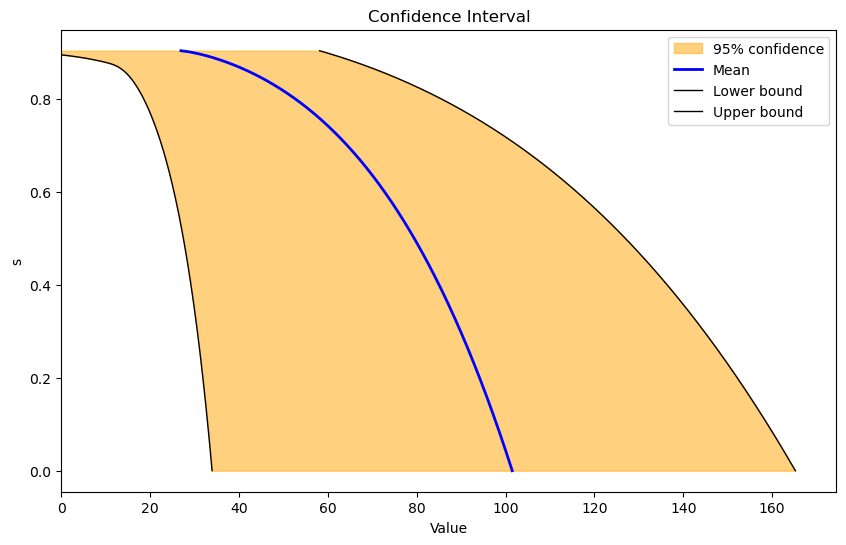

In [ ]:
level = 0.95
for name,model in gmp_dic.items():
    ax = model.plot_conf_interval(s,level=0.95)
    plt.show()

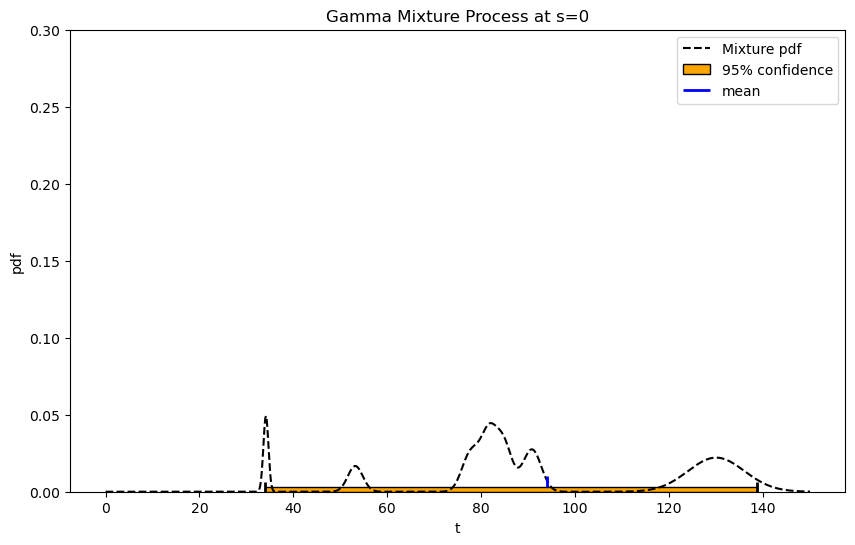

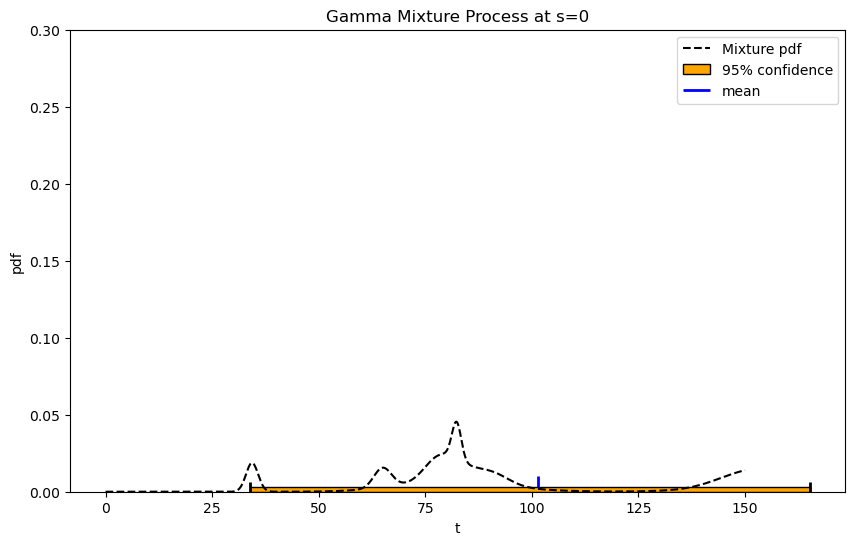

In [ ]:
for model in gmp_dic.values():
    ax=model.plot_rv_dist(t,s=0,func='pdf',show_prob=True,show_comp=False, max_prob=0.3,conf_level=0.95) 
    plt.show()

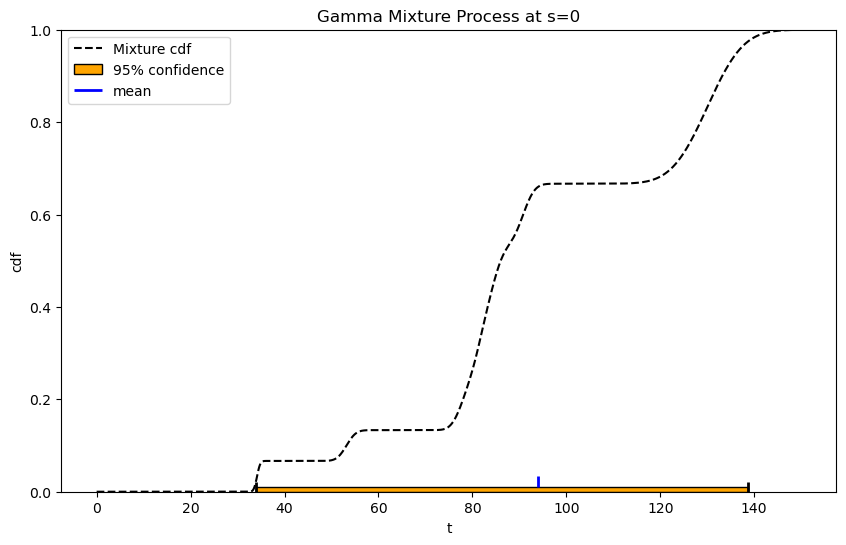

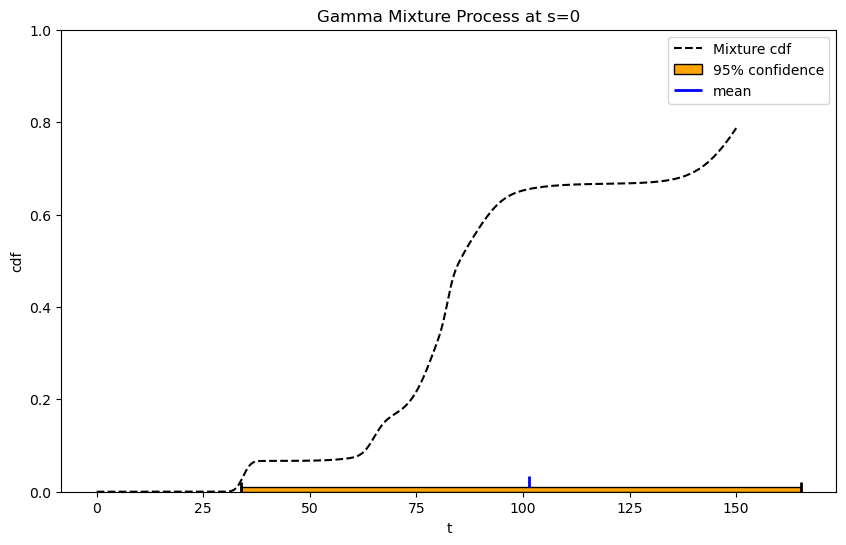

In [ ]:
for model in gmp_dic.values():
    model.plot_rv_dist(t,s=0,func='cdf',show_prob=True,show_comp=False,conf_level=0.95) 